In [1]:
import matplotlib.pyplot as plt
import numpy as np


from aart_func import *
import params
from params import * # The file params.py contains all the relevant parameters for the simulations
from astropy import units as u
import kgeo
import image_tools as tls
import subprocess
import scipy.interpolate
from scipy.interpolate import interp1d
import fileloading
import bigRunComputing
from matplotlib import ticker
import astroModels
from importlib import reload 
from matplotlib.lines import Line2D

%load_ext autoreload
%autoreload 2
import importlib 
from functools import partial
import astroModels
import runDataClass
import classRunComputing
import subprocess
from matplotlib.patches import Circle
import kgeo
import numpy as np
from matplotlib import ticker

import bareFileLoading as bfileloading
import EZPaths
import os

import astroPloting
import image_tools
from aart_func import *
from image_tools import curve_params
from params import *
import importlib
import params
import astroModels
import fileloading
from movieMakerV2 import movieMakerIntensity
import normalizingBrightparams
from astropy import units as u
import re

from matplotlib.ticker import (MultipleLocator, AutoMinorLocator)
from movieMakerV2 import intensityBlurr

Welcome to eht-imaging! v 1.2.7 



/home/td6241/anaconda3/envs/mural/lib/python3.12/site-packages/kgeo-0.0.1-py3.12.egg/kgeo/bfields.py:158: SyntaxWarning: invalid escape sequence '\m'
/home/td6241/anaconda3/envs/mural/lib/python3.12/site-packages/kgeo-0.0.1-py3.12.egg/kgeo/bfields.py:183: SyntaxWarning: invalid escape sequence '\m'
/home/td6241/anaconda3/envs/mural/lib/python3.12/site-packages/kgeo-0.0.1-py3.12.egg/kgeo/bfields.py:158: SyntaxWarning: invalid escape sequence '\m'
/home/td6241/anaconda3/envs/mural/lib/python3.12/site-packages/kgeo-0.0.1-py3.12.egg/kgeo/bfields.py:183: SyntaxWarning: invalid escape sequence '\m'


In [2]:

plt.rcParams.update({
    'font.size' : 14,                   # Set font size to 11pt
    'axes.labelsize': 14,               # -> axis labels
    'legend.fontsize': 12,              # -> legends
    'text.usetex': True,
    'text.latex.preamble': (            # LaTeX preamble
        r'\usepackage{lmodern}'
    ),
    'font.family': 'Latin Modern Roman',
})
n0_color = "#d55e00"
n1_color = "#0072b2"
n2_color = "#009e73"
cumu_color = "#cc79a7"


RingStyle ={
    "label": ['n=0','n=1','n=2','total'],
    "color": [n0_color,n1_color,n2_color,cumu_color],
    "linewidth": [3,3,3,4]
}
line_styles = {
    "lab_frame": "-",
    "rest_frame": "--",
    "thick":"-",
    "thin":"--"
}
xTickParams = {
    'length':15,
    'width': 1,
    'labelrotation': 0,
    'which':'major'
}

action = {
    "var": "nu0",
    "start": 10e9,
    "stop": 700e9,
    "step": 20e9,
    "images": True
}

conv_1_style = {
    "color": 'dimgrey',
    "linestyle": "-",
    "linewidth": 1
}
flux_peak_style = {
    "color": 'k',
    "linestyle": "-.",
    "linewidth": 2
}

r_outer_style = {
    "color": 'dimgrey',
    "linestyle": "-",
    "linewidth": 7
}

In [3]:
fig_home = '/home/td6241/results/aart/FinalFigs/'
fileloading.creatSubDirectory(fig_home)

Subdirectory for  '/home/td6241/results/aart/FinalFigs/' already exist, doing nothing


In [4]:
run2 = runDataClass.OctRun

bigRun2 = classRunComputing.BigRuns(
    run2.getRunName(),
    run2.getBrightparams(),
    run2.getBPVarNames(),
    run2.getGeoGrid(),
    run2.getGeoGridNames(),
    normalized_brightparams=run2.getIsNormalized(),
)

# ModelA32 = runDataClass.SingleModelData(bigRun2.getSubPaths(),run2.getRunName(),"ModelA_32")

Subdirectory for storing all run results '/scratch/gpfs/td6241/aart/bigRuns/' already exist, doing nothing
Subdirectory for storing this run result '/scratch/gpfs/td6241/aart/bigRuns/OctRun/' already exist, doing nothing
Subdirectory for images '/scratch/gpfs/td6241/aart/bigRuns/OctRun/Images/' already exist, doing nothing
Subdirectory for data '/scratch/gpfs/td6241/aart/bigRuns/OctRun/Data/' already exist, doing nothing
Subdirectory for inter model data '/scratch/gpfs/td6241/aart/bigRuns/OctRun/InterModel/' already exist, doing nothing
Subdirectory for  '/scratch/gpfs/td6241/aart/bigRuns/OctRun/Data/geo/' already exist, doing nothing
Subdirectory for  '/scratch/gpfs/td6241/aart/bigRuns/OctRun/Data/intensity/' already exist, doing nothing
Subdirectory for  '/scratch/gpfs/td6241/aart/bigRuns/OctRun/Data/numpy/' already exist, doing nothing
Subdirectory for  '/scratch/gpfs/td6241/aart/bigRuns/OctRun/Images/fluxVNu/' already exist, doing nothing
Subdirectory for  '/scratch/gpfs/td6241/aar

In [5]:
modelExample = "ModelC_221"
current_geo_model = fileloading.totalModelNametoGridModel(modelExample,bigRun2.run_type)
bfileloading.loadGeoModel(current_geo_model, run2.getRunName())()
importlib.reload(params)


Loading ModelC

file /scratch/gpfs/td6241/aart/bigRuns/OctRun/geoModels/ModelC.py Loaded as /home/td6241/repo/aart/params.py
Remember to call 'importlib.reload(params)' to reload parameters


<module 'params' from '/home/td6241/repo/aart/params.py'>

In [6]:
a = params.spin_case

inc = params.i_case * np.pi / 180  # inclination angle
rh = 1 + np.sqrt(1 - a ** 2)  # event horizon
# angles to sample
varphis = np.linspace(-180, 179, 360) * np.pi / 180

# generate inner shadow (n=0) curve with kgeo
# data_inner = kgeo.equatorial_lensing.rho_of_req(a, inc, rh, mbar=0, varphis=varphis)
# (_, rhos_inner, alphas_inner, betas_inner) = data_inner

# r_inner = image_tools.curve_params(varphis, rhos_inner)

# generate outer shadow (n=inf) curve with kgeo
data_outer = kgeo.equatorial_lensing.rho_of_req(a, inc, rh, mbar=5, varphis=varphis)
(_, rhos_outer, alphas_outer, betas_outer) = data_outer

r_outer = image_tools.curve_params(varphis, rhos_outer)

In [7]:
current_geo_model = fileloading.totalModelNametoGridModel(modelExample,bigRun2.run_type)

lband = bigRun2.sub_paths["GeoDoth5Path"] + current_geo_model + "Lensing" + ".h5"
rtray = bigRun2.sub_paths["GeoDoth5Path"] + current_geo_model + "RayTracing" + ".h5"


print("Reading file: ",lband)

h5f = h5py.File(lband,'r')

#Points for the boundary of the BH shadow
alpha_critc=h5f['alpha'][:]
beta_critc=h5f['beta'][:]

#The concave hulls for the lensing bands
hull_0i=h5f['hull_0i'][:]
hull_0e=h5f['hull_0e'][:]
hull_1i=h5f['hull_1i'][:]
hull_1e=h5f['hull_1e'][:]
hull_2i=h5f['hull_2i'][:]
hull_2e=h5f['hull_2e'][:]

#The grid points for each lensing band
supergrid0=h5f['grid0'][:]
N0=int(h5f["N0"][0])
mask0=h5f['mask0'][:]
lim0=int(h5f["lim0"][0])
supergrid1=h5f['grid1'][:]
N1=int(h5f["N1"][0])
mask1=h5f['mask1'][:]
lim1=int(h5f["lim1"][0])
supergrid2=h5f['grid2'][:]
N2=int(h5f["N2"][0])
mask2=h5f['mask2'][:]
lim2=int(h5f["lim2"][0])

h5f.close()


Reading file:  /scratch/gpfs/td6241/aart/bigRuns/OctRun/Data/geo/ModelCLensing.h5


In [8]:
fnbands=rtray

print("Reading file: ",fnbands)

h5f = h5py.File(fnbands,'r')

rs0=h5f['rs0'][:]
sign0=h5f['sign0'][:]
rs1=h5f['rs1'][:]
sign1=h5f['sign1'][:]
rs2=h5f['rs2'][:]
sign2=h5f['sign2'][:]
h5f.close()

Reading file:  /scratch/gpfs/td6241/aart/bigRuns/OctRun/Data/geo/ModelCRayTracing.h5


# Power Laws

In [9]:
powerLawColors = {
    'shallow':RingStyle['color'][0],
    'fiducial':RingStyle['color'][1],
    'steeper': RingStyle['color'][2]
}

In [10]:
shallowModel =  'ModelC_331'
fiducialModel = 'ModelC_221'
steeperModel =  'ModelC_111'

In [12]:
shallowp = bigRun2.getRadialProfiles(shallowModel,rrange=(2,20),num_of_points=100,scale='log',theta_bkey=1,lab_frame=True)
fiducialp = bigRun2.getRadialProfiles(fiducialModel,rrange=(2,20),num_of_points=100,scale='log',theta_bkey=1,lab_frame=True)
steeperp = bigRun2.getRadialProfiles(steeperModel,rrange=(2,20),num_of_points=100,scale='log',theta_bkey=1,lab_frame=True)

# '/scratch/gpfs/td6241/aart/bigRuns/PRUN/Data/intensity/ModelC_22/clean/numpy'

In [13]:
halfway = int(fiducialp['n0_si_thick'][0].shape[0] / 2)

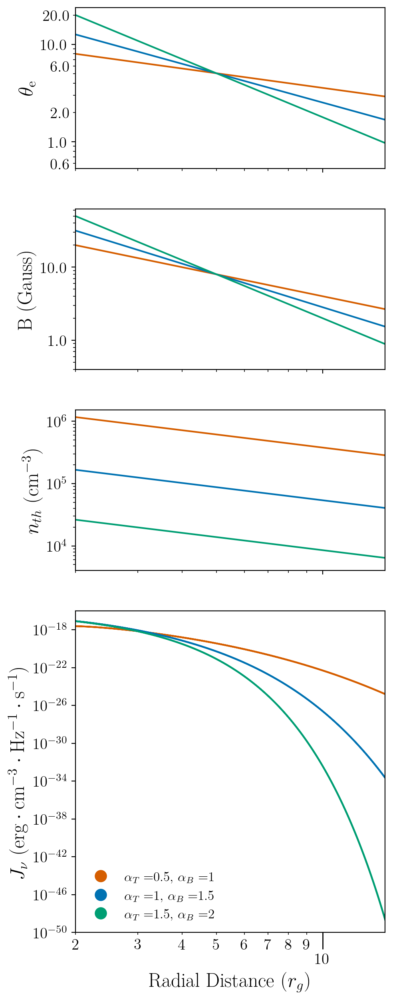

In [15]:
fig = plt.subplots(4,1, sharex='col', figsize=(5,15), dpi=200, height_ratios=[1,1,1,2])
ax = [None, None, None, None]

i=0
n=70000
# Subplot 1-----------------------------------------
ax[0] = plt.subplot(4,1,1)
ax[0].plot(shallowp['r'],shallowp["theta_e"], powerLawColors['shallow'])
ax[0].plot(fiducialp['r'],fiducialp["theta_e"], powerLawColors['fiducial'])
ax[0].plot(steeperp['r'],steeperp["theta_e"], powerLawColors['steeper'])

ax[0].set_ylabel(R'$\rm \theta_e$', fontsize=18)
ax[0].set_yscale('log')

# ax.tick_params('x', which="both", labelbottom=False)

ax[0].tick_params('y', which="both", labelleft=True)
ax[0].yaxis.set_major_formatter(ticker.FormatStrFormatter("%.1f"))
ax[0].yaxis.set_minor_formatter(ticker.FormatStrFormatter("%.1f"))
    
n = 4  # Keeps every 4th label
[l.set_visible(False) for (i, l) in enumerate(ax[0].yaxis.get_minorticklabels()) if i % n != 0]
        
            
# Subplot 2-----------------------------------------
ax[1] = plt.subplot(4,1,2)

ax[1].plot(shallowp['r'],shallowp["b"], powerLawColors['shallow'])
ax[1].plot(fiducialp['r'],fiducialp["b"], powerLawColors['fiducial'])
ax[1].plot(steeperp['r'],steeperp["b"], powerLawColors['steeper'])

ax[1].set_yscale('log')
ax[1].set_ylabel('B (Gauss)', fontsize=18)
ax[1].yaxis.set_major_formatter(ticker.FormatStrFormatter("%.1f"))
# Subplot 3-----------------------------------------
ax[2] = plt.subplot(4,1,3)

ax[2].plot(shallowp['r'],shallowp["nth"], powerLawColors['shallow'])
ax[2].plot(fiducialp['r'],fiducialp["nth"], powerLawColors['fiducial'])
ax[2].plot(steeperp['r'],steeperp["nth"], powerLawColors['steeper'])

ax[2].set_ylabel(R'$n_{th}$ (' + '{})'.format(R'$\rm cm^{-3}$'), fontsize=18)
ax[2].set_yscale('log')


Legendlines = [
    Line2D([0],[0],marker='o', markerfacecolor=powerLawColors['shallow'], color='w', markersize=12),
    Line2D([0],[0],marker='o', markerfacecolor=powerLawColors['fiducial'], color='w', markersize=12),
    Line2D([0],[0],marker='o', markerfacecolor=powerLawColors['steeper'], color='w', markersize=12),
    # Line2D([0],[0],marker='o', markerfacecolor=ringColors[3], color='w', markersize=12),
]

Legendlabels = [
    R"$\alpha_T=$" + R"${}$".format(str(np.abs(bigRun2[shallowModel]['bp']["p_temp"]))) + R", $\alpha_B=$" + R"${}$".format(str(np.abs(bigRun2[shallowModel]['bp']["p_mag"]))),
    R"$\alpha_T=$" + R"${}$".format(str(np.abs(bigRun2[fiducialModel]['bp']["p_temp"]))) + R", $\alpha_B=$" + R"${}$".format(str(np.abs(bigRun2[fiducialModel]['bp']["p_mag"]))),
    R"$\alpha_T=$" + R"${}$".format(str(np.abs(bigRun2[steeperModel]['bp']["p_temp"]))) + R", $\alpha_B=$" + R"${}$".format(str(np.abs(bigRun2[steeperModel]['bp']["p_mag"])))
    # "Total",
          ]


# ax[2].legend(Legendlines,Legendlabels)

# ax[1].yaxis.set_minor_formatter(ticker.FormatStrFormatter("%.0f"))
    
# Subplot 4-----------------------------------------
ax[3] = plt.subplot(4,1,4)

# shallowp = bigRun2.getRadialProfiles(shallowModel,rrange=(2,20),num_of_points=100,scale='log',theta_bkey=1,lab_frame=True)
# fiducialp = bigRun2.getRadialProfiles(fiducialModel,rrange=(2,20),num_of_points=100,scale='log',theta_bkey=1,lab_frame=True)
# steeperp 
# ax[3].plot(fiducialp['r'], fiducialp['si_thick'], color=RingStyle["color"][0],linestyle=line_styles["rest_frame"])
ax[3].plot(shallowp['n0_si_thick'][0,:,halfway],shallowp['n0_si_thick'][7,:,halfway], color=powerLawColors['shallow'])

ax[3].plot(fiducialp['n0_si_thick'][0,:,halfway],fiducialp['n0_si_thick'][7,:,halfway], color=powerLawColors['fiducial'])

ax[3].plot(steeperp['n0_si_thick'][0,:,halfway],steeperp['n0_si_thick'][7,:,halfway], color=powerLawColors['steeper'])

ax[3].set_ylabel(R'$J_\nu$ ($\rm erg \cdot cm^{-3} \cdot Hz^{-1} \cdot s^{-1}$)', fontsize=18)
ax[3].set_yscale('log')
ax[3].set_xscale('log')
ax[3].minorticks_on()
ax[3].xaxis.set_major_formatter(ticker.FormatStrFormatter("%.0f"))
ax[3].xaxis.set_minor_formatter(ticker.FormatStrFormatter('%.0f'))
ax[3].set_xlabel('Radial Distance ({})'.format(R'$r_g$'), fontsize=18 )
ax[3].set_xlim([2,15])

# ax[3].tick_params('y', which="both", labelleft=True)
# ax[3].yaxis.set_major_formatter(ticker.FormatStrFormatter("%.0f"))
# ax[3].yaxis.set_minor_formatter(ticker.FormatStrFormatter("%.0f"))
    
# n = 5  # Keeps every 4th label
# [l.set_visible(False) for (i, l) in enumerate(ax[0].yaxis.get_minorticklabels()) if i % n != 0]

# Legendlines = [
#     Line2D([0],[0],linestyle='-', markerfacecolor='k', color='w', markersize=12),

#     ]
# Legendlabels = [
#     R"$\alpha_T=$" + R"${}$".format(str(bigRun2[fiducialModel]['bp']["p_temp"])) + R", $\alpha_B=$" + R"${}$".format(str(bigRun2[fiducialModel]['bp']["p_mag"])),
#           ]


ax[3].legend(Legendlines,Legendlabels,frameon=False,loc='lower left')
ax[3].set_ylim([1e-50,1e-16])
ax[3].tick_params('x', 
                  length=xTickParams["length"], 
                  width=xTickParams["width"], 
                  which=xTickParams["which"], 
                  labelrotation=xTickParams["labelrotation"])
ax[0].set_rasterization_zorder(0) 
ax[1].set_rasterization_zorder(0) 
ax[2].set_rasterization_zorder(0) 

plt.savefig(fig_home + "emission_profiles.png", dpi=200, bbox_inches='tight')

# Flux Versus Observation Freq

In [16]:
RingStyle["linewidth"]=[3,3,3,2]

In [17]:
def createFluxRadiiGraph(ax,xaxis,janksys_thin,janksys_thick,fiducial_thin=None,fiducial_thick=None):

    ax.plot(xaxis, janksys_thin[:, 0], '-', label='n=0', color='tab:red', linewidth=3)
    janksky_line_style ={
        "label": ['n=0','n=1','n=2','total'],
        "color": [n0_color,n1_color,n2_color,cumu_color],
        "linewidth": [3,3,3,4]
    }

    amount_to_plot = 4
    

    if fiducial_thin is not None:
        for i in (range(amount_to_plot)):
            ax.plot(xaxis, 
                    fiducial_thin[:, i], 
                    line_styles["thin"],
                    label=RingStyle["label"][i], 
                    color=RingStyle["color"][i],
                    linewidth=RingStyle["linewidth"][i],
                    alpha=0.3)

            ax.plot(xaxis, fiducial_thick[:, i], 
                    line_styles["thick"],
                    label=RingStyle["label"][i], 
                    color=RingStyle["color"][i],
                    linewidth=RingStyle["linewidth"][i],
                    alpha=0.3)
            
    for i in (range(amount_to_plot)):
        ax.plot(xaxis, 
                janksys_thin[:, i], 
                line_styles["thin"],
                label=RingStyle["label"][i], 
                color=RingStyle["color"][i],
                linewidth=RingStyle["linewidth"][i])

        ax.plot(xaxis, 
                janksys_thick[:, i], 
                line_styles["thick"],
                label=RingStyle["label"][i], 
                color=RingStyle["color"][i],
                linewidth=RingStyle["linewidth"][i])
        


    # ax.axvline(poi["flux_peak_thin"], color=flux_peak_style["color"],
    #            linestyle=flux_peak_style["linestyle"], linewidth=flux_peak_style["linewidth"])

    # Labels

    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.xaxis.set_minor_formatter(ticker.FormatStrFormatter('%.0f'))
    ax.xaxis.set_major_formatter(ticker.FormatStrFormatter("%.0f"))
    # ax.yaxis.set_minor_formatter(ticker.FormatStrFormatter('%.1f'))
    # ax.yaxis.set_major_formatter(ticker.FormatStrFormatter("%.1f"))
    # ax1.yaxis.set_minor_formatter(ticker.FormatStrFormatter('%.4f'))
    # ax.yaxis.set_major_formatter(ticker.FormatStrFormatter("%.0e"))

    ax.tick_params('x', which="both", labelbottom=False)
    ax.tick_params('y', which="both", labelleft=False)

    n = 4  # Keeps every 4th label
    [l.set_visible(False) for (i, l) in enumerate(ax.xaxis.get_minorticklabels()) if i % n != 0]
    ax.tick_params('both', length=10, width=1, which='major')
    ax.set_xlim(xaxis[0], xaxis[xaxis.size - 1])
    ax.set_ylim(10e-5, 10e1)
    # ax.legend(loc='upper right')

    new_ticks = [xaxis[0], 230, xaxis[xaxis.size - 1]]
    ax.set_xticks(new_ticks)
    


    # ax.legend(Legendlines,Legendlabels)
    # ax.tick_params('x', length=10, width=1, which='major', labelrotation=90)


In [18]:
modelName = ["te0->5e10","te0->1e11"]

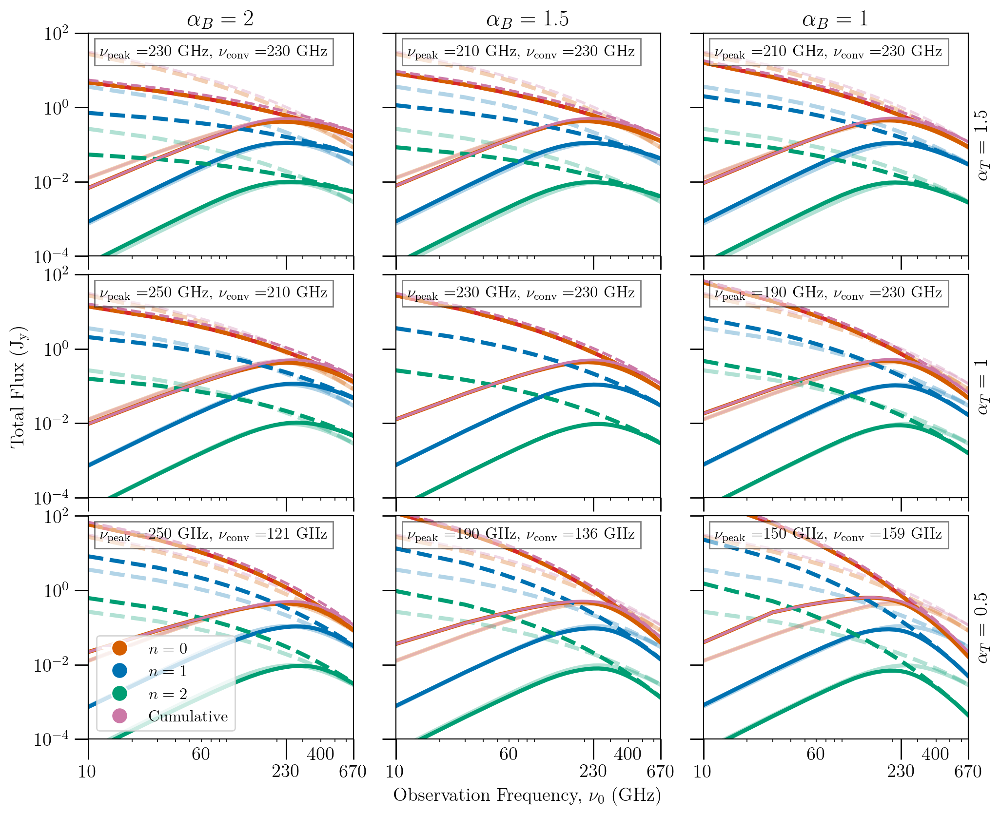

In [33]:

fig, ax = plt.subplots(3, 3, figsize=[10,8], dpi=200,sharex="col",sharey="row")
ax = np.array([[None, None, None],[None, None, None],[None, None, None]])
fig.tight_layout(h_pad=0.08,w_pad=1)

ploty = [1,4,7]
plotx = [7,8,9]

alphaBlabel = [1,2,3]
alphaTlabel = [3,6,9]

k = 1
temodel = 0
fiducial_thin=bigRun2[2,1,1,temodel]['np']['jansky_thin']()
fiducial_thick=bigRun2[2,1,1,temodel]['np']['jansky_thick']()
for i in range(3):
    for j in range(3):
        # xaxis = np.array(model_list[i,j]["x_variable"]) / astroModels.scale_label["nu0"]
        # janksys_thin = model_list[i,j]["janksys_thin"]
        # janksys_thick = model_list[i,j]["janksys_thick"]
        #         xaxis = np.array(model_list[i,j]["x_variable"]) / astroModels.scale_label["nu0"]
        # janksys_thin = model_list[i,j]["janksys_thin"]
        # janksys_thick = model_list[i,j]["janksys_thick"]
        currentModel = bigRun2[2,i,j,temodel]
        conv = currentModel['conv'](3)/1e9
        flux_peak = currentModel['flux_peak'](3)/1e9
        ax[i,j] = plt.subplot(3,3,k)
        createFluxRadiiGraph(
            ax[i,j],
            currentModel['np']['xvar']() / 1e9,
            currentModel['np']['jansky_thin'](),
            currentModel['np']['jansky_thick'](),
            fiducial_thin,
            fiducial_thick)
        
        text = R"$\nu_{\rm peak}=$" + str("{:.0f}".format(flux_peak)) + ' ' + astroModels.units_label["nu0"]  + R", $\nu_{\rm conv}=$" + str("{:.0f}".format(conv)) + ' ' + astroModels.units_label["nu0"]
        t = ax[i,j].text(12, 25, text , fontsize=12, color="k")
        t.set_bbox(dict(facecolor='white', alpha=0.5, edgecolor='black'))
        
        if k == 7:
            
            Legendlines = [
                Line2D([0],[0],marker='o', markerfacecolor=RingStyle["color"][0], color='w', markersize=12),
                Line2D([0],[0],marker='o', markerfacecolor=RingStyle["color"][1], color='w', markersize=12),
                Line2D([0],[0],marker='o', markerfacecolor=RingStyle["color"][2], color='w', markersize=12),
                Line2D([0],[0],marker='o', markerfacecolor=RingStyle["color"][3], color='w', markersize=12),
            ]
            Legendlabels = [
                R"$n=0$",
                R"$n=1$",
                R"$n=2$",
                "Cumulative",
                  ]

            ax[i,j].legend(Legendlines,Legendlabels)
            
        if k == 4:
            ax[i,j].set_ylabel("Total Flux ({})".format(R'$\rm J_y$'))
        
        if k == 8:
            ax[i,j].set_xlabel(R"Observation Frequency, $\nu_0$ (GHz)")
            
        if k in ploty:
            ax[i,j].tick_params('y', which="both", labelleft=True)
        
        if k in plotx:
            ax[i,j].tick_params('x', which="both", labelbottom=True)
            
            
            n = 6  # Keeps every 4th label
            [l.set_visible(False) for (i, l) in enumerate(ax[i,j].xaxis.get_minorticklabels()) if i % n != 0]
            ax[i,j].tick_params('x', 
                  length=xTickParams["length"], 
                  width=xTickParams["width"], 
                  which=xTickParams["which"], 
                  labelrotation=xTickParams["labelrotation"])
            
        if k in alphaBlabel:
            ax[i,j].title.set_text(R'$\alpha_B=$ ' + str(np.abs(currentModel['bp']["p_mag"])))
            
        if k in alphaTlabel:
            ax[i,j].set_ylabel(R'$\alpha_T=$ ' + str(np.abs(currentModel['bp']["p_temp"])))
            ax[i,j].yaxis.set_label_position('right')
        
        ax[i,j].set_rasterization_zorder(0) 
        k += 1
        
# plt.savefig(fig_home + "FluxVRadGrid",dpi=200,bbox_inches='tight')

# Radii Vs Observation freq

In [19]:
def radiiVersusFreq(ax,xaxis,mean_radii,conv_1=None,flux_peak=None,r_outer=None):
    
    if conv_1 is not None:
        ax.axvline(conv_1,
                   color=conv_1_style["color"], 
                   linestyle=conv_1_style["linestyle"], 
                   linewidth=conv_1_style["linewidth"]
                  )
    
    if flux_peak is not None:
        ax.axvline(flux_peak, color=flux_peak_style["color"], 
                   linestyle=flux_peak_style["linestyle"], 
                   linewidth=flux_peak_style["linewidth"]
                  )
    
    if r_outer is not None:
        ax.axhline(r_outer,
                   color=r_outer_style["color"],
                   linestyle=r_outer_style["linestyle"], 
                   linewidth=r_outer_style["linewidth"],
                   alpha=0.3
                  )


    amount_to_plot = 4

    for i in reversed(range(amount_to_plot)):
        ax.plot(xaxis, mean_radii[:, i],
                 "-", 
                 label=RingStyle["label"][i],
                 color=RingStyle["color"][i], 
                 linewidth=RingStyle["linewidth"][i])


    # Labels
    # ax.set_xlabel(astroModels.var_label["nu0"].replace('=', '')
    #                + ' (' + astroModels.units_label["nu0"] + ')')
    ax.set_xscale('log')
    ax.set_yscale('log')

    ax.xaxis.set_minor_formatter(ticker.FormatStrFormatter('%.0f'))
    ax.xaxis.set_major_formatter(ticker.FormatStrFormatter("%.0f"))
    ax.yaxis.set_minor_formatter(ticker.FormatStrFormatter('%.1f'))
    ax.yaxis.set_major_formatter(ticker.FormatStrFormatter("%.1f"))

    new_ticks = [xaxis[0], 230, xaxis[xaxis.size - 1]]
    ax.set_xticks(new_ticks)

    # new_ticks = np.append(ax1.get_yticks(), r_outer)
    # new_ticks = np.append(new_ticks, r_inner)
    # print(new_ticks)
    # ax1.set_yticks(new_ticks)
    n = 4  # Keeps every 4th label
    [l.set_visible(False) for (i, l) in enumerate(ax.xaxis.get_minorticklabels()) if i % n != 0]
    ax.set_xlim(xaxis[0], xaxis[xaxis.size - 1])

#     ax.set_ylim(0, 6)
    
    ax.tick_params('x', which="both", labelbottom=False)
    ax.tick_params('y', which="both", labelleft=False)



    # ax.tick_params('x', length=20, width=1, which='major', labelrotation=80)

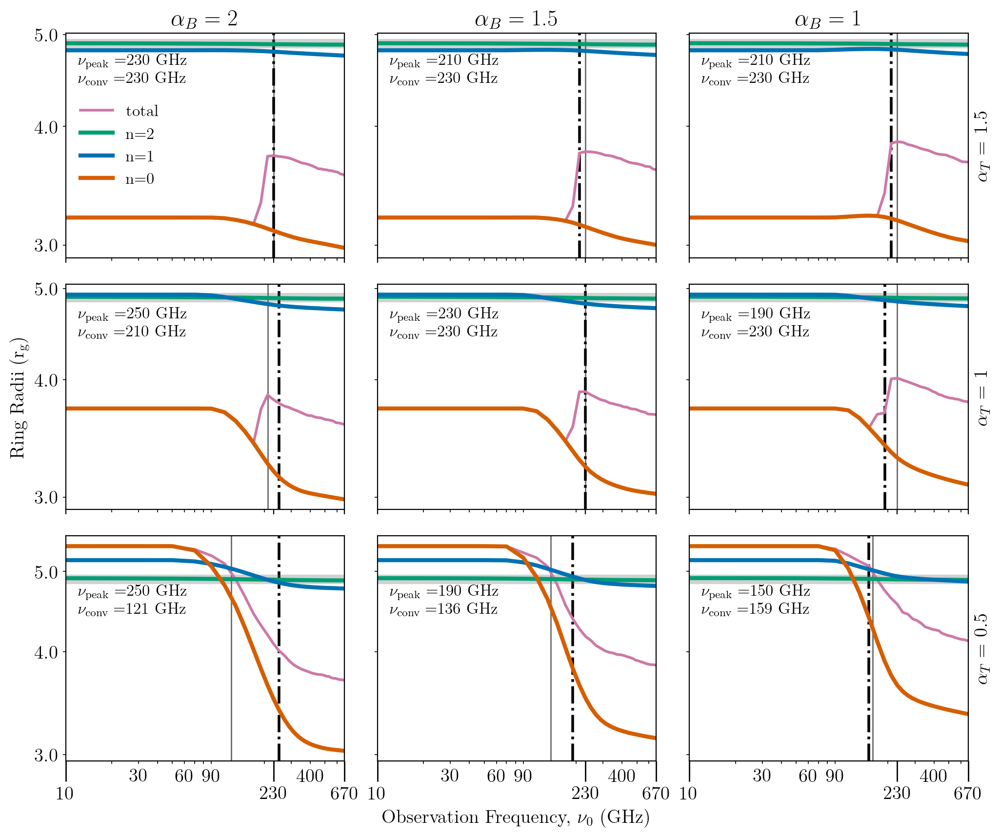

In [20]:

fig, ax = plt.subplots(3, 3, figsize=[10,8], dpi=200,sharex="col",sharey="row")
# fig.suptitle('Full Solution', fontsize=16,y=1.03)
ax = np.array([[None, None, None],[None, None, None],[None, None, None]])
fig.tight_layout(pad=.5)

ploty = [1,4,7]
plotx = [7,8,9]

alphaBlabel = [1,2,3]
alphaTlabel = [3,6,9]
temodel = 0
spin = 2

k = 1
for i in range(3):
    for j in range(3):
        current_model = bigRun2[spin,i,j,temodel]
        conv = current_model['conv'](3)/1e9
        flux_peak = current_model['flux_peak'](3)/1e9
        
        ax[i,j] = plt.subplot(3,3,k)
        radiiVersusFreq(ax[i,j],
                        current_model['np']['xvar']() / 1e9,
                        current_model['np']['radVnu_thick'](),
                        conv,
                        flux_peak,
                        r_outer
                       )
        if k == 4:
            ax[i,j].set_ylabel("Ring Radii ({})".format(R'$\rm r_g$'))
        
        text = R"$\nu_{\rm peak}=$" + str("{:.0f}".format(flux_peak)) + ' ' + astroModels.units_label["nu0"] +"\n" + R" $\nu_{\rm conv}=$" + str("{:.0f}".format(conv)) + ' ' + astroModels.units_label["nu0"]
        props = dict(boxstyle='round', facecolor='white', alpha=0.5)
        
        if k == 1:
            ax[i,j].legend(frameon=False)
            # ax[i,j].text(12, 4.45, text , fontsize=12, color="k",bbox=props)
        
        
#         if i == 0:
#             t = ax[i,j].text(12, 4.45, text , fontsize=12, color="k")
#         else:
#             t = ax[i,j].text(12, 3.0, text , fontsize=12, color="k")
            
        t = ax[i,j].text(12, 4.45, text , fontsize=12, color="k")
        # t.set_bbox(dict(facecolor='grey', alpha=0.2, edgecolor='black'))
        
        if k == 8:
            ax[i,j].set_xlabel(R"Observation Frequency, $\nu_0$ (GHz)")
            
        if k in ploty:
            ax[i,j].tick_params('y', which="both", labelleft=True)
        
        if k in plotx:
            ax[i,j].tick_params('x', which="both", labelbottom=True)
            n = 3  # Keeps every 4th label
            [l.set_visible(False) for (i, l) in enumerate(ax[i,j].xaxis.get_minorticklabels()) if i % n != 0]
            ax[i,j].tick_params('x', 
                  length=xTickParams["length"], 
                  width=xTickParams["width"], 
                  which=xTickParams["which"], 
                  labelrotation=xTickParams["labelrotation"])
            
        if k in alphaBlabel:
            ax[i,j].title.set_text(R'$\alpha_B=$ ' + str(np.abs(current_model['bp']["p_mag"])))
            
        if k in alphaTlabel:
            ax[i,j].set_ylabel(R'$\alpha_T=$ ' + str(np.abs(current_model['bp']["p_temp"])))
            ax[i,j].yaxis.set_label_position('right')
        
        ax[i,j].set_rasterization_zorder(0) 
        k += 1

# fig.suptitle(R"$T_{e,0} = $" + "{:.1e}".format(currentModel['bp']['t_e0']),y=1.005)
        
# plt.savefig(fig_home + "RadVNuGrid.png" ,dpi=200,bbox_inches='tight')
# plt.savefig(fig_home + "RadVNuGrid" + 'spin_' + str(spin),dpi=400,bbox_inches='tight')

Text(3.8, 3.2, 'Ring Radii ($\\rm r_g$)')

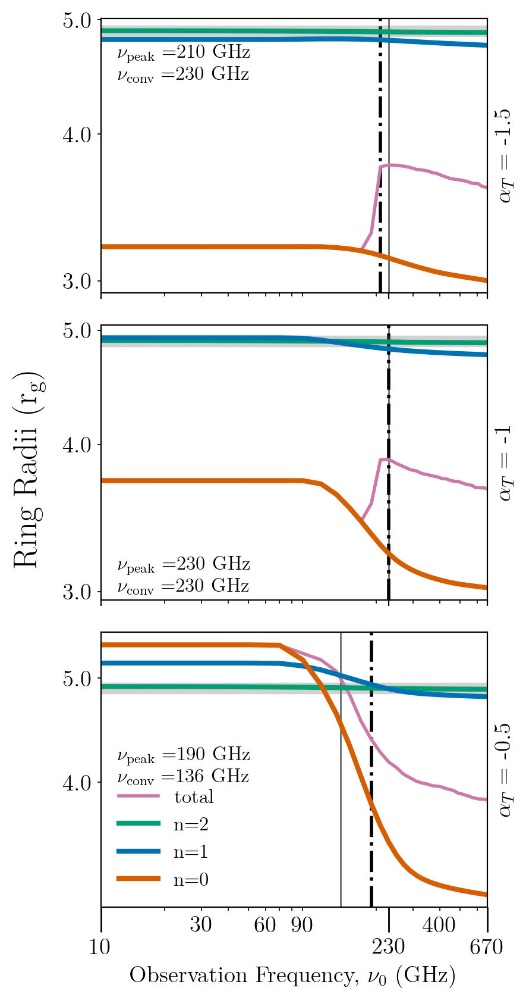

In [39]:

fig, ax = plt.subplots(3, 1, figsize=[4,8], dpi=200,sharex="col",sharey="row")
# fig.suptitle('Full Solution', fontsize=16,y=1.03)
# ax = np.array([[None, None, None],[None, None, None],[None, None, None]])
fig.tight_layout(pad=.5)

ploty = [1,4,7]
plotx = [7,8,9]

alphaBlabel = [1,2,3]
alphaTlabel = [3,6,9]
temodel = 0
text =[None,None,None] 
k = 1
for j in range(3):
    i=1
    current_model = bigRun2[2,j,i,temodel]
    conv = current_model['conv'](3)/1e9
    flux_peak = current_model['flux_peak'](3)/1e9

    # ax[i,j] = plt.subplot(3,3,k)
    radiiVersusFreq(ax[j],
                    current_model['np']['xvar']() / 1e9,
                    current_model['np']['radVnu_thick'](),
                    conv,
                    flux_peak,
                    r_outer
                   )
    # if k == 4:
    #     
    text[j] = R"$\nu_{\rm peak}=$" + str("{:.0f}".format(flux_peak)) + ' ' + astroModels.units_label["nu0"] +"\n" + R" $\nu_{\rm conv}=$" + str("{:.0f}".format(conv)) + ' ' + astroModels.units_label["nu0"]
    props = dict(boxstyle='round', facecolor='white', alpha=0.5)

    # if j == 1:
        
#         # ax[i,j].text(12, 4.45, text , fontsize=12, color="k",bbox=props)


#     if i == 0:

#     else:
 
    # t.set_bbox(dict(facecolor='grey', alpha=0.2, edgecolor='black'))
    



    ax[j].tick_params('y', which="both", labelleft=True)


    # if k in alphaBlabel:
    #     ax[j].title.set_text(R'$\alpha_B=$ ' + str(current_model['bp']["p_mag"]))


    ax[j].set_ylabel(R'$\alpha_T=$ ' + str(current_model['bp']["p_temp"]))
    ax[j].yaxis.set_label_position('right')
    ax[j].set_rasterization_zorder(0) 
    k += 1
ax[2].set_xlabel(R"Observation Frequency, $\nu_0$ (GHz)")
ax[2].tick_params('x', which="both", labelbottom=True)
n = 3  # Keeps every 4th label
[l.set_visible(False) for (i, l) in enumerate(ax[2].xaxis.get_minorticklabels()) if i % n != 0]
ax[2].tick_params('x', 
      length=xTickParams["length"], 
      width=xTickParams["width"], 
      which=xTickParams["which"], 
      labelrotation=xTickParams["labelrotation"])
t = ax[0].text(12, 4.45, text[0] , fontsize=12, color="k")
t = ax[1].text(12, 3.0, text[1] , fontsize=12, color="k")
t = ax[2].text(12, 4.0, text[2] , fontsize=12, color="k")
ax[2].legend(frameon=False)
ax[1].text(3.8, 3.2,"Ring Radii ({})".format(R'$\rm r_g$'),rotation=90,fontsize=20)

# plt.subplots_adjust(bottom=0.1, right=0.8, top=1)
# fig.suptitle(R"$T_{e,0} = $" + "{:.1e}".format(currentModel['bp']['t_e0']),y=1.005)
        
# plt.savefig(fig_home + "RadVNuColumn",dpi=200,bbox_inches='tight')

# Optical Depth

In [40]:
def optical_Depth(
    ax,
    xaxis,
    total_optical_depth,
    fiducial_model,
    conv_1=None,
    flux_peak_thick=None
):
    
    ax.axvline(conv_1,
               color=conv_1_style["color"], linestyle=conv_1_style["linestyle"], linewidth=conv_1_style["linewidth"])
    
    
#     ax.axvline(flux_peak_thick, color=flux_peak_style["color"],
#                linestyle=flux_peak_style["linestyle"], linewidth=flux_peak_style["linewidth"])
    
    i = 0
    ax.plot(xaxis, 
            total_optical_depth,
            '-', 
            label=RingStyle["label"][i],
            color=RingStyle["color"][i], 
            linewidth=RingStyle["linewidth"][i]
           )
    
    ax.plot(xaxis, 
            fiducial_model,
            '-', 
            color=RingStyle["color"][i], 
            linewidth=RingStyle["linewidth"][i],
            alpha=.3
           )
    
#     for i in range(3):
#         ax.plot(xaxis, 
#                 mean_optical_depth[i],
#                 '-', 
#                 label=RingStyle["label"][i],
#                 color=RingStyle["color"][i], 
#                 linewidth=RingStyle["linewidth"][i]
#                )
        
#     for i in range(3):
#         ax.plot(xaxis, 
#                 fiducial_model[i],
#                 '-', 
#                 color=RingStyle["color"][i], 
#                 linewidth=RingStyle["linewidth"][i],
#                 alpha=.3
#                )


    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.axhline(
        1,
        linestyle='-',
        color='k',
        alpha=.3
    )
    ax.xaxis.set_minor_formatter(ticker.FormatStrFormatter('%.0f'))
    ax.xaxis.set_major_formatter(ticker.FormatStrFormatter("%.0f"))
    # ax.yaxis.set_minor_formatter(ticker.FormatStrFormatter('%.2f'))
    # ax.yaxis.set_major_formatter(ticker.FormatStrFormatter("%.2f"))

    if conv_1 is not None:
        # if np.abs(conv_1 - flux_peak_thick) > 35:
        #     new_ticks = [xaxis[0], 230, conv_1, flux_peak_thick, xaxis[xaxis.size - 1]]

        new_ticks = [xaxis[0], 230, conv_1, xaxis[xaxis.size - 1]]
    else:
        new_ticks = [xaxis[0], 230, xaxis[xaxis.size - 1]]
    ax.set_xticks(new_ticks)
    n = 3
    [l.set_visible(False) for (i, l) in enumerate(ax.xaxis.get_minorticklabels()) if i % n != 0]
    
    ax.set_xlim(xaxis[0], xaxis[xaxis.size - 1])



In [41]:

def stringP(k,prelim ='conv', mark='tau',conv_method = 3):
    if (mark == "tau"):
        str2 = 'tau=1'
    elif mark == 'flux':
        str2 = 'peak'
    if (prelim=='conv'):
        str1 = 'conv'
    # elif (prelim=='flux')
        
    prliner = 'Presenting nu_({}) - nu_({}) with conv method '.format(str1,str2) + str(conv_method) + ' '

    string = prliner +  "on spin = " + bigRun2[k,0,0]['hname_list'][0][1]+ '        \n'
    string +=  '                               P_mag                \n'
    string += '                      2    |    1.5    |    1       \n'
    string += '_______________________________________________________\n'
    sums = 0
    positives = 0
    negatives  = 0
    for i in range(3):
        if i == int(3/2):
            string += 'alpha_T   ' + bigRun2[k,i,0]['hname_list'][1][1] + '|'
        else:
            string += '          ' + bigRun2[k,i,0]['hname_list'][1][1] + '|'
        for j in range(3):
            xvar = bigRun2[k,i,j]['np']['xvar']()
            if mark == 'tau':
                tau = bigRun2[k,i,j]['np']['tauT']()
                oneline = np.ones(len(xvar))
                yvar = ilp.ring_diff_min(xvar,tau,oneline) / 1e9
            elif mark == 'flux':
                yvar = bigRun2[k,i,j]['flux_peak'](3)/1e9
            conv = bigRun2[k,i,j]['conv'](conv_method)/1e9

            diff = (conv - yvar)
            if diff > 0:
                positives += 1
            else:
                negatives += 1
            sums += np.abs(diff)
            string += '    ' + str('{:.1f}'.format(diff)).zfill(6) + '  |'

        string += '\n'
    string += '------------------------------------------------------\n'
    string += '------------------------------------------------------\n'
    string += '------------------------------------------------------\n'
    return string, sums,positives,negatives


In [34]:
method = 3
mark ='tau'
total_models = 27
s0, sum0, pos0, neg0 = stringP(0,conv_method=method,mark=mark)
print(s0)
      
s1, sum1, pos1, neg1 = stringP(1,conv_method=method,mark=mark)
print(s1)

s2, sum2, pos2, neg2 = stringP(2,conv_method=method,mark=mark)
print(s2)

print("total absolute difference: " + str(sum0 + sum1 +  sum2))
print("Percent Positive Difference: ", "{:.1f}".format((pos1 + pos2 + pos0) * 100 / total_models) + '%' )
print("Percent negative Difference: ",  "{:.1f}".format((neg1 + neg2 + neg0) * 100 / total_models ) + '%')

Presenting nu_(conv) - nu_(tau=1) with conv method 3 on spin = 0.001        
                               P_mag                
                      2    |    1.5    |    1       
_______________________________________________________
          -1.50|    -204.8  |    -161.2  |    -130.2  |
alpha_T   -1.00|    -179.0  |    -139.4  |    -109.7  |
          -0.50|    -116.9  |    -067.4  |    0260.3  |
------------------------------------------------------
------------------------------------------------------
------------------------------------------------------

Presenting nu_(conv) - nu_(tau=1) with conv method 3 on spin = 0.5        
                               P_mag                
                      2    |    1.5    |    1       
_______________________________________________________
          -1.50|    -130.2  |    -111.0  |    -072.0  |
alpha_T   -1.00|    -167.8  |    -115.6  |    -111.0  |
          -0.50|    -152.0  |    -107.7  |    -061.4  |
----------------------

In [43]:
k = 0
i = 2
j = 2

tau = bigRun2[k,i,j,temodel]['np']['tauT']()
xvar = bigRun2[k,i,j,temodel]['np']['xvar']()
oneline = np.ones(len(xvar))
conv = bigRun2[k,i,j,temodel]['conv'](3)/1e9

diff = (conv - ilp.ring_diff_min(xvar,tau,oneline) /1e9)
print(diff)

260.30030030030025


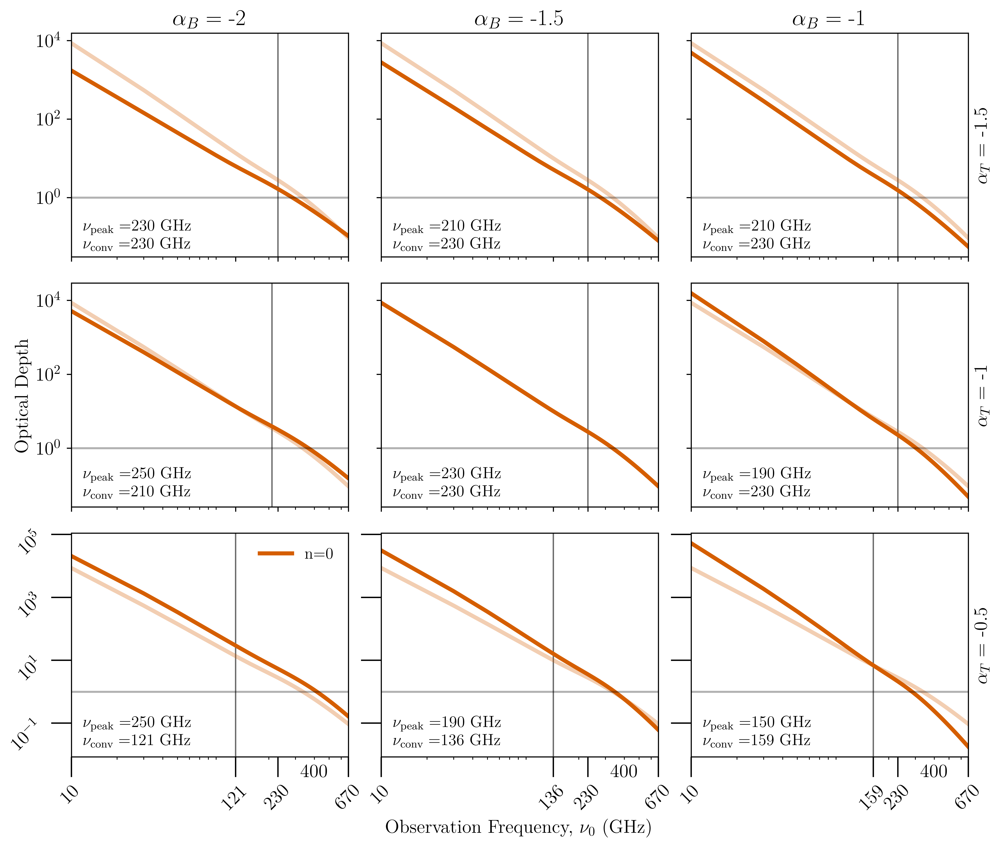

In [194]:
# fig, ax = plt.subplots(1, 1, figsize=[10,8], dpi=600,sharex="col",sharey="row")
# fig.suptitle('', fontsize=16,y=1.03)


fig, ax = plt.subplots(3, 3, figsize=[10,8], dpi=600,sharex="col",sharey="row")
ax = np.array([[None, None, None],[None, None, None],[None, None, None]])
fig.tight_layout(pad=.5)

ploty = [1,4,7]
plotx = [7,8,9]

alphaBlabel = [1,2,3]
alphaTlabel = [3,6,9]


fiducial_model=bigRun2[2,1,1]['np']['tauT']()
spin = 2

k = 1
for i in range(3):
    for j in range(3):
#         poi = {
#             "r_outer": r_outer,
#             "flux_peak_thin": flux_peak_thin,
#             "flux_peak_thick":flux_peak_thick,
#             "conv_1": conv_1,
#         }
#         conv_1 = action["start"] + action["step"] * ilp.ring_convergance(mean_radii_Thick[i,j][:, 2], mean_radii_Thick[i,j][:, 3],3)
#         conv_1 = conv_1 / astroModels.scale_label[action['var']]


#         flux_peak_thick = action["start"] + action["step"] * np.argmax(janksys_thick[i,j][:, 3])
#         flux_peak_thick = flux_peak_thick / astroModels.scale_label[action['var']]


        ax[i,j] = plt.subplot(3,3,k)
        conv = bigRun2[spin,i,j]['conv'](3)/1e9
        
        flux_peak = bigRun2[spin,i,j]['flux_peak'](3)/1e9
        optical_Depth(
            ax[i,j],
            bigRun2[spin,i,j]['np']['xvar']() / 1e9,
            bigRun2[spin,i,j]['np']['tauT'](),
            fiducial_model,
            conv,
            flux_peak
        )
        if k == 4:
            ax[i,j].set_ylabel("Optical Depth")
            
        if k == 7:
            ax[i,j].legend(frameon=False)
        
        if k == 8:
            ax[i,j].set_xlabel(R"Observation Frequency, $\nu_0$ (GHz)")
            
        if k in ploty:
            ax[i,j].tick_params('y', which="both", labelleft=True)
        
        if k in plotx:
            n = 6  # Keeps every 4th label
            [l.set_visible(False) for (i, l) in enumerate(ax[i,j].xaxis.get_minorticklabels()) if i % n != 0]
            ax[i,j].tick_params('both', 
                  length=xTickParams["length"], 
                  width=xTickParams["width"], 
                  which=xTickParams["which"], 
                  labelrotation=45)
            
        if k in alphaBlabel:
            ax[i,j].title.set_text(R'$\alpha_B=$ ' + str(bigRun2[spin,i,j]['bp']["p_mag"]))
            
        if k in alphaTlabel:
            ax[i,j].set_ylabel(R'$\alpha_T=$ ' + str(bigRun2[spin,i,j]['bp']["p_temp"]))
            ax[i,j].yaxis.set_label_position('right')
        
        
        text = R"$\nu_{\rm peak}=$" + str("{:.0f}".format(flux_peak)) + ' ' + astroModels.units_label["nu0"] +"\n" + R" $\nu_{\rm conv}=$" + str("{:.0f}".format(conv)) + ' ' + astroModels.units_label["nu0"]
        
        if i == 2:
            t = ax[i,j].text(12, .02, text , fontsize=12, color="k")
        else:
            t = ax[i,j].text(12, .05, text , fontsize=12, color="k")
        # props = dict(boxstyle='round', facecolor='white', alpha=0.5)
        k += 1
# plt.savefig(fig_home + "OpticalDepthHighSpin",dpi=600,bbox_inches='tight')


In [21]:
def optical_Depth2(
    ax,
    xaxis,
    total_optical_depth,
    fiducial_model=None,
    conv_1=None,
    flux_peak_thick=None,
    color=None,
    label=None
):

    i = 0
    num_of_observation_points = 1000
    x1=xaxis[0]
    x2=xaxis[len(xaxis)-1]
    # coords = np.linspace(x1, x2, num_of_observation_points)

    yconv=interp1d(xaxis,total_optical_depth)(conv_1)
    # yconv = total_optical_depth[np.abs(xaxis-conv_1).argmin()]
    ypeak=interp1d(xaxis,total_optical_depth)(flux_peak_thick)
    
    # ypeak = total_optical_depth[np.abs(xaxis-flux_peak_thick).argmin()]
    
    ax.plot(xaxis, 
            total_optical_depth,
            '-', 
            label=label,
            color=color, 
            
           )
    ax.plot(conv_1,yconv,'v',markerfacecolor='none',markersize=10,color=color)
    ax.plot(flux_peak_thick,ypeak,'s',markerfacecolor='none',markersize=10,color=color)


    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.axhline(
        1,
        linestyle='-',
        color='k',
        alpha=.3
    )
    ax.xaxis.set_minor_formatter(ticker.FormatStrFormatter('%.0f'))
    ax.xaxis.set_major_formatter(ticker.FormatStrFormatter("%.0f"))

    new_ticks = [xaxis[0], 230, xaxis[xaxis.size - 1]]
    ax.set_xticks(new_ticks)
    n = 3
    [l.set_visible(False) for (i, l) in enumerate(ax.xaxis.get_minorticklabels()) if i % n != 0]
    
    ax.set_xlim(xaxis[0], xaxis[xaxis.size - 1])



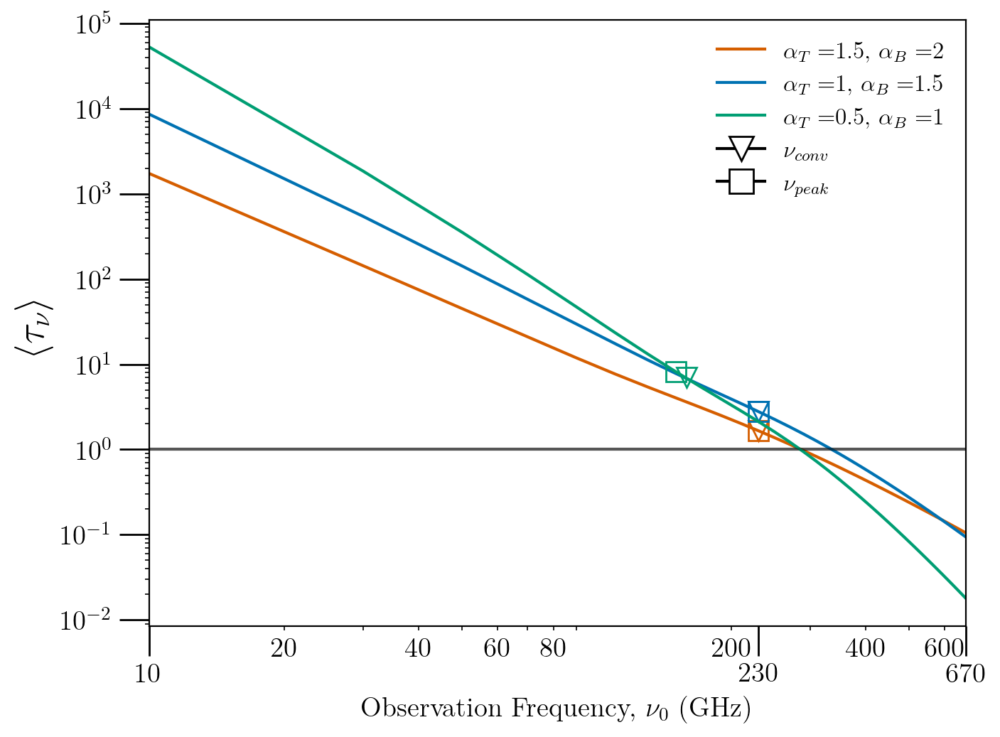

In [22]:
# fig, ax = plt.subplots(1, 1, figsize=[10,8], dpi=600,sharex="col",sharey="row")
# fig.suptitle('', fontsize=16,y=1.03)
spin = 2
temodel = 0
models = [bigRun2[spin,0,0,temodel],bigRun2[spin,1,1,temodel],bigRun2[spin,2,2,temodel]]

fig, ax = plt.subplots(1, 1, dpi=200,sharex="col",sharey="row")
fig.tight_layout(pad=.5)

# ploty = [1,4,7]
# plotx = [7,8,9]

# alphaBlabel = [1,2,3]
# alphaTlabel = [3,6,9]


# fiducial_model=bigRun2[2,1,1]['np']['tauT']()


for k in range(len(models)):
    model = models[k]
    conv = model['conv'](3)/1e9
    flux_peak = model['flux_peak'](3)/1e9
    optical_Depth2(
        ax,
        model['np']['xvar']() / 1e9,
        model['np']['tauT'](),
        conv_1=conv,
        flux_peak_thick=flux_peak,
        color = RingStyle["color"][k],
        label =  R"$\alpha_T=$" R"${}$".format(str(model['bp']["p_temp"])) + R", $\alpha_B=$" + R"${}$".format(str(model['bp']["p_mag"]))
    )

ax.set_ylabel(R"$\langle \tau_\nu \rangle$",fontsize=20)



ax.set_xlabel(R"Observation Frequency, $\nu_0$ (GHz)")
ax.tick_params('y', which="both", labelleft=True)
ax.tick_params('x', which="both", labelbottom=True)

ax.tick_params('both', 
      length=xTickParams["length"], 
      width=xTickParams["width"], 
      which=xTickParams["which"], 
      labelrotation=0)
n = 2  # Keeps every 4th label
[l.set_visible(False) for (i, l) in enumerate(ax.xaxis.get_minorticklabels()) if i % n != 0]


Legendlines = [
    Line2D([0],[0],linestyle='-', markerfacecolor=RingStyle["color"][0], color=RingStyle["color"][0], markersize=12),
    Line2D([0],[0],linestyle='-', markerfacecolor=RingStyle["color"][1], color=RingStyle["color"][1], markersize=12),
    Line2D([0],[0],linestyle='-', markerfacecolor=RingStyle["color"][2], color=RingStyle["color"][2], markersize=12),
    Line2D([0],[0],marker='v',markerfacecolor='w', color='k', markersize=12),
    Line2D([0],[0],marker='s',markerfacecolor='w', color='k', markersize=12),
]

Legendlabels = [
    R"$\alpha_T=$" R"${}$".format(str(np.abs(models[0]['bp']["p_temp"]))) + R", $\alpha_B=$" + R"${}$".format(str(np.abs(models[0]['bp']["p_mag"]))),
    R"$\alpha_T=$" R"${}$".format(str(np.abs(models[1]['bp']["p_temp"]))) + R", $\alpha_B=$" + R"${}$".format(str(np.abs(models[1]['bp']["p_mag"]))),
    R"$\alpha_T=$" R"${}$".format(str(np.abs(models[2]['bp']["p_temp"]))) + R", $\alpha_B=$" + R"${}$".format(str(np.abs(models[2]['bp']["p_mag"]))),
    R"$\nu_{conv}$",
    R"$\nu_{peak}$"
          ]

ax.legend(Legendlines,Legendlabels,frameon=False)


# Legendlines = [
#     Line2D([0],[0],linestyle='-', markerfacecolor='k', color='w', markersize=12),

#     ]
# Legendlabels = [
#     R"$\alpha_T=$" + R"${}$".format(str(bigRun2[fiducialModel]['bp']["p_temp"])) + R", $\alpha_B=$" + R"${}$".format(str(bigRun2[fiducialModel]['bp']["p_mag"])),
#           ]


#         if k in alphaBlabel:
#             ax[i,j].title.set_text(R'$\alpha_B=$ ' + str(bigRun2[spin,i,j]['bp']["p_mag"]))
            
#         if k in alphaTlabel:
#             ax[i,j].set_ylabel(R'$\alpha_T=$ ' + str(bigRun2[spin,i,j]['bp']["p_temp"]))
#             ax[i,j].yaxis.set_label_position('right')
        
        
#         text = R"$\nu_{\rm peak}=$" + str("{:.0f}".format(flux_peak)) + ' ' + astroModels.units_label["nu0"] +"\n" + R" $\nu_{\rm conv}=$" + str("{:.0f}".format(conv)) + ' ' + astroModels.units_label["nu0"]
        
        # if i == 2:
        #     t = ax[i,j].text(12, .02, text , fontsize=12, color="k")
        # else:
        #     t = ax[i,j].text(12, .05, text , fontsize=12, color="k")
        # props = dict(boxstyle='round', facecolor='white', alpha=0.5)
        # k += 1# plt.savefig(fig_home + "OpticalDepthHighSpin",dpi=600,bbox_inches='tight')
        
ax.set_rasterization_zorder(0) 
plt.savefig(fig_home + "OpticalDepthHighSpin.png",dpi=200,bbox_inches='tight')

# Full Image

In [23]:
def fullImage(ax,Absorbtion_Image,limit,vmax0=None,cb_ax=None,cb_name = None):
    
    if vmax0 is None:
        vmax0 = np.nanmax(Absorbtion_Image) * 1.2
        
    im = ax.imshow(Absorbtion_Image, vmax=vmax0, origin="lower", cmap="afmhot", extent=[-limit, limit, -limit, limit])


    ax.set_xlim(-10, 10)  # units of M
    ax.set_ylim(-10, 10)
    if cb_ax is not None:
        colorbar0 = fig.colorbar(im, fraction=0.046, pad=0.04, format='%.0f',
             ax=cb_ax)
        if cb_name is not None:
            colorbar0.set_label(cb_name)

             
    



    




In [24]:
def fullImage2(ax,Absorbtion_Image,limit,vmax):
        
    im = ax.imshow(Absorbtion_Image, vmax=vmax, origin="lower", cmap="afmhot", extent=[-limit, limit, -limit, limit])


    ax.set_xlim(-10, 10)  # units of M
    ax.set_ylim(-10, 10)
    return im
    

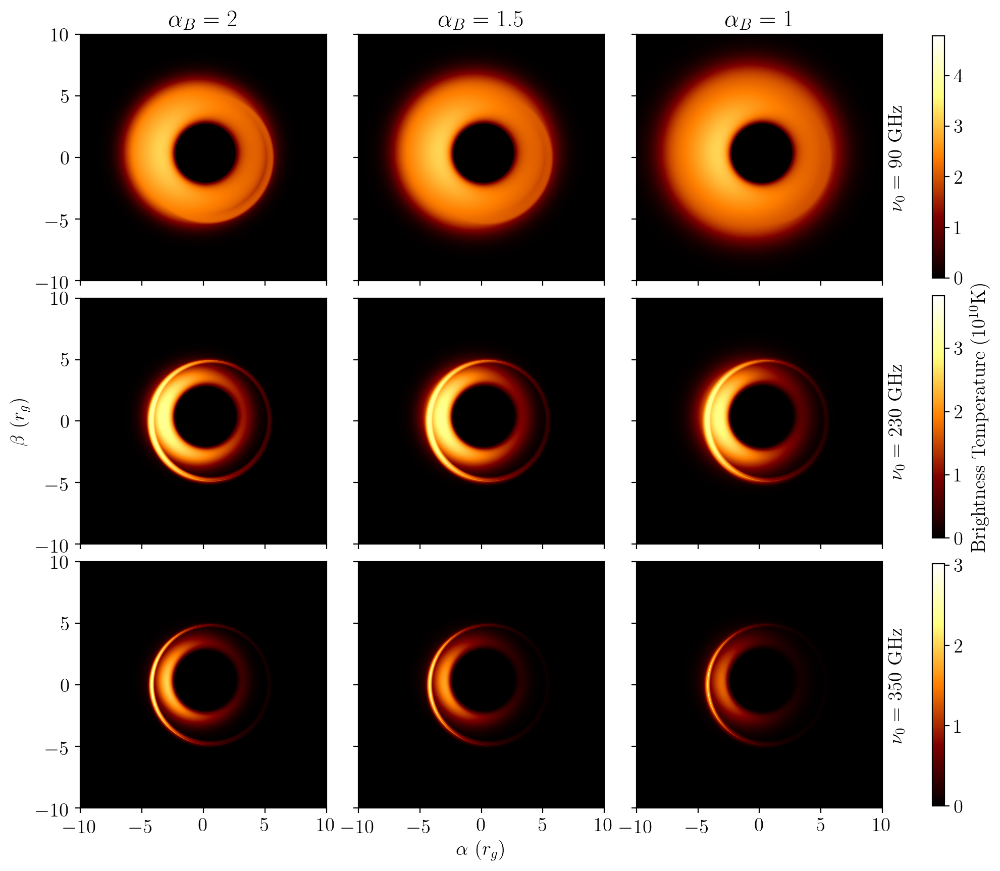

In [25]:
fig, ax = plt.subplots(3, 3, figsize=[10,8], dpi=200,sharex="col",sharey="row")
ax = np.array([[None, None, None],[None, None, None],[None, None, None]])
# thin_image = model_list[i,j]
fig.tight_layout(pad=0)
frequency = [90e9,230e9,350e9]

height =  0.3
xspace = .49
cbax = [plt.axes((xspace, 0.69, 0.495, height)), plt.axes((xspace, 0.368, 0.495, height)),plt.axes((xspace, 0.036, 0.495, height))]

alphaBlabel = [1,2,3]
freq_label = [3,6,9]

temodel = 0
k = 1
for i in range(3):
    current_freq = frequency[i]
    cb_ax = cbax[i]
    cb_ax.axis('off')
    for j in range(3):
        
        currentModel = bigRun2[2,1,j,temodel]
        filename = currentModel['image'](current_freq)
        
        h5f = h5py.File(filename, 'r')
        Absorbtion_Image = h5f['bghts_full_absorbtion'][:] / 1e10
        h5f.close()
        
        if j == 0:
            if i ==0:
                vmax = np.nanmax(Absorbtion_Image) * 1.5
            elif i == 1:
                vmax = np.nanmax(Absorbtion_Image) * 1.2
            else:
                vmax = np.nanmax(Absorbtion_Image) 
        
        
        ax[i,j] = plt.subplot(3,3,k)
        im1 = fullImage2(
            ax[i,j],
            Absorbtion_Image,
            lim0,
            vmax)

        
        if k == 4:
            ax[i,j].set_ylabel(r"$\beta$" + " " + r"($r_g$)")

        if k == 8:
            ax[i,j].set_xlabel(r"$\alpha$" + " " + r"($r_g$)")
            
                    
        if k in alphaBlabel:
            ax[i,j].title.set_text(R'$\alpha_B=$ ' + str(np.abs(currentModel['bp']["p_mag"])))
            
        if k in freq_label:
            ax[i,j].set_ylabel(R'$\nu_0=$ ' + "{:.0f}".format(current_freq / astroModels.scale_label[action["var"]]) + ' ' + astroModels.units_label[action["var"]])
            ax[i,j].yaxis.set_label_position('right')
        ax[i,j].set_rasterization_zorder(0) 

        k += 1
    
    colorbar0 = fig.colorbar(im1, fraction=0.046, pad=0.04, format='%.0f',
                         ax=cb_ax)
    if i == 1:
        colorbar0.set_label(R"Brightness Temperature ($10^{10}$K)")

plt.subplots_adjust(wspace=-.3)
# plt.savefig(fig_home + "FullThickImages",dpi=600,bbox_inches='tight')
# fig.suptitle(R"$T_{e,0} = $" + "{:.1e}".format(currentModel['bp']['t_e0']),y=1.06)
        
# plt.savefig(fig_home + "FullThickImages.png",dpi=200,bbox_inches='tight')
                             

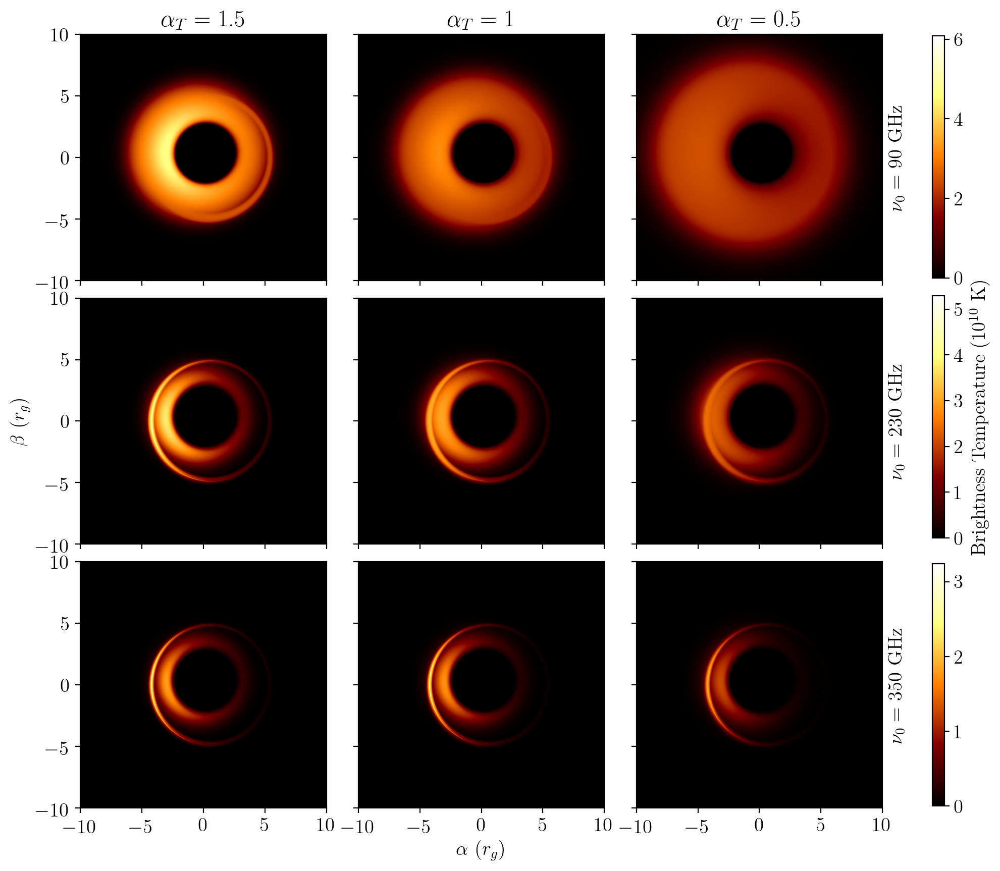

In [26]:
fig, ax = plt.subplots(3, 3, figsize=[10,8], dpi=200,sharex="col",sharey="row")
ax = np.array([[None, None, None],[None, None, None],[None, None, None]])
# thin_image = model_list[i,j]
fig.tight_layout(pad=0)
frequency = [90e9,230e9,350e9]

alphaBlabel = [1,2,3]
freq_label = [3,6,9]
cbax = [plt.axes((xspace, 0.69, 0.495, height)), plt.axes((xspace, 0.368, 0.495, height)),plt.axes((xspace, 0.036, 0.495, height))]

temodel = 0
spin = 2

k = 1
for i in range(3):
    current_freq = frequency[i]
    cb_ax = cbax[i]
    cb_ax.axis('off')
    for j in range(3):
        currentModel = bigRun2[spin,j,1,temodel]
        filename = currentModel['image'](current_freq)
        
        h5f = h5py.File(filename, 'r')
        Absorbtion_Image = h5f['bghts_full_absorbtion'][:] / 1e10
        h5f.close()
        
        if j == 0:
            if i ==0:
                vmax = np.nanmax(Absorbtion_Image) * 1.3
            elif i == 1:
                vmax = np.nanmax(Absorbtion_Image) * 1.2
            else:
                vmax = np.nanmax(Absorbtion_Image) 
        
        ax[i,j] = plt.subplot(3,3,k)
        im1 = fullImage2(
            ax[i,j],
            Absorbtion_Image,
            lim0,
            vmax)
        

        
        if k == 4:
            ax[i,j].set_ylabel(r"$\beta$" + " " + r"($r_g$)")

        if k == 8:
            ax[i,j].set_xlabel(r"$\alpha$" + " " + r"($r_g$)")
            
                    
        if k in alphaBlabel:
            ax[i,j].title.set_text(R'$\alpha_T=$ ' + str(np.abs(currentModel['bp']["p_temp"])))
            
        if k in freq_label:
            ax[i,j].set_ylabel(R'$\nu_0=$ ' + "{:.0f}".format(current_freq / astroModels.scale_label[action["var"]]) + ' ' + astroModels.units_label[action["var"]])
            ax[i,j].yaxis.set_label_position('right')
        ax[i,j].set_rasterization_zorder(0) 
        
        k += 1
    
        
            
    colorbar0 = fig.colorbar(im1, fraction=0.046, pad=0.04, format='%.0f',
                         ax=cb_ax)
    if i == 1:
        colorbar0.set_label(R"Brightness Temperature ($10^{10}$ K)")


plt.subplots_adjust(wspace=-.3)        
        
    # ax.title.set_text('Optically Thin Assumption')
    # ax.text(-9, 8.5, astroModels.var_label[action["var"]]
    #      + str(round(frequency / astroModels.scale_label[action["var"]], 2))
    #      + ' ' + astroModels.units_label[action["var"]], fontsize=12, color="w")

# plt.savefig(fig_home + "FullTempThickImages",dpi=600,bbox_inches='tight')
# fig.suptitle(R"$T_{e,0} = $" + "{:.1e}".format(currentModel['bp']['t_e0']),y=1.06)
        
plt.savefig(fig_home + "FullTempThickImages.png",dpi=200,bbox_inches='tight')

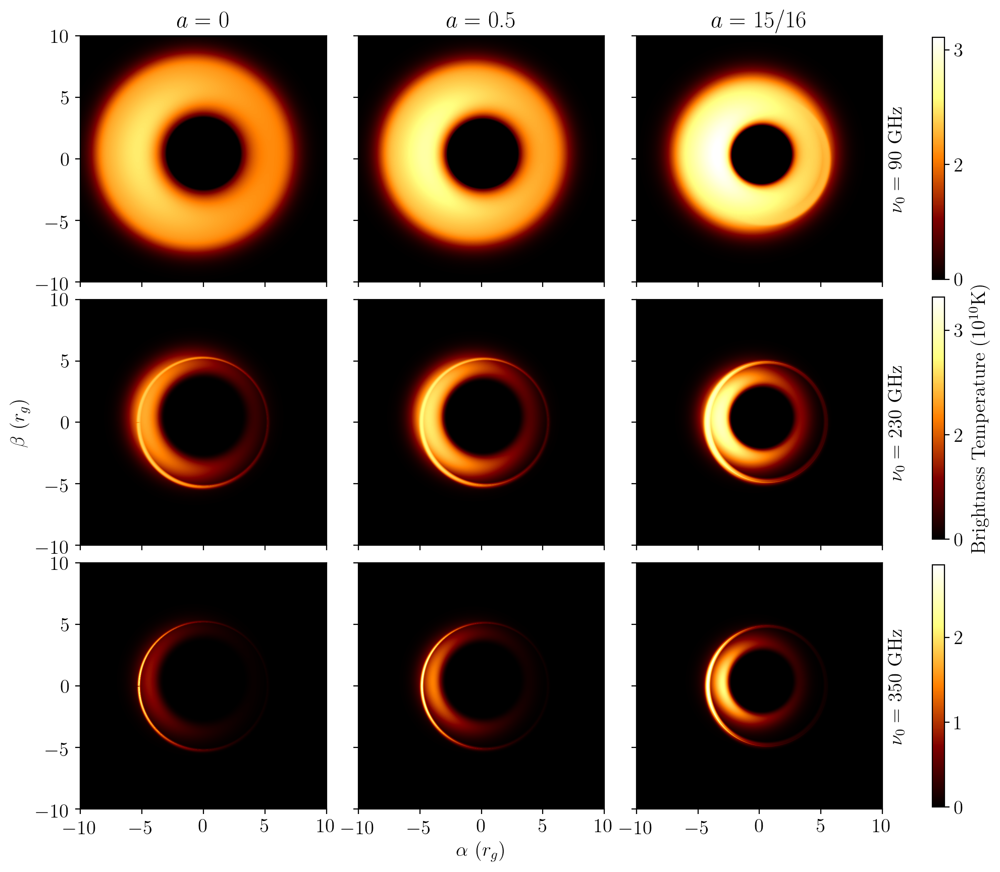

In [27]:
fig, ax = plt.subplots(3, 3, figsize=[10,8], dpi=200,sharex="col",sharey="row")
ax = np.array([[None, None, None],[None, None, None],[None, None, None]])
# thin_image = model_list[i,j]
fig.tight_layout(pad=0)
frequency = [90e9,230e9,350e9]
spins = ["0","0.5","15/16"]
alphaBlabel = [1,2,3]
freq_label = [3,6,9]
xspace = .49
cbax = [plt.axes((xspace, 0.69, 0.495, height)), plt.axes((xspace, 0.368, 0.495, height)),plt.axes((xspace, 0.036, 0.495, height))]
temodel = 0

k = 1
for i in range(3):
    current_freq = frequency[i]
    cb_ax = cbax[i]
    cb_ax.axis('off')
    for j in range(3):
        filename = bigRun2[j,1,1,temodel]['image'](current_freq)
        
        h5f = h5py.File(filename, 'r')
        Absorbtion_Image = h5f['bghts_full_absorbtion'][:] /1e10
        h5f.close()
        
        
        ax[i,j] = plt.subplot(3,3,k)
        
        if j == 0:
            if i ==0:
                vmax = np.nanmax(Absorbtion_Image) * 1.4
            elif i == 1:
                vmax = np.nanmax(Absorbtion_Image) * 1.5
            else:
                vmax = np.nanmax(Absorbtion_Image) *1.1
        
        ax[i,j] = plt.subplot(3,3,k)
        im1 = fullImage2(
            ax[i,j],
            Absorbtion_Image,
            lim0,
            vmax)

        
        if k == 4:
            ax[i,j].set_ylabel(r"$\beta$" + " " + r"($r_g$)")

        if k == 8:
            ax[i,j].set_xlabel(r"$\alpha$" + " " + r"($r_g$)")
            
                    
        if k in alphaBlabel:
            ax[i,j].title.set_text(R'$a=$ ' + spins[j])
            
        if k in freq_label:
            ax[i,j].set_ylabel(R'$\nu_0=$ ' + "{:.0f}".format(current_freq / astroModels.scale_label[action["var"]]) + ' ' + astroModels.units_label[action["var"]])
            ax[i,j].yaxis.set_label_position('right')
        ax[i,j].set_rasterization_zorder(0)
        k += 1
    
    colorbar0 = fig.colorbar(im1, fraction=0.046, pad=0.04, format='%.0f',
                         ax=cb_ax)
    
    tick_locator = ticker.MaxNLocator(nbins=3)
    colorbar0.locator = tick_locator
    colorbar0.update_ticks()
    if i == 1:
        colorbar0.set_label(R"Brightness Temperature ($10^{10}$K)")      

plt.subplots_adjust(wspace=-.3) 

plt.savefig(fig_home + "SpinFullThickImages.png",dpi=200,bbox_inches='tight')

# Radii Calc

In [28]:
def jy(I, nu, mass):
    """Calculate totalt jasnky flux of a photon ring

    Args:
        I (ndarray): Ndarray of Brightness temperature values
        nu (Float): Observation frequency
        mass (Float): Black hole mass

    Returns:
        _type_: _description_
    """
    I = I * u.K
    nu = nu * u.Hz
    mass = mass * u.g
    one_M = ilp.rg_func(mass).to(u.m)
    M2rads = np.arctan(one_M.value / dBH)
    rads2pxls = (M2rads * 2 * limits) / I.shape[0]  # total amount M length units rads / total pixels
    return (I * nu ** 2 * (2 * ilp.kB / ilp.c ** 2)).to(u.Jy)* rads2pxls ** 2  # was this orifianlly in per radians?


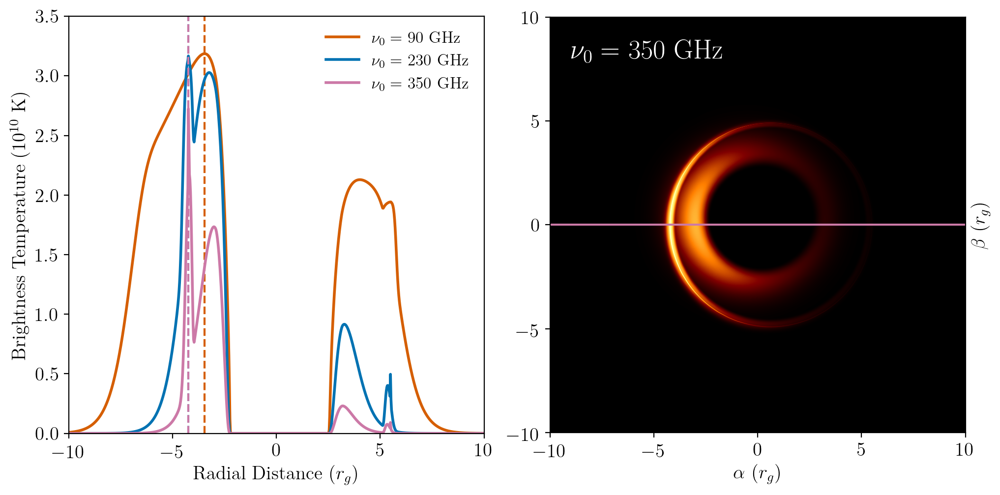

In [34]:
current_freq = 490e9
fig, (ax,ax1) = plt.subplots(1, 2, figsize=[10,5], dpi=200)
fig.tight_layout(h_pad=.8)
limit=lim0


# images = Absorbtion_Image
# rsize = image_tools.num_of_radial_points
# rmax = images.shape[0] * .4



# # axes_0[J].get_xaxis().set_ticks([])
# # axes_1[J].get_xaxis().set_ticks([])
# peakAbsorb, interpAbsorb = image_tools.radii_of_thetaV2_data(images)
# peaks = peakAbsorb
# interps = interpAbsorb
# x = np.linspace(0, rmax - 1, rsize) * params.dx0
temodel = 0
spin = 2
frequencies = [90e9,230e9,350e9]
x = np.linspace(-lim0, lim0, 2000)

for i in range(3):
    
    currentModel = bigRun2[spin,1,1,temodel]
    filename = currentModel['image'](frequencies[i])

    h5f = h5py.File(filename, 'r')
    Absorbtion_Image = h5f['bghts_full_absorbtion'][:] /1e10
    h5f.close()

    # colors = [RingStyle["color"][0], RingStyle["color"][1], RingStyle['color'][2]]
    # parg = []
    if i == 2:
        color = RingStyle["color"][i+1]
    else:  
        color = RingStyle["color"][i]
    ax.plot(x, Absorbtion_Image[1000-1,:], linewidth=2, color=color,label=R'$\nu_0=$ ' + "{:.0f}".format(frequencies[i] / astroModels.scale_label[action["var"]]) + ' ' + astroModels.units_label[action["var"]])
        # ax.axvline(peaks[parg[L]], color=colors[L],
        #            linewidth=1)
    ax.axvline(x[Absorbtion_Image[1000-1,:].argmax()],linestyle='--',color=color)
    # ax.set_xlim([2, 6])
ax.legend(frameon=False)
ax.set_xlabel(R"Radial Distance ($r_g$)")
ax.set_xlim(-10, 10)
ax.set_ylim(0, 3.5)
ax.set_rasterization_zorder(0) 

# ax.set_ylabel(R"Flux" + R"($r_g, \varphi$)" +  R"$(\rm J_y)$")
ax.set_ylabel(R"Brightness Temperature ($10^{10}$ K)")

im1 = ax1.imshow(Absorbtion_Image, origin="lower", cmap="afmhot", extent=[-limit, limit, -limit, limit])

ax1.set_xlim(-10, 10)  # units of M
ax1.set_ylim(-10, 10)

ax1.set_yticks(ax1.get_xticks())


ax1.set_xlabel(r"$\alpha$" + " " + r"($r_g$)")
ax1.set_ylabel(r"$\beta$" + " " + r"($r_g$)")
ax1.yaxis.set_label_position("right")
ax1.text(-9, 8, R"$\nu_0=$ {} GHz".format("{:.0f}".format(frequencies[i]/1e9)) , fontsize=20, color="white")
ax1.set_rasterization_zorder(0) 
# Plot lines
rline1 = np.array([-10, 10])
theta1 = np.array([0, 0])

alpha1 = rline1 * np.cos(theta1)
beta1 = rline1 * np.sin(theta1)
ax1.plot(alpha1, beta1, color=RingStyle["color"][i+1])
# for L in range(len(ptheta)):
#     rline = np.array([0, 10])
#     theta = np.array([ptheta[L], ptheta[L]])

#     alpha = rline * np.cos(theta)
#     beta = rline * np.sin(theta)

#     ax1.plot(alpha, beta, color=colors[L])
    

# colorbar0 = fig.colorbar(im1, fraction=0.046, pad=0.04, format='%.1e', ticks=[
#     vmax * .8,
#     vmax * .6,
#     vmax * .4,
#     vmax * .2,
#     vmax * .05
# ],
#                          label="Brightness Temperature (K)",
#                          ax=ax1
#                          )

plt.savefig(fig_home + "FluxVRadSingle.png",dpi=200,bbox_inches='tight')

# RADII CONV

# Analytical 

In [149]:
model = "ModelC_22"
modelA = "ModelA_22"

In [152]:
rarray = bigRun2[model]['rprofs']()['r']
eta = rarray ** 2
theta_earray = bigRun2[model]['rprofs']()['theta_e']
g = alejoGFactor(rarray,rsigns,eta,spin_case)

In [174]:

filename = bigRun2[model]['image'](10e9)

h5f = h5py.File(filename, 'r')
Absorbtion_Image = h5f['bghts_full_absorbtion'][:]
h5f.close()

In [175]:
dims = Absorbtion_Image.shape[0]
imrvalues = Absorbtion_Image[int(dims/2)-1:dims-1,int(dims/2)-1]
imrarray = np.linspace(0,limits,len(imrvalues))

In [176]:
print("Spin: ",spin_case)
print("gfactered theta_e radius: ",getxOfFuncPeak(rarray,g*theta_earray))
print("AART produced image radius: ",getxOfFuncPeak(imrarray,imrvalues))

Spin:  0.9375
gfactered theta_e radius:  2.7387387387387387
AART produced image radius:  4.129129129129129


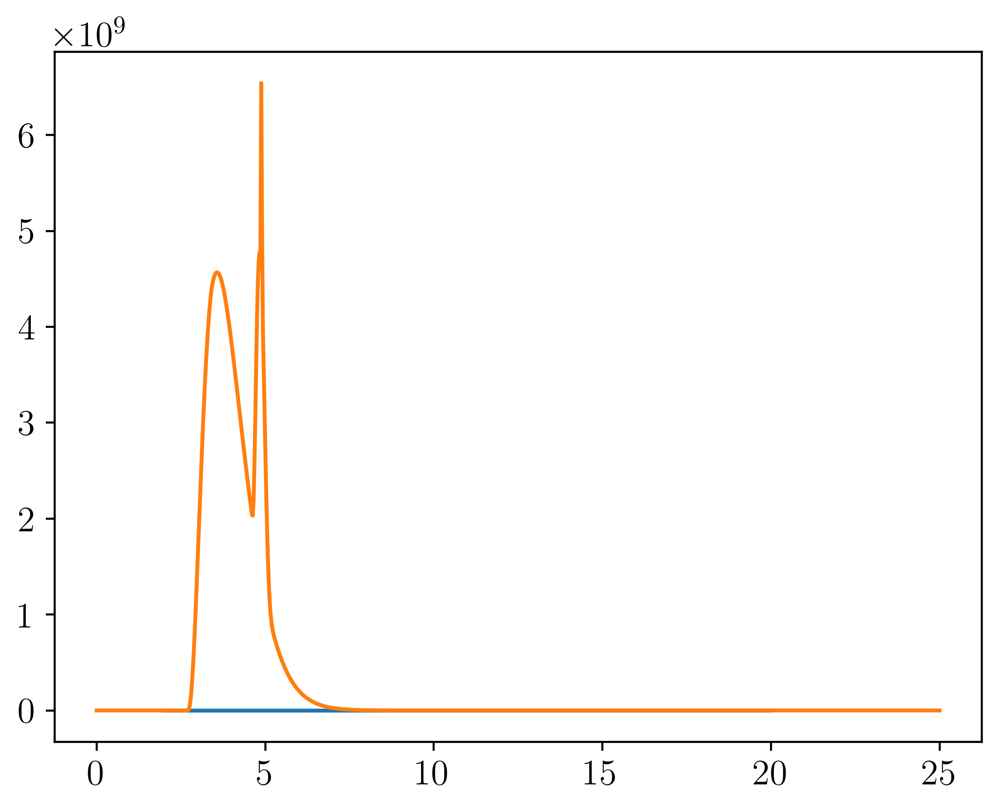

In [138]:
fig,ax = plt.subplots(1,1,dpi=400)
ax.plot(rarray,g*theta_earray)
ax.plot(imrarray,imrvalues)
# plt.xscale('log')
# plt.yscale('log')

In [151]:
def alejoGFactor(rs,redshift_sign,eta,spin):
    isco=rms(a)
    g = np.zeros(rs.shape)
    g[rs<isco] = obsint.gGas(rs[rs<isco],spin,redshift_sign[rs<isco],0,eta[rs<isco])
    # eta = eta[rs>=isco]

    g[rs>=isco] = obsint.gDisk(rs[rs>=isco],spin,redshift_sign[rs>=isco],0,eta[rs>=isco])
    return g

In [96]:
def getxOfFuncPeak(xvar,yvar):
    num_of_observation_points = 1000

    coords = np.linspace(xvar.min(),xvar.max(),num_of_observation_points)
    points = num_of_observation_points - 1
    step = (xvar.max() - xvar.min())/points

    yvar_interp = interp1d(xvar,yvar)(coords)
    return (xvar.min() + step * np.argmax(yvar_interp))

# VisAmp

In [35]:
bigRun2[spin,0,2,temodel]

{'model': 'ModelC_131',
 'lband': '/scratch/gpfs/td6241/aart/bigRuns/OctRun/Data/geo/ModelCLensing.h5',
 'rband': '/scratch/gpfs/td6241/aart/bigRuns/OctRun/Data/geo/ModelCRayTracing.h5',
 'loadGeo': functools.partial(<function loadGeoModel at 0x14ee7295fe20>, 'ModelC', 'OctRun'),
 'cintent_data': functools.partial(<bound method BigRuns.getIntentPath of <classRunComputing.BigRuns object at 0x14ee7078ed50>>, 'ModelC_131'),
 'pintent_data': '/scratch/gpfs/td6241/aart/bigRuns/OctRun/Data/intensity/ModelC_131',
 'bp': {'p_dens': -0.7,
  'n_th0': 57424.575568468914,
  'b_0': 8,
  'theta_b': 0.8726646259971648,
  'mass': 1.3249659172847406e+43,
  'nu0': 670000000000.0,
  'scale_height': 0.5,
  'rb_0': 5,
  'beta': 1.0,
  'r_ie': 10.0,
  'nscale': 0.4,
  'p_temp': -1.5,
  'p_mag': -1,
  't_e0': 30000000000.0},
 'hname': 'a>0.9375--p_temp>-1.50--p_mag>-1.00--t_e0>3.00e+10',
 'hname_list': [('a', '0.9375'),
  ('p_temp', '-1.50'),
  ('p_mag', '-1.00'),
  ('t_e0', '3.00e+10')],
 'hname_plot': '$$a

In [36]:
spin = 2
atmodel = 1
abmodel = 1
temodel = 0
VisAmp_Model1 = bigRun2[spin,atmodel,abmodel,0]
VisAmp_Model2 = bigRun2[spin,atmodel,abmodel,2]
freq=230e9

In [37]:
current_geo_model = fileloading.totalModelNametoGridModel(VisAmp_Model1['model'],bigRun2.run_type)
bfileloading.loadGeoModel(current_geo_model, run2.getRunName())()
importlib.reload(params)


Loading ModelC

file /scratch/gpfs/td6241/aart/bigRuns/OctRun/geoModels/ModelC.py Loaded as /home/td6241/repo/aart/params.py
Remember to call 'importlib.reload(params)' to reload parameters


<module 'params' from '/home/td6241/repo/aart/params.py'>

In [38]:

h5f = h5py.File(VisAmp_Model1['lband'],'r')

supergrid0=h5f['grid0'][:]
N0=int(h5f["N0"][0])
supergrid1=h5f['grid1'][:]
N1=int(h5f["N1"][0])
supergrid2=h5f['grid2'][:]
N2=int(h5f["N2"][0])
h5f.close()

h5f = h5py.File(VisAmp_Model1['cintent_data'](freq),'r')

bghts0_1=h5f['bghts0_absorbtion'][:]
bghts1_1=h5f['bghts1_absorbtion'][:]
bghts2_1=h5f['bghts2_absorbtion'][:]
Absorbtion_Image_1 = h5f['bghts_full_absorbtion'][:]

h5f.close()

vamp.radon_cut(radonangles,bghts0_1,bghts1_1,bghts2_1,supergrid0,supergrid1,supergrid2)

for i in range(len(radonangles)):
    OGFile = EZPaths.aartOutput + "Visamp_%s_a_%s_i_%s_0.h5"%(radonangles[i],spin_case,i_case)
    newFile = EZPaths.aartOutput + "Visamp1_" + str(radonangles[i]) + ".h5"
    cmd = "mv " + OGFile + " " + newFile
    subprocess.run([cmd], shell=True)
    print("File moved to  ", newFile)
    
#_______________________________________________

    
h5f = h5py.File(VisAmp_Model2['lband'],'r')

supergrid0=h5f['grid0'][:]
N0=int(h5f["N0"][0])
supergrid1=h5f['grid1'][:]
N1=int(h5f["N1"][0])
supergrid2=h5f['grid2'][:]
N2=int(h5f["N2"][0])
h5f.close()

h5f = h5py.File(VisAmp_Model2['cintent_data'](freq),'r')

bghts0_2=h5f['bghts0_absorbtion'][:]
bghts1_2=h5f['bghts1_absorbtion'][:]
bghts2_2=h5f['bghts2_absorbtion'][:]
Absorbtion_Image_2 = h5f['bghts_full_absorbtion'][:]

h5f.close()

vamp.radon_cut(radonangles,bghts0_2,bghts1_2,bghts2_2,supergrid0,supergrid1,supergrid2)

for i in range(len(radonangles)):
    OGFile = EZPaths.aartOutput + "Visamp_%s_a_%s_i_%s_0.h5"%(radonangles[i],spin_case,i_case)
    newFile = EZPaths.aartOutput + "Visamp2_" + str(radonangles[i]) + ".h5"
    cmd = "mv " + OGFile + " " + newFile
    subprocess.run([cmd], shell=True)
    print("File moved to  ", newFile)

Absorbtion_Image_1 = Absorbtion_Image_1/1e10
Absorbtion_Image_2 = Absorbtion_Image_2/1e10

0.9375
File  /scratch/gpfs/td6241/aart/rawResults/Visamp_0_a_0.9375_i_17_0.h5  created.
0.9375
File  /scratch/gpfs/td6241/aart/rawResults/Visamp_90_a_0.9375_i_17_0.h5  created.
File moved to   /scratch/gpfs/td6241/aart/rawResults/Visamp1_0.h5
File moved to   /scratch/gpfs/td6241/aart/rawResults/Visamp1_90.h5
0.9375
File  /scratch/gpfs/td6241/aart/rawResults/Visamp_0_a_0.9375_i_17_0.h5  created.
0.9375
File  /scratch/gpfs/td6241/aart/rawResults/Visamp_90_a_0.9375_i_17_0.h5  created.
File moved to   /scratch/gpfs/td6241/aart/rawResults/Visamp2_0.h5
File moved to   /scratch/gpfs/td6241/aart/rawResults/Visamp2_90.h5


In [39]:
freqss1 = []
visamps1 = []
for i in range(len(radonangles)):
    fnrays= EZPaths.aartOutput + "Visamp1_" + str(radonangles[i]) + ".h5"

    print("Reading file: ",fnrays)

    h5f = h5py.File(fnrays,'r')

    freqs=h5f['freqs'][:]
    visamp=h5f['visamp'][:]

    h5f.close()
    freqss1.append(freqs)
    visamps1.append(visamp)
freqss1=np.array(freqss1)
visamps1=np.array(visamps1)

#_______________________________________

freqss2 = []
visamps2 = []
for i in range(len(radonangles)):
    fnrays= EZPaths.aartOutput + "Visamp2_" + str(radonangles[i]) + ".h5"

    print("Reading file: ",fnrays)

    h5f = h5py.File(fnrays,'r')

    freqs=h5f['freqs'][:]
    visamp=h5f['visamp'][:]

    h5f.close()
    freqss2.append(freqs)
    visamps2.append(visamp)
freqss2=np.array(freqss2)
visamps2=np.array(visamps2)

Reading file:  /scratch/gpfs/td6241/aart/rawResults/Visamp1_0.h5
Reading file:  /scratch/gpfs/td6241/aart/rawResults/Visamp1_90.h5
Reading file:  /scratch/gpfs/td6241/aart/rawResults/Visamp2_0.h5
Reading file:  /scratch/gpfs/td6241/aart/rawResults/Visamp2_90.h5


In [40]:
from math import log10, floor
def find_exp(number) -> int:
    base10 = log10(abs(number))
    return str(abs(floor(base10)))

def find_base(number,end=3):
    return "{:.3e}".format(number)[0:end]

In [41]:
def sciNotation(number,end=1):
    return R"$" + find_base(number,end) + R" \cdot 10^{" + find_exp(number) + "}$"

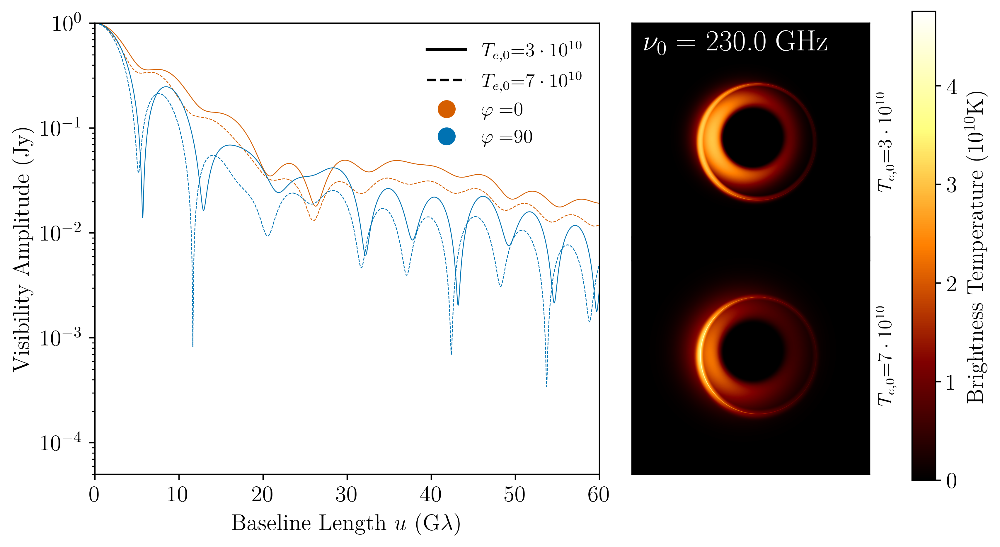

In [42]:

lineStyle = ["-","--"]
colors = [RingStyle['color'][0],RingStyle['color'][1]]

fig, ax = plt.subplots(2,2,figsize=[10,5],dpi=400)
ax[0,0].axis("off")
ax[1,0].axis("off")

cb_ax = plt.axes((0.35, 0.1, 0.495, 0.8))
cb_ax.axis("off")
ax[0,0] = plt.subplot(1,2,1)
for i in range(len(radonangles)):
    ax[0,0].plot(freqss1[0],visamps1[i],colors[i],linewidth=0.5,label=r"$\varphi=$"+"%s"%radonangles[i],linestyle=lineStyle[0])
    ax[0,0].plot(freqss2[0],visamps2[i],colors[i],linewidth=0.5,label=r"$\varphi=$"+"%s"%radonangles[i],linestyle=lineStyle[1])
    ax[0,0].set_yscale("log")
    ax[0,0].set_ylabel("Visibility Amplitude (Jy)",size=14)
    ax[0,0].set_xlabel("Baseline Length $u$ (G$\\lambda$)",size=14)
    # ax[0,0].legend(loc="best",frameon=False)
    ax[0,0].set_xlim(0.,60.)
    ax[0,0].set_ylim(5e-5,1)
ax[0,0].set_rasterization_zorder(0) 
# ax[0,1].axis("off")
vmax = np.nanmax(Absorbtion_Image_1) * 1.5
fullImage(
    ax[0,1],
    Absorbtion_Image_1,
    lim0,
    vmax)
ax[0,1].tick_params('y', which="both", labelleft=False)
ax[0,1].set_ylabel(R"$T_{e,0}$=" + sciNotation(VisAmp_Model1['bp']["t_e0"]),fontsize=12)
ax[0,1].tick_params(
    axis='x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    labelbottom=False)
ax[0,1].tick_params(
    axis='y',          # changes apply to the x-axis
    which='both',
    left=False,# both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    labelbottom=False)
ax[0,1].yaxis.set_label_position("right")
ax[0,1].set_rasterization_zorder(0) 
# for i in range(len(radonangles)):
#     ax[1,0].plot(freqss2[0],visamps2[i],linewidth=0.5,label=r"$\varphi=$"+"%s"%radonangles[i])
    
#     ax[1,0].set_yscale("log")
#     ax[1,0].set_ylabel("Visibility Amplitude (Jy)",size=14)
#     ax[1,0].set_xlabel("Baseline Length $u$ (G$\\lambda$)",size=14)
#     ax[1,0].legend(loc="best",frameon=False)
#     ax[1,0].set_xlim(0.,60.)
#     ax[1,0].set_ylim(1e-6,1)

# ax[1,1].axis("off")
fullImage(
    ax[1,1],
    Absorbtion_Image_2,
    lim0,
    vmax,
    cb_ax,
    R"Brightness Temperature ($10^{10}$K)")
ax[1,1].tick_params('y', which="both", labelleft=False)
ax[1,1].set_ylabel(R"$T_{e,0}$=" + sciNotation(VisAmp_Model2['bp']["t_e0"]),fontsize=12)
ax[1,1].tick_params(
    axis='x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    labelbottom=False)
ax[1,1].tick_params(
    axis='y',          # changes apply to the x-axis
    which='both',
    left=False,# both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    labelbottom=False)
ax[1,1].yaxis.set_label_position("right")
ax[1,1].set_rasterization_zorder(0) 
# plt.title(bigRun["ModelC33"]['hname_plot'],fontsize=13)
# plt.savefig('Visamp.png',dpi=400,bbox_inches='tight')
# plt.show()

Legendlines = [
    Line2D([0],[0],linestyle='-', markerfacecolor='black', color='k', markersize=12),
    Line2D([0],[0],linestyle='--', markerfacecolor='black', color='k', markersize=12),
    Line2D([0],[0],marker='o', markerfacecolor=colors[0], color='w', markersize=12),
    Line2D([0],[0],marker='o', markerfacecolor=colors[1], color='w', markersize=12),
    # Line2D([0],[0],marker='o', markerfacecolor=RingStyle["color"][2], color='w', markersize=12),

    ]
# Legendlabels = [
#     R"$\alpha_T={}, \alpha_B={}$".format(np.abs(VisAmp_Model1['bp']["p_temp"]),np.abs(VisAmp_Model1['bp']["p_mag"])),
#     R"$\alpha_T={}, \alpha_B={}$".format(np.abs(VisAmp_Model2['bp']["p_temp"]),np.abs(VisAmp_Model2['bp']["p_mag"])),
#     r"$\varphi=$"+"%s"%radonangles[0],
#     r"$\varphi=$"+"%s"%radonangles[1],
#     # R"$n=2$",

#           ]
Legendlabels = [
    R"$T_{e,0}$=" + sciNotation(VisAmp_Model1['bp']["t_e0"]),
    R"$T_{e,0}$=" + sciNotation(VisAmp_Model2['bp']["t_e0"]),
    r"$\varphi=$"+"%s"%radonangles[0],
    r"$\varphi=$"+"%s"%radonangles[1],
    # R"$n=2$",

          ]

plt.subplots_adjust(wspace=-.1, hspace=-.1)

ax[0,1].text(-9, 7.7, R"$\nu_0=$ {} GHz".format(freq / 1e9) , fontsize=18, color="white")
ax[0,0].legend(Legendlines,Legendlabels,frameon=False)
plt.subplots_adjust(wspace=-.2)
plt.savefig(fig_home + "Varphi.png", dpi=200, bbox_inches='tight')


        
# Single Image

In [43]:
def radiiVSVarphi(fig,ax1,limit,thin_intensity,plot_intensites=False,average=True,color_bar=False):
    if plot_intensites:
        peak0, theta0, intent_at_peaks0 = image_tools.radii_of_thetaV2(thin_intensity[0],
                                                                       give_intensities=True,average=average)
        peak1, theta1, intent_at_peaks1 = image_tools.radii_of_thetaV2(thin_intensity[1],
                                                                       give_intensities=True,average=average)
        peak2, theta2, intent_at_peaks2 = image_tools.radii_of_thetaV2(thin_intensity[2],
                                                                       give_intensities=True,average=average)
        peak3, theta3, intent_at_peaks3 = image_tools.radii_of_thetaV2(thin_intensity[3],
                                                                       give_intensities=True,average=average)
        intent_at_peaks = [intent_at_peaks0, intent_at_peaks1, intent_at_peaks2, intent_at_peaks3]
    else:
        peak0, theta0 = image_tools.radii_of_thetaV2(thin_intensity[0],average=average)
        peak1, theta1 = image_tools.radii_of_thetaV2(thin_intensity[1],average=average)
        peak2, theta2 = image_tools.radii_of_thetaV2(thin_intensity[2],average=average)
        peak3, theta3 = image_tools.radii_of_thetaV2(thin_intensity[3],average=average)

    peaks = [peak0,peak1,peak2,peak3]

    thetas = [theta0,theta1,theta2,theta3]

    colors = [RingStyle["color"][0],RingStyle["color"][1],RingStyle["color"][2],RingStyle["color"][3]]
    labels = [R"$n= 0$",R"$n= 1$",R"$n= 2$",R"$Cumulative$"]
    linewidths = [1,1,1,2]
    linestyles = ['-',':','--','-.']
    alphas = []
    betas = []

    for i in range(len(peaks)):
        # if J == 0:
        #     axes_0[J].get_xaxis().set_ticks([])
        #     axes_1[J].get_xaxis().set_ticks([])
        alphas += [peaks[i] * np.cos(thetas[i])]
        betas += [peaks[i] * np.sin(thetas[i])]
            

    im1 = ax1.imshow(thin_intensity[3], origin="lower", cmap="afmhot", extent=[-limit, limit, -limit, limit],vmax=(np.nanmax(thin_intensity[3]) * .4) )
    
  # units of M

    # Radii Calc
    for i in range(len(peaks)):
        ax1.plot(alphas[i], betas[i],linewidth=linewidths[i], color=colors[i], linestyle=linestyles[i],label=labels[i])
    

In [49]:

temodel = 0
spin = 2
h5f = h5py.File(bigRun2[spin,1,1,temodel]['cintent_data'](670e9),'r')

intensities = [h5f['bghts0_absorbtion'][:], h5f['bghts1_absorbtion'][:], h5f['bghts2_absorbtion'][:],h5f['bghts_full_absorbtion'][:]]
h5f.close()

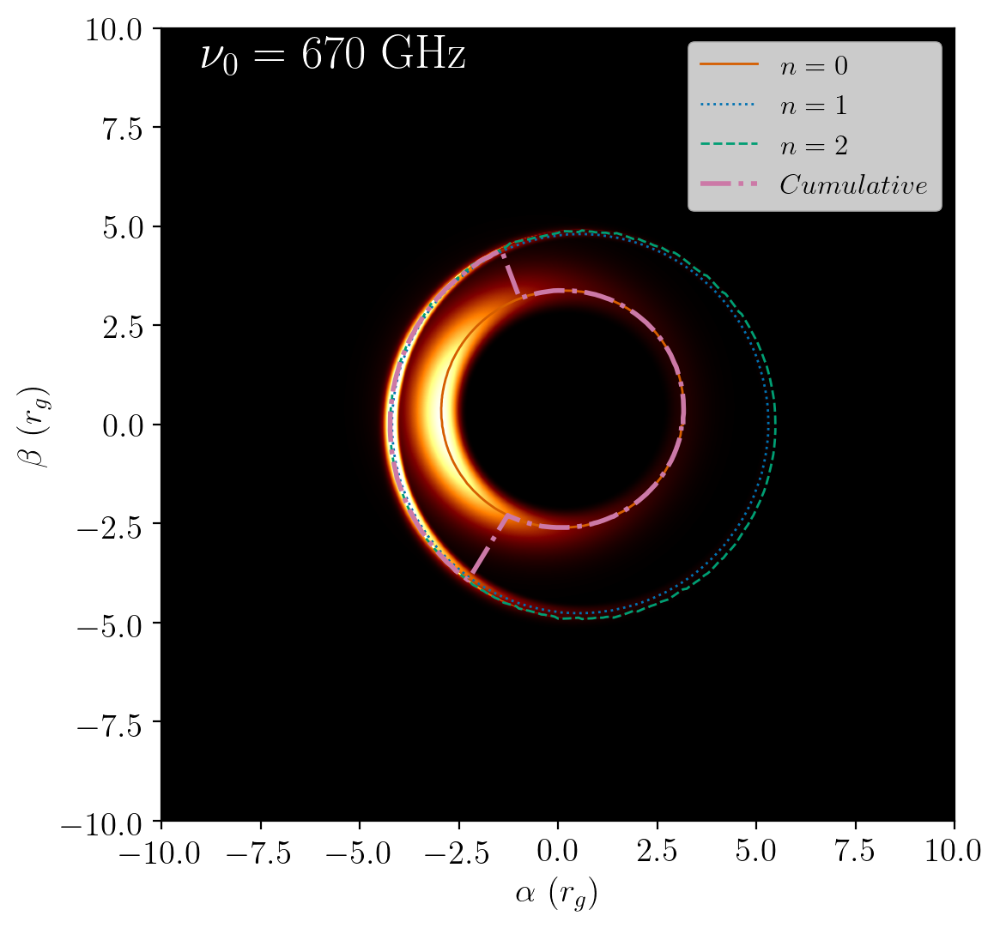

In [50]:
fig, ax = plt.subplots(1, 1, figsize=[6, 6], dpi=200)


radiiVSVarphi(fig, ax, params.limits, intensities,average=True)

# ax0.text(2, 1.01, astroModels.var_label[action["var"]]
#          + str(round(x_variable[i] / astroModels.scale_label[action["var"]], 2))
#          + ' ' + astroModels.units_label[action["var"]], fontsize=12, color="k")
ax.text(-9, 9, R"$\nu_0=$ 670 GHz" , fontsize=20, color="white")
ax.set_xlabel(r"$\alpha$" + " " + r"($r_g$)")
ax.legend()
limited = 8
ax.set_xlim(-limited, limited)  # units of M
ax.set_ylim(-limited, limited)
ax.set_ylabel(r"$\beta$" + " " + r"($r_g$)")
ax.set_yticks(ax.get_xticks())
ax.set_xticks(ax.get_yticks())
ax.set_rasterization_zorder(0) 

# plt.savefig(fig_home + "SingleImage",dpi=200,bbox_inches='tight')


# Alter Spin

In [51]:


current_geo_model = fileloading.totalModelNametoGridModel("ModelA_221",bigRun2.run_type)
fileloading.loadGeoModel(current_geo_model, run2.getRunName())

a = params.spin_case

inc = params.i_case * np.pi / 180  # inclination angle
rh = 1 + np.sqrt(1 - a ** 2)  # event horizon
# angles to sample
varphis = np.linspace(-180, 179, 360) * np.pi / 180

# generate outer shadow (n=inf) curve with kgeo
data_outer = kgeo.equatorial_lensing.rho_of_req(a, inc, rh, mbar=5, varphis=varphis)
(_, rhos_outer, alphas_outer, betas_outer) = data_outer

r_outerA = image_tools.curve_params(varphis, rhos_outer)

#_________________________________________________________________________________________


current_geo_model = fileloading.totalModelNametoGridModel("ModelB_221",bigRun2.run_type)
fileloading.loadGeoModel(current_geo_model, run2.getRunName())

a = params.spin_case

inc = params.i_case * np.pi / 180  # inclination angle
rh = 1 + np.sqrt(1 - a ** 2)  # event horizon
# angles to sample
varphis = np.linspace(-180, 179, 360) * np.pi / 180

# generate outer shadow (n=inf) curve with kgeo
data_outer = kgeo.equatorial_lensing.rho_of_req(a, inc, rh, mbar=5, varphis=varphis)
(_, rhos_outer, alphas_outer, betas_outer) = data_outer

r_outerB = image_tools.curve_params(varphis, rhos_outer)

#_________________________________________________________________________________________
current_geo_model = fileloading.totalModelNametoGridModel("ModelC_221",bigRun2.run_type)
fileloading.loadGeoModel(current_geo_model, run2.getRunName())

a = params.spin_case

inc = params.i_case * np.pi / 180  # inclination angle
rh = 1 + np.sqrt(1 - a ** 2)  # event horizon
# angles to sample
varphis = np.linspace(-180, 179, 360) * np.pi / 180

# generate outer shadow (n=inf) curve with kgeo
data_outer = kgeo.equatorial_lensing.rho_of_req(a, inc, rh, mbar=5, varphis=varphis)
(_, rhos_outer, alphas_outer, betas_outer) = data_outer

r_outerC = image_tools.curve_params(varphis, rhos_outer)

#_________________________________________________________________________________________



Loading ModelA

file /scratch/gpfs/td6241/aart/bigRuns/OctRun/geoModels/ModelA.py Loaded as /home/td6241/repo/aart/params.py

Loading ModelB

file /scratch/gpfs/td6241/aart/bigRuns/OctRun/geoModels/ModelB.py Loaded as /home/td6241/repo/aart/params.py

Loading ModelC

file /scratch/gpfs/td6241/aart/bigRuns/OctRun/geoModels/ModelC.py Loaded as /home/td6241/repo/aart/params.py


In [52]:
frequency_points = [86e9,230e9,345e9]
ModelA22 = runDataClass.SingleModelData(bigRun2.getSubPaths(),run2.getRunName(),"ModelA_221",frequency_points)
ModelB22 = runDataClass.SingleModelData(bigRun2.getSubPaths(),run2.getRunName(),"ModelB_221",frequency_points)
ModelC22 = runDataClass.SingleModelData(bigRun2.getSubPaths(),run2.getRunName(),"ModelC_221",frequency_points)

spinModels = [ModelA22,ModelB22,ModelC22]

meanRadiiThicks = [None,None,None]
spinXaxis = [None,None,None]
conv = [None,None,None]
fluxPeaks = [None,None,None]
r_outers = [r_outerA,r_outerB,r_outerC]

num_of_observation_points = 1000
percent_diff = 2
stop = 670e9
start = action["start"]
points = num_of_observation_points - 1
step = (stop - start)/points
coords = np.linspace(action["start"],670e9,num_of_observation_points) / 1e9

temodel = 0
for i in range (len(spinModels)):

    spinXaxis[i] = spinModels[i]["x_variable"] / astroModels.scale_label["nu0"]
    meanRadiiThicks[i] = spinModels[i]["mean_radii_Thick"]
    
    cumu_interp = interp1d(spinXaxis[i], meanRadiiThicks[i][:, 3])(coords)
    n2_interp = interp1d(spinXaxis[i], meanRadiiThicks[i][:, 2])(coords)
    conv[i] = bigRun2[i,1,1,temodel]['conv'](3)/1e9
    
    spinjanksysThick = spinModels[i]["janksys_thick"] 
    janksy_interp = interp1d(spinXaxis[i],spinjanksysThick[:, 3])(coords)
    fluxPeaks[i] = (start + step * np.argmax(janksy_interp)) / astroModels.scale_label[action['var']]
    



In [53]:
def radiiVersusFreq2(ax,xaxis,mean_radii,conv_1=None,flux_peak=None,r_outer=None):
    
    if conv_1 is not None:
        ax.axvline(conv_1,
                   color=conv_1_style["color"], 
                   linestyle=conv_1_style["linestyle"], 
                   linewidth=conv_1_style["linewidth"]
                  )
    
    if flux_peak is not None:
        ax.axvline(flux_peak, color=flux_peak_style["color"], 
                   linestyle=flux_peak_style["linestyle"], 
                   linewidth=flux_peak_style["linewidth"]
                  )
    
    if r_outer is not None:
        ax.axhline(r_outer,
                   color=r_outer_style["color"],
                   linestyle=r_outer_style["linestyle"], 
                   linewidth=r_outer_style["linewidth"],
                   alpha=0.3
                  )


    amount_to_plot = 4

    for i in reversed(range(amount_to_plot)):
        ax.plot(xaxis, mean_radii[:, i],
                 "-", 
                 label=RingStyle["label"][i],
                 color=RingStyle["color"][i], 
                 linewidth=RingStyle["linewidth"][i])


    # Labels
    # ax.set_xlabel(astroModels.var_label["nu0"].replace('=', '')
    #                + ' (' + astroModels.units_label["nu0"] + ')')
    ax.set_xscale('log')
    ax.set_yscale('log')

    ax.xaxis.set_minor_formatter(ticker.FormatStrFormatter('%.0f'))
    ax.xaxis.set_major_formatter(ticker.FormatStrFormatter("%.0f"))
    ax.yaxis.set_minor_formatter(ticker.FormatStrFormatter('%.1f'))
    ax.yaxis.set_major_formatter(ticker.FormatStrFormatter("%.1f"))
    
    if flux_peak is not None:
        if np.abs(conv_1 - flux_peak) > 40:
            new_ticks = [xaxis[0], 230, conv_1, flux_peak, xaxis[xaxis.size - 1]]
        elif np.abs(230 - flux_peak) > 60:
            new_ticks = [xaxis[0], 230, flux_peak, xaxis[xaxis.size - 1]]
        else:
            new_ticks = [xaxis[0], 230, xaxis[xaxis.size - 1]]
    else:
        new_ticks = [xaxis[0], 230, xaxis[xaxis.size - 1]]
    ax.set_xticks(new_ticks)
    
#     if r_outer is not None:
#         new_ticks = [xaxis[0], 230, xaxis[xaxis.size - 1]]
#     ax.set_yticks(new_ticks)

    new_ticks = np.append(ax.get_yticks(), r_outer)
    # new_ticks = np.append(new_ticks, r_inner)
    # print(new_ticks)
    ax.set_yticks(new_ticks)
    n = 4  # Keeps every 4th label
    [l.set_visible(False) for (i, l) in enumerate(ax.xaxis.get_minorticklabels()) if i % n != 0]
    ax.set_xlim(xaxis[0], xaxis[xaxis.size - 1])

#     ax.set_ylim(0, 6)
    
    # ax.tick_params('y', which="both", labelleft=False)

    
    ax.tick_params('x', which="both", labelbottom=True)
    n = 6  # Keeps every 4th label
    [l.set_visible(False) for (i, l) in enumerate(ax.xaxis.get_minorticklabels()) if i % n != 0]
    ax.tick_params('x', 
          length=xTickParams["length"], 
          width=xTickParams["width"], 
          which=xTickParams["which"], 
          labelrotation=xTickParams["labelrotation"])
    

    # ax.tick_params('x', length=20, width=1, which='major', labelrotation=80)

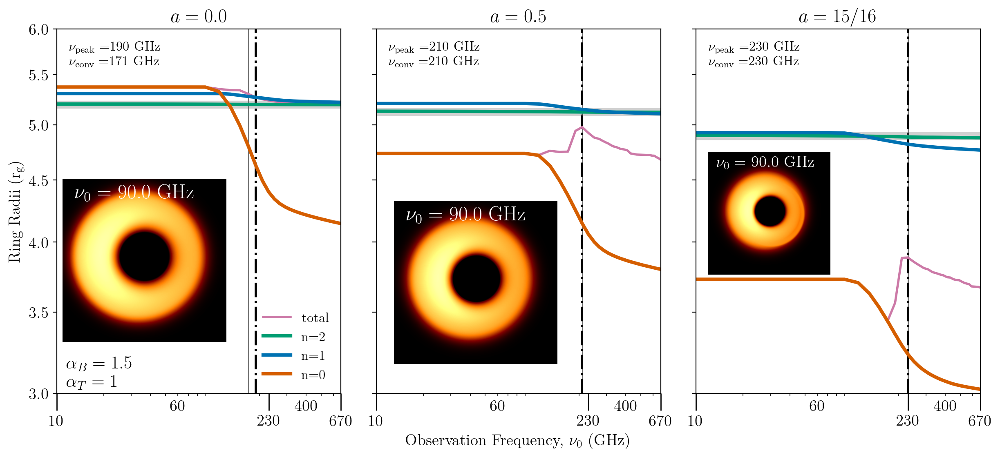

In [54]:
fig, ax = plt.subplots(1, 3, figsize=[12,5], dpi=200,sharey="row")
# fig.suptitle('Full Solution', fontsize=16,y=1.03)
displayfreq = 90e9
# ax = [None,None,None]
fig.tight_layout(pad=.5)

temodel = 0
# Subplot 1____________________________________________________________________________
i=0
# ax[i] = plt.subplot(1,3,i+1)
radiiVersusFreq2(ax[i] ,
                spinXaxis[i],
                meanRadiiThicks[i],
                conv[i],
                fluxPeaks[i],
                r_outers[i]
               )
ax[i].set_title(R"$a=0.0$")
ax[i].text(11.5, 3.04, R"$\alpha_B=1.5$" + "\n" + R" $\alpha_T=1$" , fontsize=16, color="k")

        
text = R"$\nu_{\rm peak}=$" + str("{:.0f}".format(fluxPeaks[i]))+ ' ' + astroModels.units_label["nu0"] + "\n"  + R"$\nu_{\rm conv}=$" + str("{:.0f}".format(conv[i])) + ' ' + astroModels.units_label["nu0"]
ax[i].text(12, 5.6, text , fontsize=12, color="k")
ax[i].set_rasterization_zorder(0) 


# spinFullImage[1,1]
# spinFullImage[2,1]
inset_size = .4
newax = fig.add_axes([.042,.2,0.2,.4], anchor='SW', zorder=1)

h5f = h5py.File(bigRun2[i,1,1,temodel]['cintent_data'](displayfreq),'r')
image = h5f['bghts_full_absorbtion'][:]
h5f.close()

newax.imshow(image, vmax=np.max(image) * 1.2, origin="lower", cmap="afmhot",
           extent=[-lim0, lim0, -lim0, lim0])
newax.text(-8.5, 7.6, R"$\nu_0=$ {} GHz".format(displayfreq / 1e9) , fontsize=18, color="white")
newax.axis('off')
limited=10
newax.set_xlim(-limited, limited)
newax.set_ylim(-limited, limited)

# # Subplot 2____________________________________________________________________________

i=1
# ax[i] = plt.subplot(1,3,i+1,sharey=ax[0])

radiiVersusFreq2(ax[i] ,
                spinXaxis[i],
                meanRadiiThicks[i],
                conv[i],
                fluxPeaks[i],
                r_outers[i]
               )
ax[i].set_title(R"$a=0.5$")
        
text = R"$\nu_{\rm peak}=$" + str("{:.0f}".format(fluxPeaks[i]))+ ' ' + astroModels.units_label["nu0"] + "\n"  + R"$\nu_{\rm conv}=$" + str("{:.0f}".format(conv[i])) + ' ' + astroModels.units_label["nu0"]
ax[i].text(12, 5.6, text , fontsize=12, color="k")

newax = fig.add_axes([.38,.146,0.2,inset_size], anchor='SW', zorder=1)

h5f = h5py.File(bigRun2[i,1,1,temodel]['cintent_data'](displayfreq),'r')
image = h5f['bghts_full_absorbtion'][:]
h5f.close()

newax.imshow(image, vmax=np.max(image) * 1.2, origin="lower", cmap="afmhot",
           extent=[-lim0, lim0, -lim0, lim0])
newax.text(-8.5, 7.6, R"$\nu_0=$ {} GHz".format(displayfreq / 1e9) , fontsize=18, color="white")
newax.axis('off')
newax.set_xlim(-limited, limited)
newax.set_ylim(-limited, limited)
ax[i].set_rasterization_zorder(0)
# Subplot 3____________________________________________________________________________

i=2
# ax[i] = plt.subplot(1,3,i+1,sharey=ax[0])
radiiVersusFreq2(ax[i] ,
                spinXaxis[i],
                meanRadiiThicks[i],
                conv[i],
                fluxPeaks[i],
                r_outers[i]
               )
ax[i].set_title(R"$a=15/16$")
        
text = R"$\nu_{\rm peak}=$" + str("{:.0f}".format(fluxPeaks[i])) + ' ' + astroModels.units_label["nu0"]+ "\n"  + R"$\nu_{\rm conv}=$" + str("{:.0f}".format(conv[i])) + ' ' + astroModels.units_label["nu0"]
ax[i].text(12, 5.6, text , fontsize=12, color="k")

newax = fig.add_axes([.7,.365,0.2,0.3], anchor='SW', zorder=1)
h5f = h5py.File(bigRun2[i,1,1,temodel]['cintent_data'](displayfreq),'r')
image = h5f['bghts_full_absorbtion'][:]
h5f.close()

newax.imshow(image, vmax=np.max(image) * 1.2, origin="lower", cmap="afmhot",
           extent=[-lim0, lim0, -lim0, lim0])
newax.text(-8.5, 7.6, R"$\nu_0=$ {} GHz".format(displayfreq / 1e9) , fontsize=14, color="white")
newax.axis('off')
newax.set_xlim(-limited, limited)
newax.set_ylim(-limited, limited)
ax[i].set_rasterization_zorder(0)



#         if k == 4:
ax[0].set_ylabel("Ring Radii ({})".format(R'$\rm r_g$'))
            
#         if k == 7:
ax[0].legend(frameon=False,loc='lower right')

#         if k == 8:
ax[1].set_xlabel(R"Observation Frequency, $\nu_0$ (GHz)")

ax[0].tick_params('y', which="both", labelleft=True)

ax[0].set_ylim(3,6)
ax[0].yaxis.set_major_locator(MultipleLocator(.5))

plt.savefig(fig_home + "SpinThickRadiiVNuRow.png",dpi=200,bbox_inches='tight')

# BLURR

In [98]:
limit = lim0

In [55]:
def fullBlurrImage(ax,Absorbtion_Image,blurr):
    vmax0 = np.nanmax(Absorbtion_Image) * 1.2

    im = ax.imshow(Absorbtion_Image, vmax=vmax0, origin="lower", cmap="afmhot", extent=[-limit, limit, -limit, limit])
    ax.text(-9.6, 8.5, R"$\sigma=$" + str(blurr) + R" $\mu as$", fontsize=20, color="white")
    
    ax.set_xlim(-10, 10)  # units of M
    ax.set_ylim(-10, 10)


In [56]:
blur0Image =  '/scratch/gpfs/td6241/aart/bigRuns/OctRun/Data/intensity/ModelC_221/clean/nu0_2.30000e+11'
blur1Image =  '/scratch/gpfs/td6241/aart/bigRuns/OctRun/Data/intensity/ModelC_221/blurr1/nu0_blurr_2.30000e+11'
blur5Image =  '/scratch/gpfs/td6241/aart/bigRuns/OctRun/Data/intensity/ModelC_221/blurr5/nu0_blurr_2.30000e+11'
blur10Image = '/scratch/gpfs/td6241/aart/bigRuns/OctRun/Data/intensity/ModelC_221/blurr10/nu0_blurr_2.30000e+11'
blur20Image = '/scratch/gpfs/td6241/aart/bigRuns/OctRun/Data/intensity/ModelC_221/blurr20/nu0_blurr_2.30000e+11'



h5f = h5py.File(blur0Image, 'r')
blur0Image = h5f['bghts_full_absorbtion'][:]
h5f.close()

h5f = h5py.File(blur1Image, 'r')
blur1Image = h5f['thick_blurr_image'][:]
h5f.close()

h5f = h5py.File(blur5Image, 'r')
blur5Image = h5f['thick_blurr_image'][:]
h5f.close()

h5f = h5py.File(blur10Image, 'r')
blur10Image = h5f['thick_blurr_image'][:]
h5f.close()


h5f = h5py.File(blur20Image, 'r')
blur20Image = h5f['thick_blurr_image'][:]
h5f.close()


In [57]:
rsize = image_tools.num_of_radial_points

def radiiProfile(ax,images,mass,color,sigma):
#     rmax = images.shape[0] * .4
#     peakAbsorb, interpAbsorb = image_tools.radii_of_thetaV2_data(images)
#     peaks = peakAbsorb
#     interps = interpAbsorb
#     x = np.linspace(0, rmax - 1, rsize) * params.dx0
#     ptheta = [np.pi]
#     colors = [RingStyle["color"][0], RingStyle["color"][1], 'tab:red']
#     parg = []
#     for L in range(len(ptheta)):
#         parg += [image_tools.rad_to_arg(ptheta[L])]

#         yplt = jy(interps[parg[L]], current_freq, mass)
#         ax.plot(x, yplt, linewidth=2, color=color,
#                        label=R"$\sigma= $" + str(sigma))
        # ax.axvline(peaks[parg[L]], color=colors[L],
        #            linewidth=1)
    x = np.linspace(-lim0, lim0, 2000)
    
    ax.plot(x, images[1000-1,:], linewidth=2, color=color,label=R"$\sigma= $" + str(sigma))
        # ax.axvline(peaks[parg[L]], color=colors[L],
        #            linewidth=1)
    # ax.axvline(x[images[1000-1,:].argmax()],linestyle='--',color=color)
    
    
    ax.set_xlabel(R"$r_g$")
    ax.set_xlim(-8, 8)
    ax.set_ylim(0, 35)
    ax.set_ylabel(R"Brightness Temperature ($10^{10}$ K)")
    ax.yaxis.tick_right()
    ax.yaxis.set_label_position("right")
    
    
    
    
    

    # colors = [RingStyle["color"][0], RingStyle["color"][1], RingStyle['color'][2]]
    # parg = []



    # ax.set_xlim([2, 6])

    # ax.tick_params('y', which="both", labelleft=False)
    # ax.tick_params('x', which="both", labelbottom=False)



In [58]:
def plotCircle(ax,sigma,x,y,line=None):
    center = (x, y)
    radius = sigma / (2*M2uas)
    if line is None:
        width = 1
    else:
        width = line
    circle = Circle(center, radius,fill=False,color="white",linewidth=width)
    ax.add_patch(circle)


In [59]:
mass = bigRun2[0,1,1,0]['bp']["mass"]
one_M = ilp.rg_func(mass * u.g).to(u.m)
M2uas = np.arctan(one_M.value / dBH) / muas_to_rad  # Mass to micro arcseconds


In [60]:
from mpl_toolkits.axes_grid1.anchored_artists import AnchoredSizeBar
import matplotlib.font_manager as fm

In [61]:
one_M = ilp.rg_func(bigRun2['ModelC_221']['bp']["mass"] * u.g).to(u.m)
M2uas = np.arctan(one_M.value / dBH) / muas_to_rad

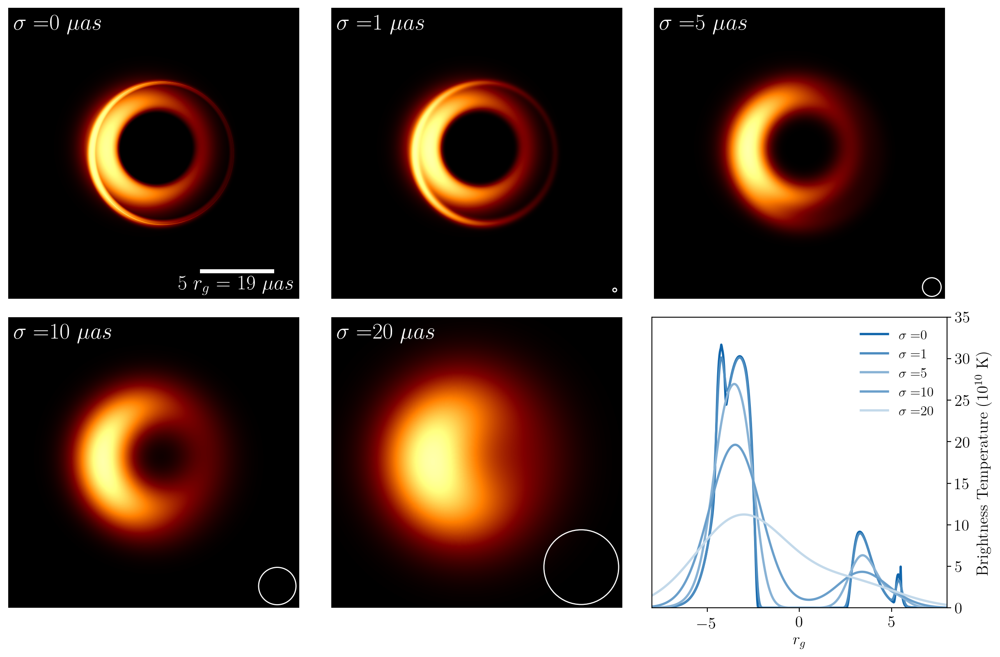

In [64]:
fig, dum = plt.subplots(2, 3, figsize=[12, 8], dpi=200)
fontprops = fm.FontProperties(size=18)
fig.tight_layout(w_pad=-2,h_pad=0)
ax0 =  plt.subplot(2,3,1)
ax1 =  plt.subplot(2,3,2)
ax2 =  plt.subplot(2,3,3)
ax3 =  plt.subplot(2,3,4)
ax4 =  plt.subplot(2,3,5)
ax5 =  plt.subplot(2,3,6)
# ax1 = plt.subplot2grid(shape=(3, 3), loc=(0, 0), colspan=3)
# ax1 = plt.subplot2grid(shape=(3, 3), loc=(0, 0), colspan=3)
# ax2 = plt.subplot2grid(shape=(3, 3), loc=(1, 0), colspan=1)
# ax3 = plt.subplot2grid(shape=(3, 3), loc=(1, 2), rowspan=2)
# ax4 = plt.subplot2grid((3, 3), (2, 0))
# ax5 = plt.subplot2grid((3, 3), (2, 1), colspan=1)

ax = [ax0,ax1,ax2,ax3,ax4]
for axs in ax:
    axs.axis('off')

fig.tight_layout(w_pad=0,h_pad=.8)

fullBlurrImage(ax0,blur0Image,0)
fullBlurrImage(ax1,blur1Image,1)
fullBlurrImage(ax2,blur5Image,5)
fullBlurrImage(ax3,blur10Image,10)
fullBlurrImage(ax4,blur20Image,20)


plotCircle(ax1,1,9.5,-9.4,1)
plotCircle(ax2,5,9.1,-9.2)
plotCircle(ax3,10,8.5,-8.5)
plotCircle(ax4,20,7.2,-7.2)

ax4.set_xlabel(r"$\alpha$" + " " + r"($r_g$)")
ax2.set_ylabel(r"$\beta$" + " " + r"($r_g$)")

mass = bigRun2[0,1,1,0]['bp']["mass"]
colorGradiant=['#1065AB','#4C8CC0','#88B2D5','#6A9FCB','#C3D9EA']
radiiProfile(ax5, blur0Image/1e9,mass,colorGradiant[0],0)
radiiProfile(ax5, blur1Image/1e9,mass,colorGradiant[1],1)
radiiProfile(ax5, blur5Image/1e9,mass,colorGradiant[2],5)
radiiProfile(ax5, blur10Image/1e9,mass,colorGradiant[3],10)
radiiProfile(ax5, blur20Image/1e9,mass,colorGradiant[4],20)

# Scalebar
rgpick=5
scalebar = AnchoredSizeBar(ax0.transData,
                           rgpick, str(rgpick) + R' $r_g$ = ' + '{} '.format("{:.0f}".format(rgpick * M2uas)) + R'$\mu as$', 'lower right', 
                           pad=0.1,
                           color='white',
                           frameon=False,
                           size_vertical=.2,
                           fontproperties=fontprops)

ax0.add_artist(scalebar)

ax5.legend(frameon=False)

ax0.set_rasterization_zorder(0)
ax1.set_rasterization_zorder(0)
ax2.set_rasterization_zorder(0)
ax3.set_rasterization_zorder(0)
ax4.set_rasterization_zorder(0)
ax5.set_rasterization_zorder(0)
plt.savefig(fig_home + "Blurring",dpi=200,bbox_inches='tight')

# Inoisy Blurr 

In [110]:
current_geo_model = fileloading.totalModelNametoGridModel(modelExample,bigRun2.run_type)
bfileloading.loadGeoModel(current_geo_model, run2.getRunName())()
importlib.reload(params)


Loading ModelC

file /scratch/gpfs/td6241/aart/bigRuns/OctRun/geoModels/ModelC.py Loaded as /home/td6241/repo/aart/params.py
Remember to call 'importlib.reload(params)' to reload parameters


<module 'params' from '/home/td6241/repo/aart/params.py'>

In [65]:

# brightparams = {
#     "p_mag": -1.5,
#     "p_temp": -1,
#     "p_dens": -.7,
#     "n_th0": 1.9e4,
#     "t_e0": 1e11,
#     "b_0": 5,
#     "theta_b": 50.0 * (np.pi / 180),  # NONE VARRYING________________________________________
#     "mass": (MMkg * u.kg).to(u.g).value,
#     "nu0": 90e9,
#     "scale_height": .5,
#     "rb_0": 5,
#     "beta": 1.0,  # Legacy _____________________________________
#     "r_ie": 10.0,
#     "nscale": .2
# }

# funckeys = {
#     "emodelkey": 0,  # emodelkey Emission Model choice, 0 = thermal ultrarelativistic, 1 = power law
#     "bkey": 2,  # bkey
#     "nnoisykey": 1,  # nnoisykey Inoisy density. 0 = no noise, 1 = noise
#     "tnoisykey": 1,  # tnoisykey Inoisy temperature
#     "bnoisykey": 1,  # bnoisykey Inoisy magnetic field
#     "theta_bkey": 0
# }
# args = fileloading.createIntensityArgs(brightparams,lband,rtray,funckeys=funckeys)

current_geo_model = fileloading.totalModelNametoGridModel(modelExample,bigRun2.run_type)
bfileloading.loadGeoModel(current_geo_model, run2.getRunName())()


Loading ModelC

file /scratch/gpfs/td6241/aart/bigRuns/OctRun/geoModels/ModelC.py Loaded as /home/td6241/repo/aart/params.py
Remember to call 'importlib.reload(params)' to reload parameters


In [67]:
%time !python3 lensingbands.py

Welcome to eht-imaging! v 1.2.7 

/home/td6241/anaconda3/envs/mural/lib/python3.12/site-packages/kgeo-0.0.1-py3.12.egg/kgeo/bfields.py:158: SyntaxWarning: invalid escape sequence '\m'
/home/td6241/anaconda3/envs/mural/lib/python3.12/site-packages/kgeo-0.0.1-py3.12.egg/kgeo/bfields.py:183: SyntaxWarning: invalid escape sequence '\m'
/home/td6241/anaconda3/envs/mural/lib/python3.12/site-packages/kgeo-0.0.1-py3.12.egg/kgeo/bfields.py:158: SyntaxWarning: invalid escape sequence '\m'
/home/td6241/anaconda3/envs/mural/lib/python3.12/site-packages/kgeo-0.0.1-py3.12.egg/kgeo/bfields.py:183: SyntaxWarning: invalid escape sequence '\m'
Computing the lensing bands
Number of points in the n=0 grid  4000000
Number of points in the n=1 grid  4000000
Number of points in the n=2 grid  4000000
File  /scratch/gpfs/td6241/aart/rawResults/LensingBands_a_0.9375_i_17.h5  created.
CPU times: user 315 ms, sys: 72.4 ms, total: 388 ms
Wall time: 42.5 s


In [68]:
# fnbands="./Results/LensingBands_a_%s_i_%s.h5"%(spin_case,i_case)
fnbands= path + "LensingBands_a_%s_i_%s.h5"%(spin_case,i_case)

print("Reading file: ",fnbands)

h5f = h5py.File(fnbands,'r')

#Points for the boundary of the BH shadow
alpha_critc=h5f['alpha'][:]
beta_critc=h5f['beta'][:]

#The concave hulls for the lensing bands
hull_0i=h5f['hull_0i'][:]
hull_0e=h5f['hull_0e'][:]
hull_1i=h5f['hull_1i'][:]
hull_1e=h5f['hull_1e'][:]
hull_2i=h5f['hull_2i'][:]
hull_2e=h5f['hull_2e'][:]

#The grid points for each lensing band
supergrid0=h5f['grid0'][:]
N0=int(h5f["N0"][0])
mask0=h5f['mask0'][:]
lim0=int(h5f["lim0"][0])
supergrid1=h5f['grid1'][:]
N1=int(h5f["N1"][0])
mask1=h5f['mask1'][:]
lim1=int(h5f["lim1"][0])
supergrid2=h5f['grid2'][:]
N2=int(h5f["N2"][0])
mask2=h5f['mask2'][:]
lim2=int(h5f["lim2"][0])

h5f.close()

Reading file:  /scratch/gpfs/td6241/aart/rawResults/LensingBands_a_0.9375_i_17.h5


In [71]:
%time !python3 raytracing.py


Welcome to eht-imaging! v 1.2.7 

/home/td6241/anaconda3/envs/mural/lib/python3.12/site-packages/kgeo-0.0.1-py3.12.egg/kgeo/bfields.py:158: SyntaxWarning: invalid escape sequence '\m'
/home/td6241/anaconda3/envs/mural/lib/python3.12/site-packages/kgeo-0.0.1-py3.12.egg/kgeo/bfields.py:183: SyntaxWarning: invalid escape sequence '\m'
/home/td6241/anaconda3/envs/mural/lib/python3.12/site-packages/kgeo-0.0.1-py3.12.egg/kgeo/bfields.py:158: SyntaxWarning: invalid escape sequence '\m'
/home/td6241/anaconda3/envs/mural/lib/python3.12/site-packages/kgeo-0.0.1-py3.12.egg/kgeo/bfields.py:183: SyntaxWarning: invalid escape sequence '\m'
Ray-tracing
Reading file:  /scratch/gpfs/td6241/aart/rawResults/LensingBands_a_0.9375_i_17.h5
Analytical ray-tracing of the n=0 band points
Analytical ray-tracing of the n=1 band points
Analytical ray-tracing of the n=2 band points
File  /scratch/gpfs/td6241/aart/rawResults/Rays_a_0.9375_i_17.h5  created.

A total of 12000000 photons were ray-traced
CPU times: use

In [70]:
# fnrays="./Results/Rays_a_%s_i_%s.h5"%(spin_case,i_case)
fnrays= path + "Rays_a_%s_i_%s.h5"%(spin_case,i_case)

print("Reading file: ",fnrays)

h5f = h5py.File(fnrays,'r')

rs0=h5f['rs0'][:]
sign0=h5f['sign0'][:]
t0=h5f['t0'][:]
phi0=h5f['phi0'][:]

rs1=h5f['rs1'][:]
sign1=h5f['sign1'][:]
t1=h5f['t1'][:]
phi1=h5f['phi1'][:]

rs2=h5f['rs2'][:]
sign2=h5f['sign2'][:]
t2=h5f['t2'][:]
phi2=h5f['phi2'][:]


h5f.close()

Reading file:  /scratch/gpfs/td6241/aart/rawResults/Rays_a_0.9375_i_17.h5


FileNotFoundError: [Errno 2] Unable to open file (unable to open file: name = '/scratch/gpfs/td6241/aart/rawResults/Rays_a_0.9375_i_17.h5', errno = 2, error message = 'No such file or directory', flags = 0, o_flags = 0)

In [118]:
%time !python3 magneticangle.py

Welcome to eht-imaging! v 1.2.7 

/home/td6241/anaconda3/envs/mural/lib/python3.12/site-packages/kgeo-0.0.1-py3.12.egg/kgeo/bfields.py:158: SyntaxWarning: invalid escape sequence '\m'
/home/td6241/anaconda3/envs/mural/lib/python3.12/site-packages/kgeo-0.0.1-py3.12.egg/kgeo/bfields.py:183: SyntaxWarning: invalid escape sequence '\m'
/home/td6241/anaconda3/envs/mural/lib/python3.12/site-packages/kgeo-0.0.1-py3.12.egg/kgeo/bfields.py:158: SyntaxWarning: invalid escape sequence '\m'
/home/td6241/anaconda3/envs/mural/lib/python3.12/site-packages/kgeo-0.0.1-py3.12.egg/kgeo/bfields.py:183: SyntaxWarning: invalid escape sequence '\m'
Magnetic Angle
using default lband
Reading file:  /scratch/gpfs/td6241/aart/rawResults/LensingBands_a_0.9375_i_17.h5
using default rtray
Reading file:  /scratch/gpfs/td6241/aart/rawResults/Rays_a_0.9375_i_17.h5
File  /scratch/gpfs/td6241/aart/rawResults/MagneticAngle_a_0.9375_i_17.h5  created.
CPU times: user 28.3 ms, sys: 32.5 ms, total: 60.8 ms
Wall time: 3.9 s


In [119]:
fn=path + "MagneticAngle_a_%s_i_%s.h5"%(spin_case,i_case)
print("Reading file: ",fn)

h5f = h5py.File(fn,'r')

#Points for the boundary of the BH shadow
anglen0=h5f['cos2angB_n0'][:]
anglen1=h5f['cos2angB_n1'][:]
anglen2=h5f['cos2angB_n2'][:]

h5f.close()


Reading file:  /scratch/gpfs/td6241/aart/rawResults/MagneticAngle_a_0.9375_i_17.h5


In [120]:

brightparams = bigRun2[modelExample]['bp'].copy()
brightparams['nscale'] = .3

funckeys = {
    "emodelkey": 0,  # emodelkey Emission Model choice, 0 = thermal ultrarelativistic, 1 = power law
    "bkey": 2,  # bkey
    "nnoisykey": 1,  # nnoisykey Inoisy density. 0 = no noise, 1 = noise
    "tnoisykey": 1,  # tnoisykey Inoisy temperature
    "bnoisykey": 1,  # bnoisykey Inoisy magnetic field
    "theta_bkey": 0
}

frequencies = [86e9,230e9,360e9]
filenames = [None,None,None]
for i in range(3):
    brightparams['nu0'] = frequencies[i]
    
    args = fileloading.createIntensityArgs(brightparams,lband,rtray,funckeys=funckeys)
    subprocess.run([args], shell=True)
    filenames[i] = fileloading.intensityNameNoUnits(brightparams,funckeys)
    

/home/td6241/anaconda3/envs/mural/lib/python3.12/site-packages/kgeo-0.0.1-py3.12.egg/kgeo/bfields.py:158: SyntaxWarning: invalid escape sequence '\m'
/home/td6241/anaconda3/envs/mural/lib/python3.12/site-packages/kgeo-0.0.1-py3.12.egg/kgeo/bfields.py:183: SyntaxWarning: invalid escape sequence '\m'
/home/td6241/anaconda3/envs/mural/lib/python3.12/site-packages/kgeo-0.0.1-py3.12.egg/kgeo/bfields.py:158: SyntaxWarning: invalid escape sequence '\m'
/home/td6241/anaconda3/envs/mural/lib/python3.12/site-packages/kgeo-0.0.1-py3.12.egg/kgeo/bfields.py:183: SyntaxWarning: invalid escape sequence '\m'


Welcome to eht-imaging! v 1.2.7 

using altered rtray
Reading file:  /scratch/gpfs/td6241/aart/bigRuns/OctRun/Data/geo/ModelCRayTracing.h5
using default magAng
Intensity
using altered lband
Reading file:  /scratch/gpfs/td6241/aart/bigRuns/OctRun/Data/geo/ModelCLensing.h5
Reading file:  /scratch/gpfs/td6241/aart/bigRuns/OctRun/Data/geo/ModelCRayTracing.h5
File  /scratch/gpfs/td6241/aart/rawResults/Intensity_a_0.9375_i_17_nu_8.60000e+10_mass_1.32497e+43_scaleh_0.5_thetab_0.873_beta_1.00_rie_10.0_rb_5.0_nth0_8.8e+04_te0_3.0e+10_b0_8.000e+00_pdens_-0.7_ptemp_-1.0_pmag_-1.5_nscale_0.3_emkey_0_bkey_2_nkey_1_tnkey_1_bnkey_1_magkey_0.h5  created.


/home/td6241/anaconda3/envs/mural/lib/python3.12/site-packages/kgeo-0.0.1-py3.12.egg/kgeo/bfields.py:158: SyntaxWarning: invalid escape sequence '\m'
/home/td6241/anaconda3/envs/mural/lib/python3.12/site-packages/kgeo-0.0.1-py3.12.egg/kgeo/bfields.py:183: SyntaxWarning: invalid escape sequence '\m'
/home/td6241/anaconda3/envs/mural/lib/python3.12/site-packages/kgeo-0.0.1-py3.12.egg/kgeo/bfields.py:158: SyntaxWarning: invalid escape sequence '\m'
/home/td6241/anaconda3/envs/mural/lib/python3.12/site-packages/kgeo-0.0.1-py3.12.egg/kgeo/bfields.py:183: SyntaxWarning: invalid escape sequence '\m'


Welcome to eht-imaging! v 1.2.7 

using altered rtray
Reading file:  /scratch/gpfs/td6241/aart/bigRuns/OctRun/Data/geo/ModelCRayTracing.h5
using default magAng
Intensity
using altered lband
Reading file:  /scratch/gpfs/td6241/aart/bigRuns/OctRun/Data/geo/ModelCLensing.h5
Reading file:  /scratch/gpfs/td6241/aart/bigRuns/OctRun/Data/geo/ModelCRayTracing.h5
File  /scratch/gpfs/td6241/aart/rawResults/Intensity_a_0.9375_i_17_nu_2.30000e+11_mass_1.32497e+43_scaleh_0.5_thetab_0.873_beta_1.00_rie_10.0_rb_5.0_nth0_8.8e+04_te0_3.0e+10_b0_8.000e+00_pdens_-0.7_ptemp_-1.0_pmag_-1.5_nscale_0.3_emkey_0_bkey_2_nkey_1_tnkey_1_bnkey_1_magkey_0.h5  created.


/home/td6241/anaconda3/envs/mural/lib/python3.12/site-packages/kgeo-0.0.1-py3.12.egg/kgeo/bfields.py:158: SyntaxWarning: invalid escape sequence '\m'
/home/td6241/anaconda3/envs/mural/lib/python3.12/site-packages/kgeo-0.0.1-py3.12.egg/kgeo/bfields.py:183: SyntaxWarning: invalid escape sequence '\m'
/home/td6241/anaconda3/envs/mural/lib/python3.12/site-packages/kgeo-0.0.1-py3.12.egg/kgeo/bfields.py:158: SyntaxWarning: invalid escape sequence '\m'
/home/td6241/anaconda3/envs/mural/lib/python3.12/site-packages/kgeo-0.0.1-py3.12.egg/kgeo/bfields.py:183: SyntaxWarning: invalid escape sequence '\m'


Welcome to eht-imaging! v 1.2.7 

using altered rtray
Reading file:  /scratch/gpfs/td6241/aart/bigRuns/OctRun/Data/geo/ModelCRayTracing.h5
using default magAng
Intensity
using altered lband
Reading file:  /scratch/gpfs/td6241/aart/bigRuns/OctRun/Data/geo/ModelCLensing.h5
Reading file:  /scratch/gpfs/td6241/aart/bigRuns/OctRun/Data/geo/ModelCRayTracing.h5
File  /scratch/gpfs/td6241/aart/rawResults/Intensity_a_0.9375_i_17_nu_3.60000e+11_mass_1.32497e+43_scaleh_0.5_thetab_0.873_beta_1.00_rie_10.0_rb_5.0_nth0_8.8e+04_te0_3.0e+10_b0_8.000e+00_pdens_-0.7_ptemp_-1.0_pmag_-1.5_nscale_0.3_emkey_0_bkey_2_nkey_1_tnkey_1_bnkey_1_magkey_0.h5  created.


In [121]:
filename = fileloading.intensityNameNoUnits(brightparams,funckeys)

print("Reading file: ", filename)

h5f = h5py.File(filename, 'r')

I0 = h5f['bghts0'][:]  # This implies I0 is 1 pass
I1 = h5f['bghts1'][:]
I2 = h5f['bghts2'][:]

Clean_Absorbtion_Image = h5f['bghts_full_absorbtion'][:]

Clean_Thin_Image = I0+I1+I2

h5f.close()
thin_blurr_image,thick_blurr_image =intensityBlurr.blurrIntensity(brightparams['mass'],Clean_Thin_Image,Clean_Absorbtion_Image, 18)

Reading file:  /scratch/gpfs/td6241/aart/rawResults/Intensity_a_0.9375_i_17_nu_3.60000e+11_mass_1.32497e+43_scaleh_0.5_thetab_0.873_beta_1.00_rie_10.0_rb_5.0_nth0_8.8e+04_te0_3.0e+10_b0_8.000e+00_pdens_-0.7_ptemp_-1.0_pmag_-1.5_nscale_0.3_emkey_0_bkey_2_nkey_1_tnkey_1_bnkey_1_magkey_0.h5


In [122]:
cleanImages = [None,None,None]
blurrImages = [None,None,None]
for i in range(3):
    
    filename = filenames[i]
    frequency = frequencies[i]
    
    print("Reading file: ", filename)
    h5f = h5py.File(filename, 'r')
    Clean_Absorbtion_Image = h5f['bghts_full_absorbtion'][:]
    h5f.close()
    
    thin_blurr_image,thick_blurr_image =intensityBlurr.blurrIntensity(brightparams['mass'],Clean_Thin_Image,Clean_Absorbtion_Image, 18)
    
    cleanImages[i] = Clean_Absorbtion_Image
    blurrImages[i] = thick_blurr_image 
    

Reading file:  /scratch/gpfs/td6241/aart/rawResults/Intensity_a_0.9375_i_17_nu_8.60000e+10_mass_1.32497e+43_scaleh_0.5_thetab_0.873_beta_1.00_rie_10.0_rb_5.0_nth0_8.8e+04_te0_3.0e+10_b0_8.000e+00_pdens_-0.7_ptemp_-1.0_pmag_-1.5_nscale_0.3_emkey_0_bkey_2_nkey_1_tnkey_1_bnkey_1_magkey_0.h5
Reading file:  /scratch/gpfs/td6241/aart/rawResults/Intensity_a_0.9375_i_17_nu_2.30000e+11_mass_1.32497e+43_scaleh_0.5_thetab_0.873_beta_1.00_rie_10.0_rb_5.0_nth0_8.8e+04_te0_3.0e+10_b0_8.000e+00_pdens_-0.7_ptemp_-1.0_pmag_-1.5_nscale_0.3_emkey_0_bkey_2_nkey_1_tnkey_1_bnkey_1_magkey_0.h5
Reading file:  /scratch/gpfs/td6241/aart/rawResults/Intensity_a_0.9375_i_17_nu_3.60000e+11_mass_1.32497e+43_scaleh_0.5_thetab_0.873_beta_1.00_rie_10.0_rb_5.0_nth0_8.8e+04_te0_3.0e+10_b0_8.000e+00_pdens_-0.7_ptemp_-1.0_pmag_-1.5_nscale_0.3_emkey_0_bkey_2_nkey_1_tnkey_1_bnkey_1_magkey_0.h5


In [123]:
from matplotlib import ticker

In [166]:
inoisy_path = EZPaths.aartPath + '/'
GRF = np.load(inoisy_path + "Inoisy_Snap_Keplerian_5.00_0.10_0.94_0.349.npy")

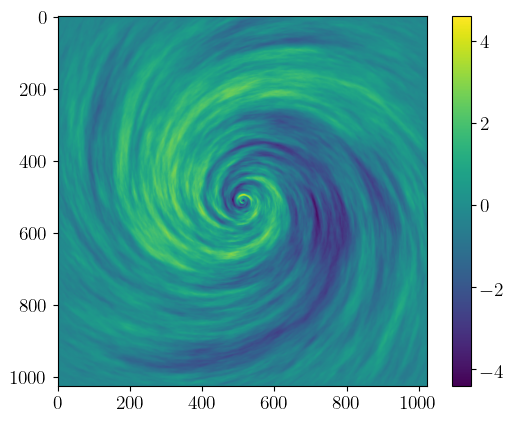

In [81]:
plt.imshow(GRF)
plt.colorbar()

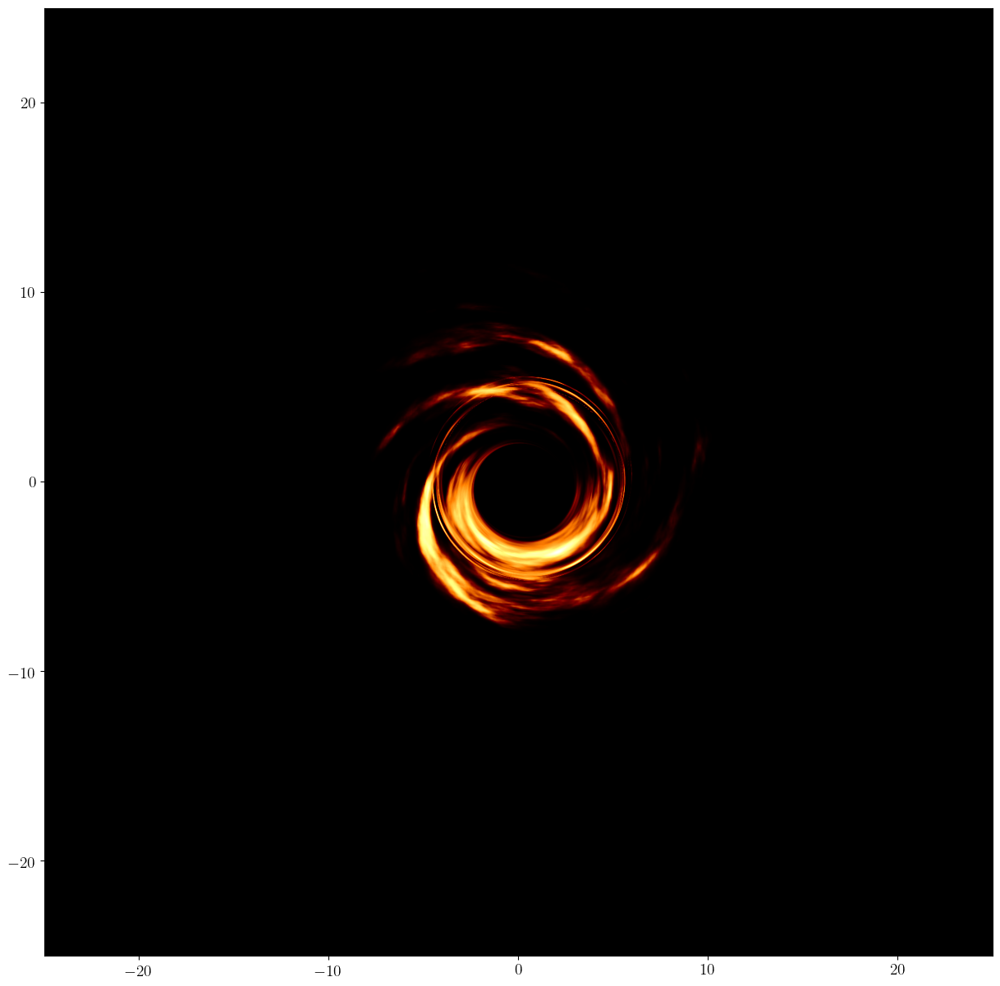

In [151]:
fig, ax = plt.subplots(1,1,figsize=[15, 15])  #, dp
im1 = ax.imshow(np.flipud(cleanImages[1]), origin="lower", cmap="afmhot",
                    extent=[-lim0, lim0, -lim0, lim0])

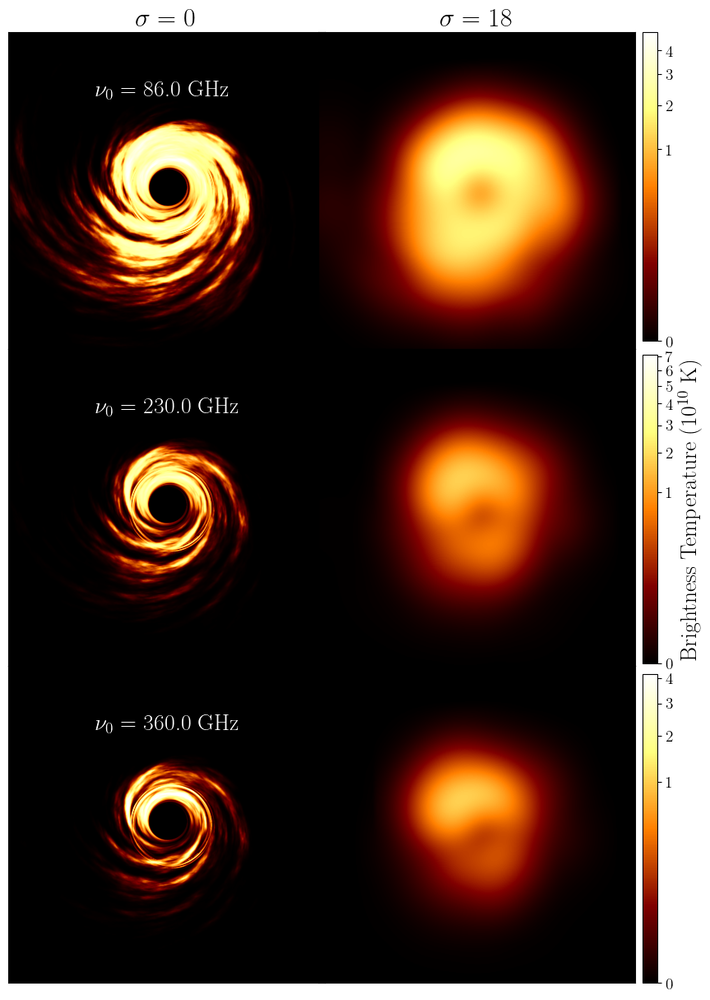

In [124]:
fig, axs = plt.subplots(3,2,figsize=[15, 15])  #, dpi=400
limited = 20

height =  0.25
cbax = [plt.axes((0.3, 0.63, 0.495, height)), plt.axes((0.3, 0.369, 0.495, height)),plt.axes((0.3, 0.11, 0.495, height))]
# cb_ax = plt.axes((0.3, 0.12, 0.495, 0.22))
# cb_ax.axis("off")
# cb_ax = [cb_ax = plt.axes((0.33, 0.1, 0.495, 0.8))]
# cb_ax.axis("off")

axs[0,0].set_title(R'$\sigma = 0$',fontsize=23)
axs[0,1].set_title(R'$\sigma = 18$',fontsize=23)
for i in range(3):
    cb_ax = cbax[i]
    cb_ax.axis('off')
    filename = filenames[i]
    frequency = frequencies[i]
    Clean_Absorbtion_Image = cleanImages[i] / 1e10
    thick_blurr_image =blurrImages[i]  / 1e10
    
    if i == 0:
        vmax = np.max(thick_blurr_image) * 2
    else:
        vmax = np.max(thick_blurr_image) * 4
    ax = axs[i,0]
    ax.set_xticks([])
    ax.set_yticks([])
    ax.text(-9, 12, R"$\nu_0=$ {} GHz".format(str(frequency/1e9)) , fontsize=20, color="white")
    norm_power = .3
    
    im1 = ax.imshow(Clean_Absorbtion_Image, norm=matplotlib.colors.PowerNorm(norm_power, vmax=vmax), origin="lower", cmap="afmhot",
                    extent=[-lim0, lim0, -lim0, lim0],rasterized=True)
    ax.set_xlim(-limited, limited)
    ax.set_ylim(-limited, limited)
    ax.tick_params('x', which="both", labelbottom=False)
    ax.tick_params('y', which="both", labelleft=False)
    ax.set_rasterization_zorder(0)
    
    ax = axs[i,1]
    ax.imshow(thick_blurr_image, norm=matplotlib.colors.PowerNorm(norm_power, vmax=vmax), origin="lower", cmap="afmhot",
          extent=[-lim0, lim0, -lim0, lim0],rasterized=True)

    ax.set_xlim(-limited, limited)
    ax.set_ylim(-limited, limited)


    ax.tick_params('x', which="both", labelbottom=False)
    ax.tick_params('y', which="both", labelleft=False)
    
    colorbar0 = fig.colorbar(im1, fraction=0.046, pad=0.04, format='%.0f',
                             ax=cb_ax)
    if i == 1:
        colorbar0.set_label(R"Brightness Temperature ($10^{10}$ K)",fontsize=20)

        
    
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_rasterization_zorder(0)
        
tick_locator = ticker.MaxNLocator(nbins=5)
colorbar0.locator = tick_locator
            
    
plt.subplots_adjust(wspace=-.52, hspace=0)

# plt.savefig(fig_home + "Inoisy",dpi=200,bbox_inches='tight')


# Inoisy Blurred Analysis

In [216]:
run2 = runDataClass.PrunSingle

bigRun2 = classRunComputing.BigRuns(
    run2.getRunName(),
    run2.getBrightparams(),
    run2.getBPVarNames(),
    run2.getGeoGrid(),
    run2.getGeoGridNames(),
    normalized_brightparams=run2.getIsNormalized(),
)

# ModelA32 = runDataClass.SingleModelData(bigRun2.getSubPaths(),run2.getRunName(),"ModelA_32")

Subdirectory for storing all run results '/scratch/gpfs/td6241/aart/bigRuns/' already exist, doing nothing
Subdirectory for storing this run result '/scratch/gpfs/td6241/aart/bigRuns/PrunSingle/' already exist, doing nothing
Subdirectory for images '/scratch/gpfs/td6241/aart/bigRuns/PrunSingle/Images/' already exist, doing nothing
Subdirectory for data '/scratch/gpfs/td6241/aart/bigRuns/PrunSingle/Data/' already exist, doing nothing
Subdirectory for inter model data '/scratch/gpfs/td6241/aart/bigRuns/PrunSingle/InterModel/' already exist, doing nothing
Subdirectory for  '/scratch/gpfs/td6241/aart/bigRuns/PrunSingle/Data/geo/' already exist, doing nothing
Subdirectory for  '/scratch/gpfs/td6241/aart/bigRuns/PrunSingle/Data/intensity/' already exist, doing nothing
Subdirectory for  '/scratch/gpfs/td6241/aart/bigRuns/PrunSingle/Data/numpy/' already exist, doing nothing
Subdirectory for  '/scratch/gpfs/td6241/aart/bigRuns/PrunSingle/Images/fluxVNu/' already exist, doing nothing
Subdirector

In [217]:
modelExample = "ModelC_1"

In [218]:
current_geo_model = fileloading.totalModelNametoGridModel(modelExample,bigRun2.run_type)
bfileloading.loadGeoModel(current_geo_model, run2.getRunName())()


Loading ModelC

file /scratch/gpfs/td6241/aart/bigRuns/PrunSingle/geoModels/ModelC.py Loaded as /home/td6241/repo/aart/params.py
Remember to call 'importlib.reload(params)' to reload parameters


In [219]:
current_geo_model = fileloading.totalModelNametoGridModel('ModelC_1',bigRun2.run_type)

lband = bigRun2.sub_paths["GeoDoth5Path"] + current_geo_model + "Lensing" + ".h5"
rtray = bigRun2.sub_paths["GeoDoth5Path"] + current_geo_model + "RayTracing" + ".h5"


print("Reading file: ",lband)

h5f = h5py.File(lband,'r')

#Points for the boundary of the BH shadow
alpha_critc=h5f['alpha'][:]
beta_critc=h5f['beta'][:]

#The concave hulls for the lensing bands
hull_0i=h5f['hull_0i'][:]
hull_0e=h5f['hull_0e'][:]
hull_1i=h5f['hull_1i'][:]
hull_1e=h5f['hull_1e'][:]
hull_2i=h5f['hull_2i'][:]
hull_2e=h5f['hull_2e'][:]

#The grid points for each lensing band
supergrid0=h5f['grid0'][:]
N0=int(h5f["N0"][0])
mask0=h5f['mask0'][:]
lim0=int(h5f["lim0"][0])
supergrid1=h5f['grid1'][:]
N1=int(h5f["N1"][0])
mask1=h5f['mask1'][:]
lim1=int(h5f["lim1"][0])
supergrid2=h5f['grid2'][:]
N2=int(h5f["N2"][0])
mask2=h5f['mask2'][:]
lim2=int(h5f["lim2"][0])

h5f.close()


Reading file:  /scratch/gpfs/td6241/aart/bigRuns/PrunSingle/Data/geo/ModelCLensing.h5


In [220]:
a = params.spin_case

inc = params.i_case * np.pi / 180  # inclination angle
rh = 1 + np.sqrt(1 - a ** 2)  # event horizon
# angles to sample
varphis = np.linspace(-180, 179, 360) * np.pi / 180

# generate inner shadow (n=0) curve with kgeo
data_inner = kgeo.equatorial_lensing.rho_of_req(a, inc, rh, mbar=0, varphis=varphis)
(_, rhos_inner, alphas_inner, betas_inner) = data_inner

r_inner = image_tools.curve_params(varphis, rhos_inner)

# generate outer shadow (n=inf) curve with kgeo
data_outer = kgeo.equatorial_lensing.rho_of_req(a, inc, rh, mbar=5, varphis=varphis)
(_, rhos_outer, alphas_outer, betas_outer) = data_outer

r_outer = image_tools.curve_params(varphis, rhos_outer)

In [221]:
blurr_list = None
current_total_name = "ModelC_1"

In [222]:
freq = 230e9


In [223]:

blurr_intensity_path=bigRun2['ModelC_1']['image'](freq,True,10)
print("Reading file: ", blurr_intensity_path)

h5f = h5py.File(blurr_intensity_path, 'r')

blurr_thin_image = h5f['thin_blurr_image'][:]
blurr_thick_image = h5f["thick_blurr_image"][:]

h5f.close()
clean_intensity_path=bigRun2['ModelC_1']['image'](freq)
print("Reading file: ", clean_intensity_path)

h5f = h5py.File(clean_intensity_path, 'r')

clean_thick_image = h5f['bghts_full_absorbtion'][:]

h5f.close()


Reading file:  /scratch/gpfs/td6241/aart/bigRuns/PrunSingle/Data/intensity/ModelC_1/blurr10/nu0_blurr_2.30000e+11
Reading file:  /scratch/gpfs/td6241/aart/bigRuns/PrunSingle/Data/intensity/ModelC_1/clean/nu0_2.30000e+11


In [224]:
blurred_line = '-'
clean_line = '--'

# Int V Rad

In [58]:
def plotImage(data,ax,ptheta,vmax,plotcb=False,cbax=None,linestyle='--'):
    im1 = ax.imshow(data, origin="lower", cmap="afmhot", extent=[-lim0, lim0, -lim0, lim0],vmax=vmax)

    ax.set_xlim(-10, 10)  # units of M
    ax.set_ylim(-10, 10)

    ax.set_xlabel(r"$\alpha$" + " " + r"($r_g$)")
    ax.set_ylabel(r"$\beta$" + " " + r"($r_g$)")

    # Plot lines
    rline1 = np.array([0, 10])
    theta1 = np.array([0, 0])

    alpha1 = rline1 * np.cos(theta1)
    beta1 = rline1 * np.sin(theta1)

    for L in range(len(ptheta)):
        rline = np.array([0, 10])
        theta = np.array([ptheta[L], ptheta[L]])

        alpha = rline * np.cos(theta)
        beta = rline * np.sin(theta)

        ax.plot(alpha, beta, color=colors[L], linestyle=linestyle)
    
    if plotcb:
        colorbar0 = fig.colorbar(im1, fraction=0.046, pad=0.04, format='%.1e', ticks=[
            vmax * .8,
            vmax * .6,
            vmax * .4,
            vmax * .2,
            vmax * .05
        ],
                                 label="Brightness Temperature (K)",
                                 ax=cbax
                                 )

In [59]:
ptheta = [np.pi/2, np.pi]

0.025
0.025


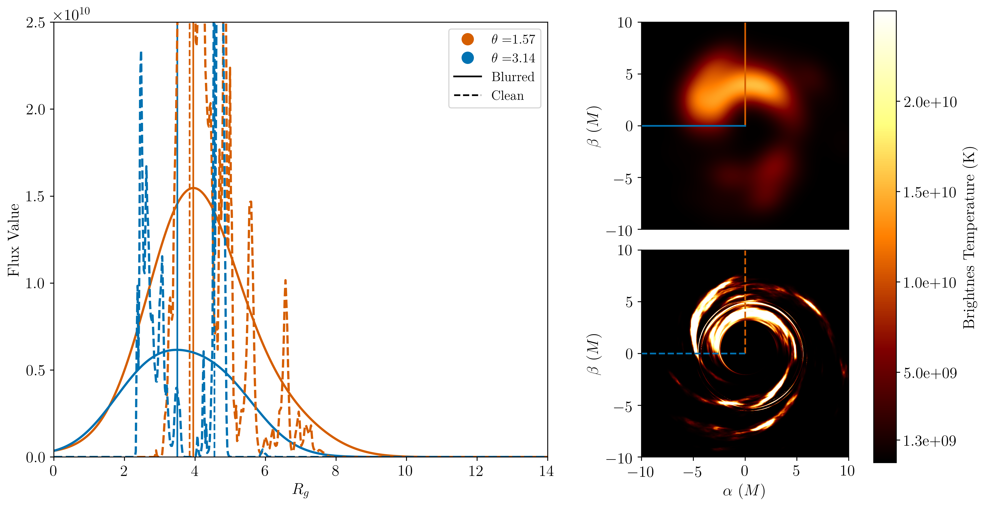

In [60]:
fig, dum = plt.subplots(1, 2, figsize=[15, 7], dpi=400)
dum[1].axis('off')
ax0 = plt.subplot(1, 2, 1)
ax2 = plt.subplot(2, 2, 4)
ax1 = plt.subplot(2, 2, 2)

rmax = blurr_thick_image.shape[0] * .4

# cb_ax = fig.add_axes([0.62, 0.10, 0.2, 0.68])
cb_ax = plt.axes((0.33, 0.1, 0.495, 0.8))
cb_ax.axis("off")
# astroPloting.IntensityVSRadii(fig, ax0, ax1, params.limits, [thin_blurr_image],
#                               [Absorbtion_Image], rmax,blurr_policy=True)
num_of_radial_points=image_tools.num_of_radial_points
x = np.linspace(0, rmax - 1, num_of_radial_points) * params.dx0
ptheta = [np.pi/2, np.pi]
colors = [RingStyle["color"][0],RingStyle["color"][1],RingStyle["color"][2],RingStyle["color"][3]]
parg = []

peakAbsorb, interpAbsorb = image_tools.radii_of_thetaV2_data(blurr_thick_image,params.dx0,rmax=rmax)
for L in range(len(ptheta)):
    
    parg += [image_tools.rad_to_arg(ptheta[L])]
    ax0.plot(x, interpAbsorb[parg[L]], linewidth=2, color=colors[L],
                   label=R"$\theta= $" + f"{ptheta[L]:.2f}")
    ax0.axvline(peakAbsorb[parg[L]],linestyle='-', color=colors[L])

peakAbsorb, interpAbsorb = image_tools.radii_of_thetaV2_data(clean_thick_image,params.dx0,rmax=rmax)
for L in range(len(ptheta)):
    parg += [image_tools.rad_to_arg(ptheta[L])]
    ax0.plot(x, interpAbsorb[parg[L]],'--', linewidth=2, color=colors[L],
                   label=R"$\theta= $" + f"{ptheta[L]:.2f}")
    ax0.axvline(peakAbsorb[parg[L]],linestyle='--', color=colors[L])
    
    
vmax = np.max(blurr_thick_image) *1.6
plotImage(blurr_thick_image,ax1,ptheta,vmax,False,linestyle='-')
plotImage(clean_thick_image,ax2,ptheta,vmax,True,cb_ax,linestyle='--')
#
# ax1.text(2, 1.01, var_label[action["var"]]
#          + str(round(x_variable[i] / scale_label[action["var"]], 2))
#          + ' ' + units_label[action["var"]], fontsize=12, color="k")

# pltname = (fluxVRadii_path + 'IntVRad_' + str(i) + "_Nu_"
#            + str(round(x_variable[L] / scale_label[action["var"]], 2)) + ".jpeg")
# plt.savefig(pltname, bbox_inches='tight')
# print("Image '{}' Created".format(pltname))
plt.subplots_adjust(wspace=-.1,hspace=.1)
ax0.set_xlim(0,14)
ax1.set_xticks([])
ax1.set_xlabel('')
ax0.set_ylim(0,2.5e10)



# ax0.legend()
ax0.set_xlabel(R"$r_g$")
ax0.set_ylabel(R"Flux Value")


Legendlines = [
    Line2D([0],[0],marker='o', markerfacecolor=colors[0], color='white', markersize=12),
    Line2D([0],[0],marker='o', markerfacecolor=colors[1], color='white', markersize=12),
    Line2D([0],[0],linestyle='-', markerfacecolor=RingStyle["color"][0], color='k', markersize=12),
    Line2D([0],[0],linestyle='--', markerfacecolor=RingStyle["color"][1], color='k', markersize=12),
    # Line2D([0],[0],marker='o', markerfacecolor=RingStyle["color"][2], color='w', markersize=12),

    ]
Legendlabels = [
    R"$\theta=$" + f"{ptheta[0]:.2f}",
    R"$\theta=$" + f"{ptheta[1]:.2f}",
    "Blurred",
    "Clean"

          ]
ax0.legend(Legendlines,Legendlabels)
# axes_0[J].xaxis.set_minor_formatter(ticker.FormatStrFormatter('%.1f'))
# axes_0[J].xaxis.set_major_formatter(ticker.FormatStrFormatter("%.1f"))
# plt.savefig(fig_home + "BlurredFluxVRadComp", dpi=600, bbox_inches='tight')

# FluxVNu Plot

In [12]:
flux_peak_style = {
    "color": 'k',
    "linestyle": "-.",
    "linewidth": 3
}


In [13]:
modelExample = "ModelC_1"

In [14]:
blurred_color = 'tab:red'
clean_color= 'tab:blue'

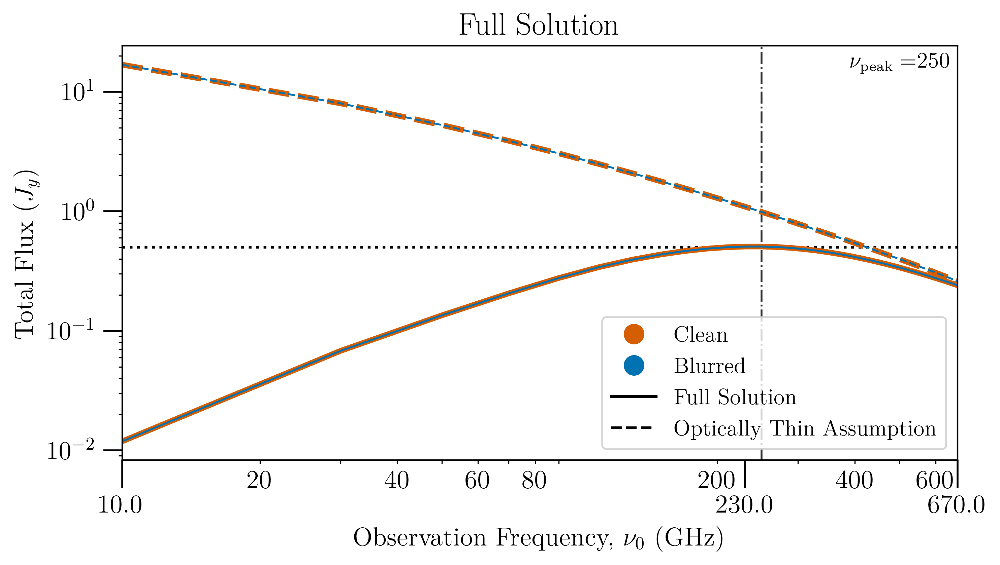

In [97]:
fig, ax1 = plt.subplots(1, 1,figsize=[8,4], dpi=400,sharey=True,sharex=True)
xaxis = bigRun2[modelExample]['np']['xvar']() / 1e9
blurr_thin_flux = bigRun2[modelExample]['np']['jansky_thin'](True,10)
blurr_thick_flux = bigRun2[modelExample]['np']['jansky_thick'](True,10)
clean_thin_flux = bigRun2[modelExample]['np']['jansky_thin']()
clean_thick_flux = bigRun2[modelExample]['np']['jansky_thick']()

ax1.axhline(.5, color='k', label=R'.5 $J_y$', linestyle=":")
# 230
clean_poi = {
    "r_outer": r_outer,
    "flux_peak_thick": bigRun2[modelExample]["flux_peak"](3),
}
# ax1.axvline(poi["conv_1"],
#             color=conv_1_style["color"], linestyle=conv_1_style["linestyle"], linewidth=conv_1_style["linewidth"])
ax1.axvline(clean_poi["flux_peak_thick"]/1e9, color=flux_peak_style["color"],
            linestyle=flux_peak_style["linestyle"], linewidth=1,alpha=.8)

ax1.plot(xaxis, clean_thick_flux[:,3], '-', label='Clean', color=RingStyle['color'][0], linewidth=3)
ax1.plot(xaxis, blurr_thick_flux, '-', label='Blurred', color=RingStyle['color'][1], linewidth=1)

ax1.plot(xaxis, clean_thin_flux[:,3],'--', clean_line,color=RingStyle['color'][0], label='n=0', linewidth=3)
ax1.plot(xaxis, blurr_thin_flux, '--', label='n=0', color=RingStyle['color'][1], linewidth=1)

fluxPeaks = bigRun2[modelExample]["flux_peak"](3) / 1e9
text = R"$\nu_{\rm peak}=$" + str("{:.0f}".format(fluxPeaks))
ax1.text(390, 16, text , fontsize=12, color="k")
    

# Labels
ax1.set_ylabel("Total Flux ({})".format(R'$J_y$'))
ax1.set_xlabel(R"Observation Frequency, $\nu_0$ (GHz)")
ax1.set_xscale('log')
ax1.set_yscale('log')

ax1.xaxis.set_minor_formatter(ticker.FormatStrFormatter('%.0f'))
ax1.xaxis.set_major_formatter(ticker.FormatStrFormatter("%.1f"))
# ax1.yaxis.set_minor_formatter(ticker.FormatStrFormatter('%.4f'))
# ax1.yaxis.set_major_formatter(ticker.FormatStrFormatter("%.0e"))
ax1.title.set_text('Full Solution')

# new_ticks = [xaxis[0], 230, poi["conv_1"], poi["flux_peak_thick"], xaxis[xaxis.size - 1]]
# ax1.set_xticks(new_ticks)

n = 2  # Keeps every 4th label
[l.set_visible(False) for (i, l) in enumerate(ax1.xaxis.get_minorticklabels()) if i % n != 0]
ax1.tick_params('both', length=10, width=1, which='major')
new_ticks = [xaxis[0], 230, xaxis[xaxis.size - 1]]
ax1.set_xticks(new_ticks)
ax1.set_xlim(xaxis[0], xaxis[xaxis.size - 1])
# ax1.set_ylim(10e-6, 10e2)
Legendlines = [
    Line2D([0],[0],marker='o', markerfacecolor=RingStyle['color'][0], color='white', markersize=12),
    Line2D([0],[0],marker='o', markerfacecolor=RingStyle['color'][1], color='white', markersize=12),
    Line2D([0],[0],linestyle='-', markerfacecolor=RingStyle["color"][0], color='k', markersize=12),
    Line2D([0],[0],linestyle='--', markerfacecolor=RingStyle["color"][1], color='k', markersize=12),
    # Line2D([0],[0],marker='o', markerfacecolor=RingStyle["color"][2], color='w', markersize=12),

    ]
Legendlabels = [
    R"Clean",
    R"Blurred",
    "Full Solution",
    "Optically Thin Assumption"

          ]
ax1.legend(Legendlines,Legendlabels)
ax1.tick_params('x', 
      length=xTickParams["length"], 
      width=xTickParams["width"], 
      which=xTickParams["which"], 
      labelrotation=xTickParams["labelrotation"])


plt.savefig(fig_home + "BlurredFluxVNuComp", dpi=600, bbox_inches='tight')

# RadVNU

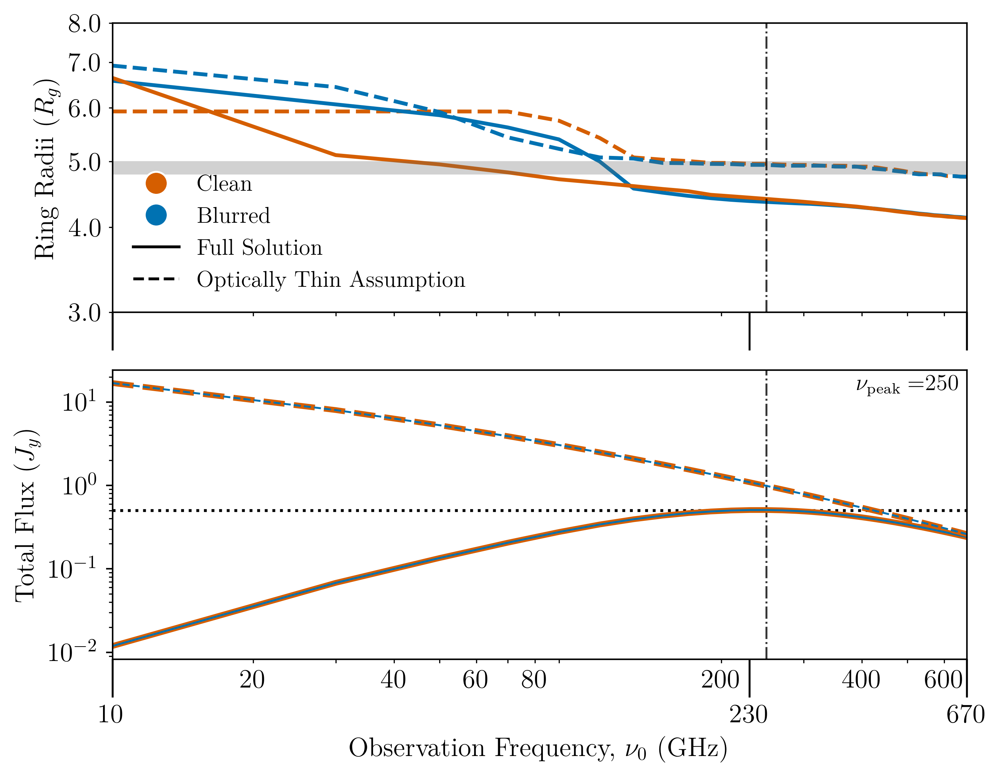

In [126]:
fig, axs = plt.subplots(2, 1, figsize=[8, 6], dpi=400,sharex=True)
blurred_radii_thin = bigRun2[modelExample]['np']['radVnu_thin'](True,10)[:,0]
blurred_radii_thick = bigRun2[modelExample]['np']['radVnu_thick'](True,10)[:,0]
clean_radii_thick = bigRun2[modelExample]['np']['radVnu_thick']()[:,0]
clean_radii_thin = bigRun2[modelExample]['np']['radVnu_thin']()[:,0]


ax =axs[0]
ax.plot(xaxis, clean_radii_thick, clean_line, '-', label='Clean', color=RingStyle['color'][0], linewidth=2)
ax.plot(xaxis, blurred_radii_thick, '-', label='Blurred', color=RingStyle['color'][1], linewidth=2)



ax.plot(xaxis, clean_radii_thin,'--', clean_line,color=RingStyle['color'][1], label='n=0', linewidth=2)
ax.plot(xaxis, blurred_radii_thin, blurred_line, '--', label='n=0', color=RingStyle['color'][0], linewidth=2)

ax.axhline(r_outer,
           color=r_outer_style["color"],
           linestyle=r_outer_style["linestyle"], 
           linewidth=r_outer_style["linewidth"],
           alpha=0.3
          )

ax.axvline(clean_poi["flux_peak_thick"]/1e9, color=flux_peak_style["color"],
            linestyle=flux_peak_style["linestyle"], linewidth=1,alpha=.8)

ax.set_xscale('log')
ax.set_yscale('log')

ax.set_ylabel("Ring Radii ({})".format(R'$r_g$'))

ax.xaxis.set_minor_formatter(ticker.FormatStrFormatter('%.0f'))
ax.xaxis.set_major_formatter(ticker.FormatStrFormatter("%.0f"))
ax.yaxis.set_minor_formatter(ticker.FormatStrFormatter('%.1f'))
ax.yaxis.set_major_formatter(ticker.FormatStrFormatter("%.1f"))


# ax.legend(frameon=False)
ax.set_xlim(xaxis[0], xaxis[xaxis.size - 1])
# ax.set_ylim(xaxis[0], xaxis[xaxis.size - 1])
ax.set_ylim(3,8)

new_ticks = [xaxis[0], 230, xaxis[xaxis.size - 1]]
ax.set_xticks(new_ticks)
ax.tick_params('x', length=20, width=1, which='major', labelrotation=0)

new_ticks = [xaxis[0], 230, xaxis[xaxis.size - 1]]
ax.set_xticks(new_ticks)

fluxPeaks = bigRun2[modelExample]["flux_peak"](3) / 1e9
# text = R"$\nu_{\rm peak}=$" + str("{:.0f}".format(fluxPeaks))
# ax.text(11, 7.3, text , fontsize=12, color="k")




blurr_thin_flux = bigRun2[modelExample]['np']['jansky_thin'](True,10)
blurr_thick_flux = bigRun2[modelExample]['np']['jansky_thick'](True,10)
clean_thin_flux = bigRun2[modelExample]['np']['jansky_thin']()
clean_thick_flux = bigRun2[modelExample]['np']['jansky_thick']()

ax1 = axs[1]
ax1.axhline(.5, color='k', label=R'.5 $J_y$', linestyle=":")
# 230
clean_poi = {
    "r_outer": r_outer,
    "flux_peak_thick": bigRun2[modelExample]["flux_peak"](3),
}
# ax1.axvline(poi["conv_1"],
#             color=conv_1_style["color"], linestyle=conv_1_style["linestyle"], linewidth=conv_1_style["linewidth"])
ax1.axvline(clean_poi["flux_peak_thick"]/1e9, color=flux_peak_style["color"],
            linestyle=flux_peak_style["linestyle"], linewidth=1,alpha=.8)

ax1.plot(xaxis, clean_thick_flux[:,3], '-', label='Clean', color=RingStyle['color'][0], linewidth=3)
ax1.plot(xaxis, blurr_thick_flux, '-', label='Blurred', color=RingStyle['color'][1], linewidth=1)

ax1.plot(xaxis, clean_thin_flux[:,3],'--', clean_line,color=RingStyle['color'][0], label='n=0', linewidth=3)
ax1.plot(xaxis, blurr_thin_flux, '--', label='n=0', color=RingStyle['color'][1], linewidth=1)

fluxPeaks = bigRun2[modelExample]["flux_peak"](3) / 1e9
text = R"$\nu_{\rm peak}=$" + str("{:.0f}".format(fluxPeaks))
ax1.text(390, 14, text , fontsize=12, color="k")
    

# Labels
ax1.set_ylabel("Total Flux ({})".format(R'$J_y$'))
ax1.set_xlabel(R"Observation Frequency, $\nu_0$ (GHz)")
ax1.set_xscale('log')
ax1.set_yscale('log')

ax1.xaxis.set_minor_formatter(ticker.FormatStrFormatter('%.0f'))
ax1.xaxis.set_major_formatter(ticker.FormatStrFormatter("%.0f"))
# ax1.yaxis.set_minor_formatter(ticker.FormatStrFormatter('%.4f'))
# ax1.yaxis.set_major_formatter(ticker.FormatStrFormatter("%.0e"))



n = 2  # Keeps every 4th label
[l.set_visible(False) for (i, l) in enumerate(ax1.xaxis.get_minorticklabels()) if i % n != 0]



# ax.set_xlabel(R"Observation Frequency, $\nu_0$ (GHz)")
# ax1.tick_params('x', length=20, width=1, which='major', labelrotation=0)
# ax1.title.set_text('Full Solution')




Legendlines = [
    Line2D([0],[0],marker='o', markerfacecolor=RingStyle['color'][0], color='white', markersize=12),
    Line2D([0],[0],marker='o', markerfacecolor=RingStyle['color'][1], color='white', markersize=12),
    Line2D([0],[0],linestyle='-', markerfacecolor=RingStyle["color"][0], color='k', markersize=12),
    Line2D([0],[0],linestyle='--', markerfacecolor=RingStyle["color"][1], color='k', markersize=12),
    # Line2D([0],[0],marker='o', markerfacecolor=RingStyle["color"][2], color='w', markersize=12),

    ]
Legendlabels = [
    R"Clean",
    R"Blurred",
    "Full Solution",
    "Optically Thin Assumption"

          ]
ax.legend(Legendlines,Legendlabels,frameon=False)
ax1.tick_params('x', length=20, width=1, which='major')
new_ticks = [xaxis[0], 230, xaxis[xaxis.size - 1]]
ax1.set_xticks(new_ticks)


plt.savefig(fig_home + "BlurredComp", dpi=600, bbox_inches='tight')

In [94]:
astroModels.var_label["nu0"].replace('=', '')

'$\\nu $'

# AART Compare

In [60]:
run2 = runDataClass.PRUN

bigRun2 = classRunComputing.BigRuns(
    run2.getRunName(),
    run2.getBrightparams(),
    run2.getBPVarNames(),
    run2.getGeoGrid(),
    run2.getGeoGridNames(),
    normalized_brightparams=run2.getIsNormalized(),
)

# ModelA32 = runDataClass.SingleModelData(bigRun2.getSubPaths(),run2.getRunName(),"ModelA_32")

Subdirectory for storing all run results '/scratch/gpfs/td6241/aart/bigRuns/' already exist, doing nothing
Subdirectory for storing this run result '/scratch/gpfs/td6241/aart/bigRuns/PRUN/' already exist, doing nothing
Subdirectory for images '/scratch/gpfs/td6241/aart/bigRuns/PRUN/Images/' already exist, doing nothing
Subdirectory for data '/scratch/gpfs/td6241/aart/bigRuns/PRUN/Data/' already exist, doing nothing
Subdirectory for inter model data '/scratch/gpfs/td6241/aart/bigRuns/PRUN/InterModel/' already exist, doing nothing
Subdirectory for  '/scratch/gpfs/td6241/aart/bigRuns/PRUN/Data/geo/' already exist, doing nothing
Subdirectory for  '/scratch/gpfs/td6241/aart/bigRuns/PRUN/Data/intensity/' already exist, doing nothing
Subdirectory for  '/scratch/gpfs/td6241/aart/bigRuns/PRUN/Data/numpy/' already exist, doing nothing
Subdirectory for  '/scratch/gpfs/td6241/aart/bigRuns/PRUN/Images/fluxVNu/' already exist, doing nothing
Subdirectory for  '/scratch/gpfs/td6241/aart/bigRuns/PRUN/I

In [61]:
# current_geo_model = fileloading.totalModelNametoGridModel(modelExample,bigRun2.run_type)
bfileloading.loadGeoModel("ModelOG", run2.getRunName())()
importlib.reload(params)


Loading ModelOG

file /scratch/gpfs/td6241/aart/bigRuns/PRUN/geoModels/ModelOG.py Loaded as /home/td6241/repo/aart/params.py
Remember to call 'importlib.reload(params)' to reload parameters


<module 'params' from '/home/td6241/repo/aart/params.py'>

In [62]:
%time !python3 lensingbands.py

Welcome to eht-imaging! v 1.2.7 

/home/td6241/anaconda3/envs/mural/lib/python3.12/site-packages/kgeo-0.0.1-py3.12.egg/kgeo/bfields.py:158: SyntaxWarning: invalid escape sequence '\m'
/home/td6241/anaconda3/envs/mural/lib/python3.12/site-packages/kgeo-0.0.1-py3.12.egg/kgeo/bfields.py:183: SyntaxWarning: invalid escape sequence '\m'
/home/td6241/anaconda3/envs/mural/lib/python3.12/site-packages/kgeo-0.0.1-py3.12.egg/kgeo/bfields.py:158: SyntaxWarning: invalid escape sequence '\m'
/home/td6241/anaconda3/envs/mural/lib/python3.12/site-packages/kgeo-0.0.1-py3.12.egg/kgeo/bfields.py:183: SyntaxWarning: invalid escape sequence '\m'
Computing the lensing bands
Number of points in the n=0 grid  6250000
Number of points in the n=1 grid  6250000
Number of points in the n=2 grid  6250000
File  /scratch/gpfs/td6241/aart/rawResults/LensingBands_a_0.94_i_17.h5  created.
CPU times: user 502 ms, sys: 73.9 ms, total: 576 ms
Wall time: 1min


In [63]:
# fnbands="./Results/LensingBands_a_%s_i_%s.h5"%(spin_case,i_case)
fnbands= path + "LensingBands_a_%s_i_%s.h5"%(spin_case,i_case)

print("Reading file: ",fnbands)

h5f = h5py.File(fnbands,'r')

#Points for the boundary of the BH shadow
alpha_critc=h5f['alpha'][:]
beta_critc=h5f['beta'][:]

#The concave hulls for the lensing bands
hull_0i=h5f['hull_0i'][:]
hull_0e=h5f['hull_0e'][:]
hull_1i=h5f['hull_1i'][:]
hull_1e=h5f['hull_1e'][:]
hull_2i=h5f['hull_2i'][:]
hull_2e=h5f['hull_2e'][:]

#The grid points for each lensing band
supergrid0=h5f['grid0'][:]
N0=int(h5f["N0"][0])
mask0=h5f['mask0'][:]
lim0=int(h5f["lim0"][0])
supergrid1=h5f['grid1'][:]
N1=int(h5f["N1"][0])
mask1=h5f['mask1'][:]
lim1=int(h5f["lim1"][0])
supergrid2=h5f['grid2'][:]
N2=int(h5f["N2"][0])
mask2=h5f['mask2'][:]
lim2=int(h5f["lim2"][0])

h5f.close()

Reading file:  /scratch/gpfs/td6241/aart/rawResults/LensingBands_a_0.94_i_17.h5


In [64]:
%time !python3 raytracing.py


Welcome to eht-imaging! v 1.2.7 

/home/td6241/anaconda3/envs/mural/lib/python3.12/site-packages/kgeo-0.0.1-py3.12.egg/kgeo/bfields.py:158: SyntaxWarning: invalid escape sequence '\m'
/home/td6241/anaconda3/envs/mural/lib/python3.12/site-packages/kgeo-0.0.1-py3.12.egg/kgeo/bfields.py:183: SyntaxWarning: invalid escape sequence '\m'
/home/td6241/anaconda3/envs/mural/lib/python3.12/site-packages/kgeo-0.0.1-py3.12.egg/kgeo/bfields.py:158: SyntaxWarning: invalid escape sequence '\m'
/home/td6241/anaconda3/envs/mural/lib/python3.12/site-packages/kgeo-0.0.1-py3.12.egg/kgeo/bfields.py:183: SyntaxWarning: invalid escape sequence '\m'
Ray-tracing
Reading file:  /scratch/gpfs/td6241/aart/rawResults/LensingBands_a_0.94_i_17.h5
Analytical ray-tracing of the n=0 band points
Analytical ray-tracing of the n=1 band points
Analytical ray-tracing of the n=2 band points
File  /scratch/gpfs/td6241/aart/rawResults/Rays_a_0.94_i_17.h5  created.

A total of 18750000 photons were ray-traced
CPU times: user 3.

In [65]:
# fnrays="./Results/Rays_a_%s_i_%s.h5"%(spin_case,i_case)
fnrays= path + "Rays_a_%s_i_%s.h5"%(spin_case,i_case)

print("Reading file: ",fnrays)

h5f = h5py.File(fnrays,'r')

rs0=h5f['rs0'][:]
sign0=h5f['sign0'][:]
t0=h5f['t0'][:]
phi0=h5f['phi0'][:]

rs1=h5f['rs1'][:]
sign1=h5f['sign1'][:]
t1=h5f['t1'][:]
phi1=h5f['phi1'][:]

rs2=h5f['rs2'][:]
sign2=h5f['sign2'][:]
t2=h5f['t2'][:]
phi2=h5f['phi2'][:]


h5f.close()

Reading file:  /scratch/gpfs/td6241/aart/rawResults/Rays_a_0.94_i_17.h5


In [66]:
%time !python3 magneticangle.py

Welcome to eht-imaging! v 1.2.7 

/home/td6241/anaconda3/envs/mural/lib/python3.12/site-packages/kgeo-0.0.1-py3.12.egg/kgeo/bfields.py:158: SyntaxWarning: invalid escape sequence '\m'
/home/td6241/anaconda3/envs/mural/lib/python3.12/site-packages/kgeo-0.0.1-py3.12.egg/kgeo/bfields.py:183: SyntaxWarning: invalid escape sequence '\m'
/home/td6241/anaconda3/envs/mural/lib/python3.12/site-packages/kgeo-0.0.1-py3.12.egg/kgeo/bfields.py:158: SyntaxWarning: invalid escape sequence '\m'
/home/td6241/anaconda3/envs/mural/lib/python3.12/site-packages/kgeo-0.0.1-py3.12.egg/kgeo/bfields.py:183: SyntaxWarning: invalid escape sequence '\m'
Magnetic Angle
using default lband
Reading file:  /scratch/gpfs/td6241/aart/rawResults/LensingBands_a_0.94_i_17.h5
using default rtray
Reading file:  /scratch/gpfs/td6241/aart/rawResults/Rays_a_0.94_i_17.h5
File  /scratch/gpfs/td6241/aart/rawResults/MagneticAngle_a_0.94_i_17.h5  created.
CPU times: user 39.7 ms, sys: 16.9 ms, total: 56.6 ms
Wall time: 4.66 s


In [67]:
fn=path + "MagneticAngle_a_%s_i_%s.h5"%(spin_case,i_case)
print("Reading file: ",fn)

h5f = h5py.File(fn,'r')

#Points for the boundary of the BH shadow
anglen0=h5f['cos2angB_n0'][:]
anglen1=h5f['cos2angB_n1'][:]
anglen2=h5f['cos2angB_n2'][:]

h5f.close()


Reading file:  /scratch/gpfs/td6241/aart/rawResults/MagneticAngle_a_0.94_i_17.h5


In [68]:
brightparams = {
    "nu0": 230e9,  # 0 nu0
    "mass": (MMkg * u.kg).to(u.g).value,  # 1 mass
    "scale_height": .5,  # 2 scale_height
    "theta_b": 50.0 * (np.pi / 180),  # 3 theta_b
    "beta": 1.0,  # 4 beta
    "r_ie": 10.0,  # 5 rie
    "rb_0": 2,  # 7 rb_0
    "n_th0": 1.9e4,  # ,4e5 # 8 n_th0
    "t_e0": 2e11,  # 9 t_e0 1e12
    "b_0": 8.131273135591028,
    "p_dens": -.7,  # 10 p_dens
    "p_temp": -.84,  # 11 p_temp
    "p_mag": -.3,  # 11 p_temp
    "nscale": .4  # Scale of Inoisy
}

funckeys = {
		"emodelkey" : 0, # emodelkey Emission Model choice, 0 = thermal ultrarelativistic, 1 = power law
        "bkey" : 2, # bkey
        "nnoisykey" : 0, # nnoisykey Inoisy density. 0 = no noise, 1 = noise
        "tnoisykey" : 0, # tnoisykey Inoisy temperature
        "bnoisykey" : 0, # bnoisykey Inoisy magnetic field
        "theta_bkey": 0
}

# brightparams = fpp.bp_steeperT
# funckeys = fpp.fk_fiducial


# for i in range(len(brightparams)):
#     args = args + cmd1_args[i] + str(brightparams[i]) + ' '
# aartpath = '/home/tej/Desktop/Code_Stuff/Repositories/aart'

cmd= fileloading.createIntensityArgs(brightparams,funckeys=funckeys)

In [69]:
subprocess.run([cmd], shell=True)

/home/td6241/anaconda3/envs/mural/lib/python3.12/site-packages/kgeo-0.0.1-py3.12.egg/kgeo/bfields.py:158: SyntaxWarning: invalid escape sequence '\m'
/home/td6241/anaconda3/envs/mural/lib/python3.12/site-packages/kgeo-0.0.1-py3.12.egg/kgeo/bfields.py:183: SyntaxWarning: invalid escape sequence '\m'
/home/td6241/anaconda3/envs/mural/lib/python3.12/site-packages/kgeo-0.0.1-py3.12.egg/kgeo/bfields.py:158: SyntaxWarning: invalid escape sequence '\m'
/home/td6241/anaconda3/envs/mural/lib/python3.12/site-packages/kgeo-0.0.1-py3.12.egg/kgeo/bfields.py:183: SyntaxWarning: invalid escape sequence '\m'


Welcome to eht-imaging! v 1.2.7 

using default rtray
Reading file:  /scratch/gpfs/td6241/aart/rawResults/Rays_a_0.94_i_17.h5
using default magAng
Intensity
using default lband
Reading file:  /scratch/gpfs/td6241/aart/rawResults/LensingBands_a_0.94_i_17.h5
Reading file:  /scratch/gpfs/td6241/aart/rawResults/Rays_a_0.94_i_17.h5
File  /scratch/gpfs/td6241/aart/rawResults/Intensity_a_0.94_i_17_nu_2.30000e+11_mass_1.32497e+43_scaleh_0.5_thetab_0.873_beta_1.00_rie_10.0_rb_2.0_nth0_1.9e+04_te0_2.0e+11_b0_8.131e+00_pdens_-0.7_ptemp_-0.84_pmag_-0.3_nscale_0.4_emkey_0_bkey_2_nkey_0_tnkey_0_bnkey_0_magkey_0.h5  created.


CompletedProcess(args=['python3 /home/td6241/repo/aart/radialintensity.py --nu 230000000000.0 --mass 1.3249659172847406e+43 --scaleh 0.5 --thetab 0.8726646259971648 --beta 1.0 --rie 10.0 --rb0 2 --nth0 19000.0 --te0 200000000000.0 --b0 8.131273135591028 --pdens -0.7 --ptemp -0.84 --pmag -0.3 --nscale 0.4 --emodelkey 0 --bkey 2 --nnoisykey 0 --tnoisykey 0 --bnoisykey 0 --thetabkey 0 --lband 0 --rtray 0 --magang 0'], returncode=0)

In [71]:

fnrays = fileloading.intensityNameNoUnits(brightparams,funckeys)
    
print("Reading file: ",fnrays)

h5f = h5py.File(fnrays,'r')

thin_image = h5f['bghts2_absorbtion'][:] + h5f['bghts1_absorbtion'][:] + h5f['bghts0_absorbtion'][:]
Absorbtion_Image =h5f['bghts_full_absorbtion'][:]
h5f.close()


Reading file:  /scratch/gpfs/td6241/aart/rawResults/Intensity_a_0.94_i_17_nu_2.30000e+11_mass_1.32497e+43_scaleh_0.5_thetab_0.873_beta_1.00_rie_10.0_rb_2.0_nth0_1.9e+04_te0_2.0e+11_b0_8.131e+00_pdens_-0.7_ptemp_-0.84_pmag_-0.3_nscale_0.4_emkey_0_bkey_2_nkey_0_tnkey_0_bnkey_0_magkey_0.h5


In [56]:
fnrays="/home/td6241/repo/aartOG/aart/Results/Intensity_a_%s_i_%s.h5"%(spin_case,i_case)

print("Reading file: ",fnrays)

h5f = h5py.File(fnrays,'r')

OGImage = h5f['bghts0'][:] + h5f['bghts1'][:] + h5f['bghts2'][:]

h5f.close()

Reading file:  /home/td6241/repo/aartOG/aart/Results/Intensity_a_0.94_i_17.h5


In [78]:
lim0

25

In [98]:
np.max(OGImage)

0.23754217663678082

In [96]:
np.max(ilp.specific_intensity(Absorbtion_Image,230e9).value)

0.0004882586178068724

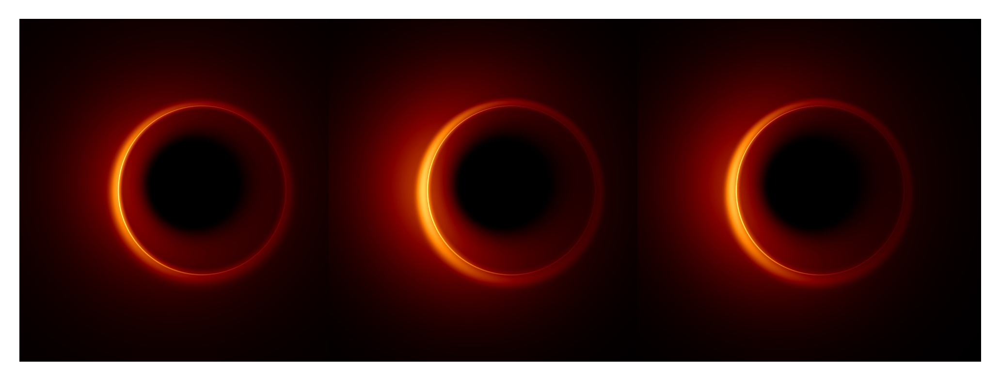

In [99]:
fig, ax = plt.subplots(1,3,dpi=400,sharex=True,sharey=True)
ax[0].imshow(OGImage,vmax=np.max(OGImage)*1.2,origin="lower",cmap="afmhot",extent=[-lim0,lim0,-lim0,lim0])
ax[0].axis('off')
ax[0].set_xlim(-10,10) # units of M
ax[0].set_ylim(-10,10) 
    

ax[1].imshow(Absorbtion_Image,vmax=np.max(Absorbtion_Image)*1.2,origin="lower",cmap="afmhot",extent=[-lim0,lim0,-lim0,lim0])
ax[1].axis('off')
ax[1].set_xlim(-10,10) # units of M
ax[1].set_ylim(-10,10) 
    
    
ax[2].imshow(thin_image,vmax=np.max(thin_image)*1.2,origin="lower",cmap="afmhot",extent=[-lim0,lim0,-lim0,lim0])
ax[2].axis('off')
ax[2].set_xlim(-10,10) # units of M
ax[2].set_ylim(-10,10) 
plt.subplots_adjust(wspace=-.1, hspace=0)
plt.savefig(fig_home + "BlurredRadVNuComp", dpi=600, bbox_inches='tight')

# Te_0 plots

In [125]:
modelExample = "ModelC_221"
current_geo_model = fileloading.totalModelNametoGridModel(modelExample,bigRun2.run_type)
bfileloading.loadGeoModel(current_geo_model, run2.getRunName())()
importlib.reload(params)


Loading ModelC

file /scratch/gpfs/td6241/aart/bigRuns/OctRun/geoModels/ModelC.py Loaded as /home/td6241/repo/aart/params.py
Remember to call 'importlib.reload(params)' to reload parameters


<module 'params' from '/home/td6241/repo/aart/params.py'>

In [126]:
a = params.spin_case

inc = params.i_case * np.pi / 180  # inclination angle
rh = 1 + np.sqrt(1 - a ** 2)  # event horizon
# angles to sample
varphis = np.linspace(-180, 179, 360) * np.pi / 180

# generate inner shadow (n=0) curve with kgeo
data_inner = kgeo.equatorial_lensing.rho_of_req(a, inc, rh, mbar=0, varphis=varphis)
(_, rhos_inner, alphas_inner, betas_inner) = data_inner

r_inner = image_tools.curve_params(varphis, rhos_inner)

# generate outer shadow (n=inf) curve with kgeo
data_outer = kgeo.equatorial_lensing.rho_of_req(a, inc, rh, mbar=5, varphis=varphis)
(_, rhos_outer, alphas_outer, betas_outer) = data_outer

r_outer = image_tools.curve_params(varphis, rhos_outer)

In [127]:
def radiiVersusFreq(ax,xaxis,mean_radii,conv_1=None,flux_peak=None,r_outer=None):
    
    if conv_1 is not None:
        ax.axvline(conv_1,
                   color=conv_1_style["color"], 
                   linestyle=conv_1_style["linestyle"], 
                   linewidth=conv_1_style["linewidth"]
                  )
    
    
    if r_outer is not None:
        ax.axhline(r_outer,
                   color=r_outer_style["color"],
                   linestyle=r_outer_style["linestyle"], 
                   linewidth=r_outer_style["linewidth"],
                   alpha=0.3
                  )


    amount_to_plot = 4

    for i in reversed(range(amount_to_plot)):
        ax.plot(xaxis, mean_radii[:, i],
                 "-", 
                 label=RingStyle["label"][i],
                 color=RingStyle["color"][i], 
                 linewidth=RingStyle["linewidth"][i])


    # Labels
    # ax.set_xlabel(astroModels.var_label["nu0"].replace('=', '')
    #                + ' (' + astroModels.units_label["nu0"] + ')')
    ax.set_xscale('log')
    ax.set_yscale('log')

    ax.xaxis.set_minor_formatter(ticker.FormatStrFormatter('%.0f'))
    ax.xaxis.set_major_formatter(ticker.FormatStrFormatter("%.0f"))
    ax.yaxis.set_minor_formatter(ticker.FormatStrFormatter('%.1f'))
    ax.yaxis.set_major_formatter(ticker.FormatStrFormatter("%.1f"))

    new_ticks = [xaxis[0], 230, xaxis[xaxis.size - 1]]
    ax.set_xticks(new_ticks)

    # new_ticks = np.append(ax1.get_yticks(), r_outer)
    # new_ticks = np.append(new_ticks, r_inner)
    # print(new_ticks)
    # ax1.set_yticks(new_ticks)
    n = 4  # Keeps every 4th label
    [l.set_visible(False) for (i, l) in enumerate(ax.xaxis.get_minorticklabels()) if i % n != 0]
    ax.set_xlim(xaxis[0], xaxis[xaxis.size - 1])

#     ax.set_ylim(0, 6)
    
    ax.tick_params('x', which="both", labelbottom=False)
    # ax.tick_params('y', which="both", labelleft=False)



    # ax.tick_params('x', length=20, width=1, which='major', labelrotation=80)

In [128]:
flux_peak_style["linewidth"]

2

In [129]:
def createFluxRadiiGraph(ax,xaxis,janksys_thin,janksys_thick,fiducial_thin=None,fiducial_thick=None,flux_peak=None):

    # ax.plot(xaxis, janksys_thin[:, 0], '-', label='n=0', color='tab:red', linewidth=3)
    janksky_line_style ={
        "label": ['n=0','n=1','n=2','total'],
        "color": [n0_color,n1_color,n2_color,cumu_color],
        "linewidth": [3,3,3,4]
    }

    amount_to_plot = 4
    

    if fiducial_thin is not None:
        for i in (range(amount_to_plot)):
            ax.plot(xaxis, 
                    fiducial_thin[:, i], 
                    line_styles["thin"],
                    label=RingStyle["label"][i], 
                    color=RingStyle["color"][i],
                    linewidth=RingStyle["linewidth"][i],
                    alpha=0.3)

            ax.plot(xaxis, fiducial_thick[:, i], 
                    line_styles["thick"],
                    label=RingStyle["label"][i], 
                    color=RingStyle["color"][i],
                    linewidth=RingStyle["linewidth"][i],
                    alpha=0.3)
            
    for i in (range(amount_to_plot)):
        # ax.plot(xaxis, 
        #         janksys_thin[:, i], 
        #         line_styles["thin"],
        #         label=RingStyle["label"][i], 
        #         color=RingStyle["color"][i],
        #         linewidth=RingStyle["linewidth"][i])

        ax.plot(xaxis, 
                janksys_thick[:, i], 
                line_styles["thick"],
                label=RingStyle["label"][i], 
                color=RingStyle["color"][i],
                linewidth=RingStyle["linewidth"][i])
        

    if flux_peak is not None:
        ax.axvline(flux_peak, color=flux_peak_style["color"], 
                   linestyle=flux_peak_style["linestyle"], 
                   linewidth=1
                  )
    # ax.axvline(poi["flux_peak_thin"], color=flux_peak_style["color"],
    #            linestyle=flux_peak_style["linestyle"], linewidth=flux_peak_style["linewidth"])

    # Labels

    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.xaxis.set_minor_formatter(ticker.FormatStrFormatter('%.0f'))
    ax.xaxis.set_major_formatter(ticker.FormatStrFormatter("%.0f"))
    # ax.yaxis.set_minor_formatter(ticker.FormatStrFormatter('%.1f'))
    # ax.yaxis.set_major_formatter(ticker.FormatStrFormatter("%.1f"))
    # ax1.yaxis.set_minor_formatter(ticker.FormatStrFormatter('%.4f'))
    # ax.yaxis.set_major_formatter(ticker.FormatStrFormatter("%.0e"))

    ax.tick_params('x', which="both", labelbottom=False)
    ax.tick_params('y', which="both", labelleft=False)

    n = 4  # Keeps every 4th label
    [l.set_visible(False) for (i, l) in enumerate(ax.xaxis.get_minorticklabels()) if i % n != 0]
    ax.tick_params('both', length=10, width=1, which='major')
    ax.set_xlim(xaxis[0], xaxis[xaxis.size - 1])
    ax.set_ylim(10e-5, 1)
    # ax.legend(loc='upper right')

    new_ticks = [xaxis[0], 230, xaxis[xaxis.size - 1]]
    ax.set_xticks(new_ticks)
    


    # ax.legend(Legendlines,Legendlabels)
    # ax.tick_params('x', length=10, width=1, which='major', labelrotation=90)


In [134]:
bigRun2

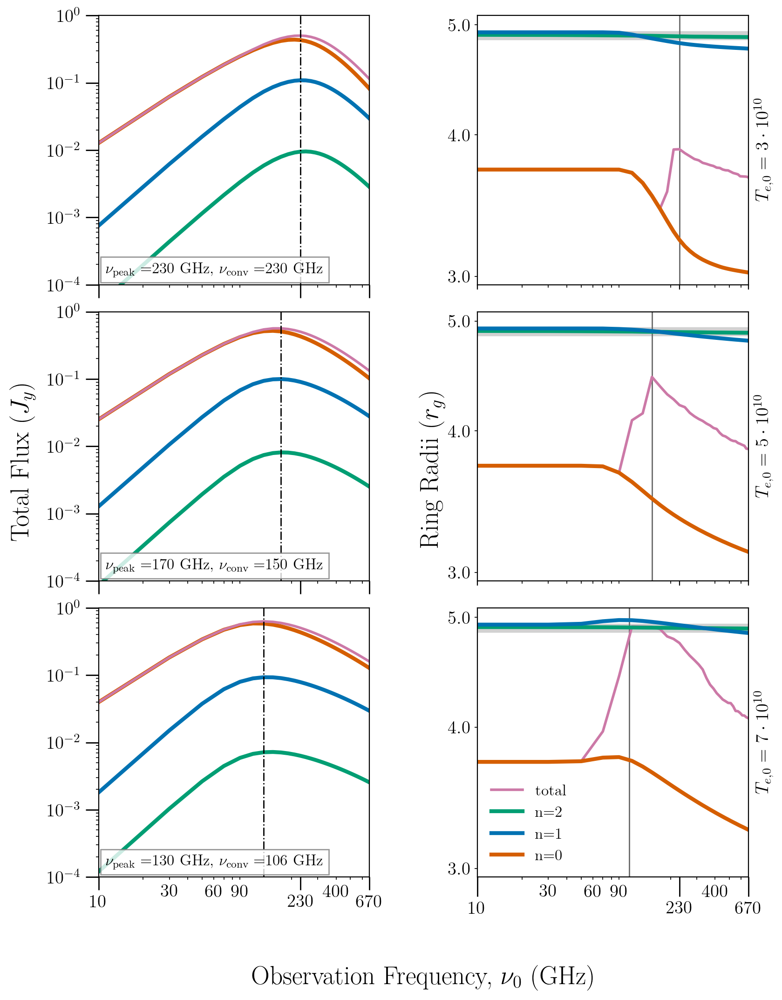

In [227]:
fig, axs = plt.subplots(3,2,dpi=200,figsize=[9,12],sharex=True,sharey='col')


spin = 2
atmodel = 1
abmodel = 1
# temodel = 0

meth = 3
for i in range(3):
    currentModel = bigRun2[spin,atmodel,abmodel,i]
    ax = axs[:,0]
    createFluxRadiiGraph(ax[i],currentModel['np']['xvar']()/1e9,currentModel['np']['jansky_thin'](),currentModel['np']['jansky_thick'](),flux_peak=currentModel['flux_peak'](3)/1e9)
    text = R"$\nu_{\rm peak}=$" + str("{:.0f}".format(currentModel['flux_peak'](3)/1e9)) + ' ' + astroModels.units_label["nu0"]  + R", $\nu_{\rm conv}=$" + str("{:.0f}".format(currentModel['conv'](meth)/1e9)) + ' ' + astroModels.units_label["nu0"]
    t = ax[i].text(11.2, .00015, text , fontsize=12, color="k")
    # t = ax[i,j].text(12, 25, text , fontsize=12, color="k")
    t.set_bbox(dict(facecolor='white', alpha=0.8, edgecolor='grey'))
    ax[i].tick_params('y', which="both", labelleft=True)
    ax[i].set_rasterization_zorder(0)
    # if (j == 0):
    #     ax[j,i].title.set_text(R'$b_0=$ ' + "{:.1f}".format(currentModel['bp']["b_0"]))

#     if (i == 1):
    # ax[i].set_ylabel(R'$t_{e,0}=$ ' + "{:.1e}".format(currentModel['bp']["t_e0"]))
    # ax[i].yaxis.set_label_position('right')
ax[2].tick_params('x', which="both", labelbottom=True)
n = 3
[l.set_visible(False) for (i, l) in enumerate(ax[2].xaxis.get_minorticklabels()) if i % n != 0]


text = "Total Flux ({})".format(R'$J_y$')
t = ax[1].text(2.5, .0005, text , fontsize=20, color="k",rotation=90)
# t = ax[i,j].text(12, 25, text , fontsize=12, color="k")
# t.set_bbox(dict(facecolor='white', alpha=0.8, edgecolor='grey'))

# RADII________________________________________________________________________



# fig.tight_layout(pad=.5)

temodel = 0

k = 1
ax = []
ax = axs[:,1]
for i in range(3):
    current_model = bigRun2[spin,atmodel,abmodel,i]

    radiiVersusFreq(ax[i],
                    current_model['np']['xvar']() / 1e9,
                    current_model['np']['radVnu_thick'](),
                    current_model['conv'](meth)/1e9,
                    current_model['flux_peak'](3)/1e9,
                    r_outer
                   )

    text = R"$\nu_{\rm peak}=$" + str("{:.0f}".format(current_model['flux_peak'](3)/1e9)) + ' ' + astroModels.units_label["nu0"] + R" $\nu_{\rm conv}=$" + str("{:.0f}".format(current_model['conv'](meth)/1e9)) + ' ' + astroModels.units_label["nu0"]
    props = dict(boxstyle='round', facecolor='white', alpha=0.5)

    if k == 3:
        ax[i].legend(frameon=False)

    # t = ax[i].text(12, 4.5, text , fontsize=12, color="k")
    # t.set_bbox(dict(facecolor='grey', alpha=0.2, edgecolor='black'))

    ax[i].set_ylabel(R'$T_{e,0}=$ ' + sciNotation(current_model['bp']["t_e0"]))
    ax[i].yaxis.set_label_position('right')
    ax[i].set_rasterization_zorder(0)

    k += 1

# ax[4].set_xlabel()

ax[2].tick_params('x', which="both", labelbottom=True)
n = 3  # Keeps every 4th label
[l.set_visible(False) for (i, l) in enumerate(ax[2].xaxis.get_minorticklabels()) if i % n != 0]
ax[2].tick_params('x', 
      length=xTickParams["length"], 
      width=xTickParams["width"], 
      which=xTickParams["which"], 
      labelrotation=xTickParams["labelrotation"])

text = "Ring Radii ({})".format(R'$r_g$')
t = ax[1].text(4, 3.2, text , fontsize=20, color="k",rotation=90)
plt.subplots_adjust(wspace=.4,hspace=.1)

text = R"Observation Frequency, $\nu_0$ (GHz)"
t = ax[1].text(.3, 1.3, text , fontsize=20, color="k")


plt.savefig(fig_home + "TEOFluxRadVNU", dpi=200, bbox_inches='tight')

# Python

In [217]:
bigRun2[0,i,2]['bp']

{'p_dens': -0.7,
 'n_th0': 57424.575568468914,
 't_e0': 30000000000.0,
 'b_0': 8,
 'theta_b': 0.8726646259971648,
 'mass': 1.3249659172847406e+43,
 'nu0': 670000000000.0,
 'scale_height': 0.5,
 'rb_0': 5,
 'beta': 1.0,
 'r_ie': 10.0,
 'nscale': 0.4,
 'p_temp': -1.5,
 'p_mag': -1}

In [207]:
"{:.0f}".format(float("{:.3e}".format(bigRun2[0,i,j]['bp']['n_th0'])[7:9]))

'5'

In [229]:
bigRun2[0,i,j]['bp']['n_th0']

615105.4465016851

& $1.5$ & $6.530 \times 10^5$ & $9.715 \times 10^5$ & $1.743 \times 10^6$ \\ 
& $1.0$ & $1.650 \times 10^6$ & $2.080 \times 10^6$ & $3.520 \times 10^6$ \\ 
& $0.5$ & $3.439 \times 10^6$ & $3.967 \times 10^6$ & $3.893 \times 10^6$ \\ 



<>:11: SyntaxWarning: invalid escape sequence '\ '
<>:11: SyntaxWarning: invalid escape sequence '\ '
/tmp/ipykernel_1605900/4144536135.py:11: SyntaxWarning: invalid escape sequence '\ '
  string += '\\\ \n'


In [89]:
bigRun2.variable_param_ranges['p_mag']
bigRun2.variable_param_ranges['p_temp']
bigRun2.variable_param_ranges['t_e0']

3

In [92]:
teArray = np.ndarray([3,3,3,3])
for i in range(3):
    for j in range(3):
        for k in range(3):
            for l in range(3):
                teArray[i,j,k,l] = bigRun2[i,j,k,l]['bp']['n_th0']

In [95]:
bigRun2['ModelC_221']['bp']['n_th0']

87605.19805111807

In [96]:
t = np.ndarray([2,2,4])

In [102]:
np.mean(t,1).shape

(2, 4)

In [116]:
teArray.std() ** 2

773227480102.449

In [123]:
print("min: ", "{:.3e}".format(teArray.min()))
print("max: ", "{:.3e}".format(teArray.max()))
print("mean: ", "{:.3e}".format(teArray.mean()))
print("std: ", "{:.3e}".format(teArray.std()))


min:  2.829e+03
max:  3.967e+06
mean:  3.998e+05
std:  8.793e+05


In [ ]:
string = ''
temodel = 0
spin = 0
for i in range(3):
    string += "& $" + "{:.1f}".format(np.abs(bigRun2[spin,i,0,temodel]['bp']['p_temp'])) + "$ " 
    for j in range(3):
        value = "{:.3e}".format(bigRun2[spin,i,j,temodel]['bp']['n_th0'])
        prevalue = value[0:5]
        endvalue = "{:.0f}".format(float(float(value[7:9])))
        string += '& ' + "$" + value[0:5] + ' \\times ' + "10^" + endvalue + "$ "
    string += '\\\ \n'
print(string)